# Import Modules

In [1]:
import diss_tracks_new as diss
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.constants as constants
import corre_histogrram as corr
from matplotlib.pyplot import cm
import matplotlib

In [2]:
import importlib
importlib.reload(diss)

<module 'diss_tracks_new' from '/Users/shyamkatnagallu/Library/CloudStorage/Dropbox/Mac/Downloads/possible_reaction_energies/diss_tracks_new.py'>

# Read DFT single point energies in Ha

In [3]:
energy_data = pd.read_csv('final_energy_new.csv')

In [4]:
parsed_molecule = []
for index,row in energy_data.iterrows():
    pm,_ = diss.parse_formula(row['Molecule'])
    parsed_molecule.append(pm)
energy_data['parsed_molecule'] = parsed_molecule

In [5]:
mu_O = 0.5*energy_data.loc[energy_data.Molecule=='O2']['E(0)'].values[0]
mu_H = 0.5*(energy_data.loc[energy_data.Molecule=='H2O']['E(0)'].values[0] - mu_O)
mu_Fe = 0.5*(energy_data.loc[energy_data.Molecule=='Fe2O3']['E(0)'].values[0] - (3*mu_O))

In [6]:
chem_potential = {'Fe':mu_Fe,'O':mu_O,'H':mu_H}

In [7]:
def formation_energy(energy,parsed_molecule,chem_potential):
    formation_Ener = energy
    for key,values in parsed_molecule.items():
        formation_Ener -= parsed_molecule[key]*chem_potential[key]
    return formation_Ener
        

In [8]:
Ef_0 = []
Ef_1 = []
Ef_2 = []
for index,row in energy_data.iterrows():
    Ef = formation_energy(row['E(0)'],row['parsed_molecule'],chem_potential)
    Ef_0.append(Ef*constants.physical_constants['Hartree energy in eV'][0])
    Ef = formation_energy(row['E(1)'],row['parsed_molecule'],chem_potential)
    Ef_1.append(Ef*constants.physical_constants['Hartree energy in eV'][0])
    Ef = formation_energy(row['E(2)'],row['parsed_molecule'],chem_potential)
    Ef_2.append(Ef*constants.physical_constants['Hartree energy in eV'][0])


In [9]:
energy_data['Ef_0'] = Ef_0
energy_data['Ef_1'] = Ef_1
energy_data['Ef_2'] = Ef_2

In [10]:
energy_data['IE_1'] = energy_data['Ef_1']-energy_data['Ef_0']
energy_data['IE_2'] = energy_data['Ef_2']-energy_data['Ef_1']

In [11]:
energy_data

,Molecule,E(0),E(1),E(2),parsed_molecule,Ef_0,Ef_1,Ef_2,IE_1,IE_2
0,Fe2O2,-2677.617300,-2677.358600,-2676.887400,"{'Fe': 2, 'O': 2}",5.226627e+00,12.266213,25.088218,7.039586,12.822005
1,FeO2,-1414.023000,-1413.635700,-1413.005300,"{'Fe': 1, 'O': 2}",1.269071e+00,11.808041,28.962099,10.538970,17.154058
2,Fe2O,-2602.500700,-2602.263200,-2601.695800,"{'Fe': 2, 'O': 1}",3.910956e+00,10.373661,25.813401,6.462704,15.439741
3,FeO3,-1489.199600,-1488.778000,-1488.087900,"{'Fe': 1, 'O': 3}",9.520584e-01,12.424379,31.202956,11.472320,18.778578
4,FeOH,-1339.455400,-1339.183600,-1338.565900,"{'Fe': 1, 'O': 1, 'H': 1}",2.173169e+00,9.569224,26.377697,7.396055,16.808473
5,FeH,-1264.166900,-1263.894800,-1263.250300,"{'Fe': 1, 'H': 1}",5.535136e+00,12.939354,30.477093,7.404218,17.537738
6,HO2,-150.912300,-150.498100,-149.810300,"{'H': 1, 'O': 2}",1.310909e+00,12.581865,31.297856,11.270956,18.715991
7,FeO4,-1564.287000,-1563.858300,-1563.197000,"{'Fe': 1, 'O': 4}",3.062301e+00,14.727823,32.722712,11.665521,17.994890
8,OH,-75.734900,-75.254100,-74.492000,"{'O': 1, 'H': 1}",1.649690e+00,14.732925,35.470722,13.083235,20.737797
9,OH3,-76.893900,-76.698700,-75.833100,"{'O': 1, 'H': 3}",4.429333e+00,9.740996,33.295172,5.311663,23.554176


In [28]:
energy_data.to_excel('final_table_energy.xlsx')

In [12]:
charge = 2
count = 0
reaction_energies = dict()
for index,row in energy_data.iterrows():
    complex_formula = row['Molecule']
    for charge in range(1,charge+1):
        p1, p2, cp = diss.possible_product_pairs(complex_formula, charge)
        strp = f'E({charge})'
        strp_n = f'Ef_{charge}'
        Ep = energy_data.loc[energy_data.Molecule == complex_formula][strp].item()
        Ep_n = energy_data.loc[energy_data.Molecule == complex_formula][strp_n].item()
        for key in p1.keys():
            for c in cp:
                prod1 = diss.product_reparser(p1[key]) #these steps are unnecessary
                prod2 = diss.product_reparser(p2[key])
                a1,_ = diss.parse_formula(prod1)
                a2,_ = diss.parse_formula(prod2)
                str1 = f'E({c[0]})'
                str2 = f'E({c[1]})'
                if len(energy_data.loc[energy_data.parsed_molecule.apply(lambda x: x == a1)][str1])*len(energy_data.loc[energy_data.parsed_molecule.apply(lambda x: x == a2)][str2])==0:
                    print(f'values are not computed either for {prod1} or {prod2}')
                else:
                    energy_prod1 = energy_data.loc[energy_data.parsed_molecule.apply(lambda x: x == a1)][str1].item()
                    energy_prod2 = energy_data.loc[energy_data.parsed_molecule.apply(lambda x: x == a2)][str2].item()
                    reaction_energies[count] = {'parent':complex_formula,'cp':charge,'daughter_1':prod1,'cd1':c[0],
                                                'daughter_2':prod2,'cd2':c[1],'del_E':(energy_prod1+energy_prod2-Ep)*constants.physical_constants['Hartree energy in eV'][0],
                                               'Efp':Ep_n}
                    count += 1
                    print(f'Energy for {complex_formula}^+{charge} --> {prod1}^+{c[0]} + {prod2}^+{c[1]} is ', (energy_prod1+energy_prod2-Ep)*constants.physical_constants['Hartree energy in eV'][0])
                    

Energy for Fe2O2^+1 --> FeO^+0 + FeO^+1 is  1.3903657802458171
Energy for Fe2O2^+1 --> FeO^+1 + FeO^+0 is  1.3903657802458171
Energy for Fe2O2^+1 --> O2^+0 + Fe2^+1 is  1.5606274239747275
Energy for Fe2O2^+1 --> O2^+1 + Fe2^+0 is  7.851546176034614
Energy for Fe2O2^+1 --> Fe2O^+0 + O^+1 is  8.315320172149164
Energy for Fe2O2^+1 --> Fe2O^+1 + O^+0 is  0.7755245080201615
Energy for Fe2O2^+1 --> Fe^+0 + FeO2^+1 is  3.4367980828655917
Energy for Fe2O2^+1 --> Fe^+1 + FeO2^+0 is  0.6197665331453994
Energy for Fe2O2^+2 --> FeO^+0 + FeO^+2 is  6.21235947996498
Energy for Fe2O2^+2 --> FeO^+1 + FeO^+1 is  -2.441296728443782
Energy for Fe2O2^+2 --> FeO^+2 + FeO^+0 is  6.21235947996498
Energy for Fe2O2^+2 --> O2^+0 + Fe2^+2 is  1.844795930544927
Energy for Fe2O2^+2 --> O2^+1 + Fe2^+1 is  1.165708575396927
Energy for Fe2O2^+2 --> O2^+2 + Fe2^+0 is  17.55552923987006
Energy for Fe2O2^+2 --> Fe2O^+0 + O^+2 is  30.70205471020457
Energy for Fe2O2^+2 --> Fe2O^+1 + O^+1 is  1.956019206467986
Energy for F

Energy for Fe2O3^+1 --> Fe2^+0 + O3^+1 is  13.732511788587239
Energy for Fe2O3^+1 --> Fe2^+1 + O3^+0 is  7.292352188674532
Energy for Fe2O3^+1 --> Fe2O2^+0 + O^+1 is  12.98925671930958
Energy for Fe2O3^+1 --> Fe2O2^+1 + O^+0 is  6.02634244358683
Energy for Fe2O3^+1 --> Fe^+0 + FeO3^+1 is  7.411402003500235
Energy for Fe2O3^+1 --> Fe^+1 + FeO3^+0 is  3.661019905535645
Energy for Fe2O3^+2 --> O2^+0 + Fe2O^+2 is  1.4686257270773058
Energy for Fe2O3^+2 --> O2^+1 + Fe2O^+1 is  -1.544028478363273
Energy for Fe2O3^+2 --> O2^+2 + Fe2O^+0 is  14.519255551153353
Energy for Fe2O3^+2 --> FeO^+0 + FeO2^+2 is  6.950441120493827
Energy for Fe2O3^+2 --> FeO^+1 + FeO2^+1 is  -1.2132740785461915
Energy for Fe2O3^+2 --> FeO^+2 + FeO2^+0 is  5.891754927201307
Energy for Fe2O3^+2 --> Fe2^+0 + O3^+2 is  20.70261313565448
Energy for Fe2O3^+2 --> Fe2^+1 + O3^+1 is  4.4318504494108355
Energy for Fe2O3^+2 --> Fe2^+2 + O3^+0 is  4.9616969567060165
Energy for Fe2O3^+2 --> Fe2O2^+0 + O^+2 is  32.76116751882627
Ene

Energy for HO3^+1 --> HO^+0 + O2^+1 is  1.0336789293259894
Energy for HO3^+1 --> HO^+1 + O2^+0 is  1.6898270858754934
Energy for HO3^+1 --> O^+0 + HO2^+1 is  2.206843424549414
Energy for HO3^+1 --> O^+1 + HO2^+0 is  4.93838713902132
Energy for HO3^+1 --> H^+0 + O3^+1 is  5.493440505787788
Energy for HO3^+1 --> H^+1 + O3^+0 is  nan
Energy for HO3^+2 --> HO^+0 + O2^+2 is  8.88864829774743
Energy for HO3^+2 --> HO^+1 + O2^+1 is  -0.5541054581263684
Energy for HO3^+2 --> HO^+2 + O2^+0 is  7.756605649418445
Energy for HO3^+2 --> O^+0 + HO2^+2 is  6.251815990015626
Energy for HO3^+2 --> O^+1 + HO2^+1 is  1.5383244275855514
Energy for HO3^+2 --> O^+2 + HO2^+0 is  25.476107981666587
Energy for HO3^+2 --> H^+0 + O3^+2 is  13.229351895967364
Energy for HO3^+2 --> H^+1 + O3^+1 is  nan
Energy for HO3^+2 --> H^+2 + O3^+0 is  nan
Energy for H2O2^+1 --> HO^+0 + HO^+1 is  4.704304454206965
Energy for H2O2^+1 --> HO^+1 + HO^+0 is  4.704304454206965
Energy for H2O2^+1 --> H2^+0 + O2^+1 is  3.14705347345

In [13]:
df = pd.DataFrame(reaction_energies).T

In [14]:
df = df.dropna()
neg_pairs = df.loc[df.del_E < 0]
neg_pairs = neg_pairs.reset_index(drop=True)

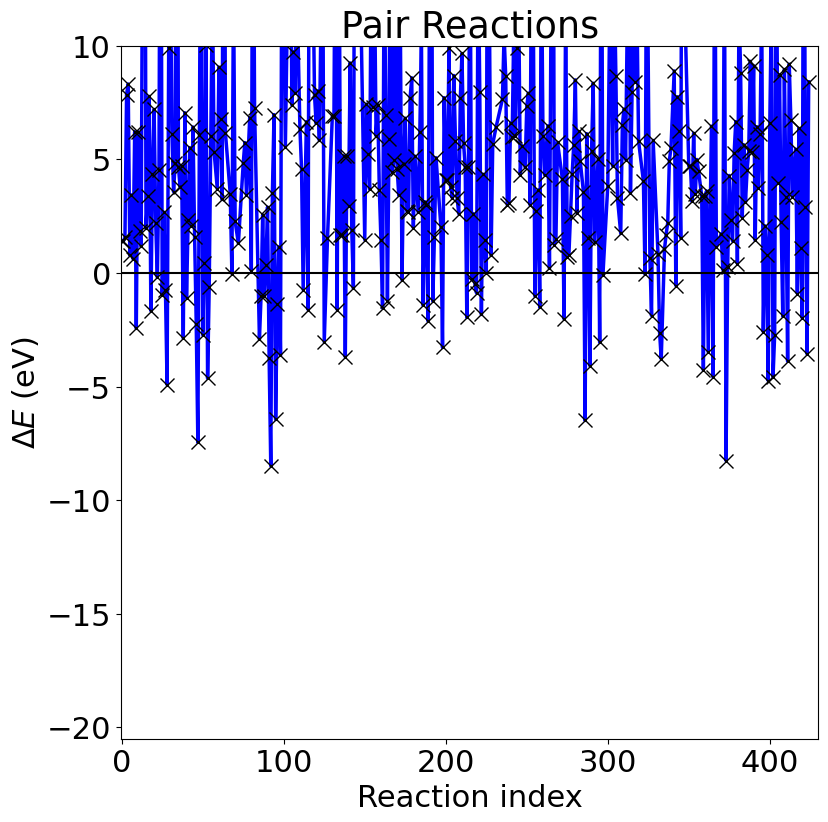

In [15]:
plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})  
plt.plot(df.del_E,'x-',ms=10,lw=2.5,c='b',mec='k')
plt.axhline(c='k')
plt.xlabel('Reaction index')
plt.ylabel(r'$\Delta E$ (eV)')
plt.ylim([-20.5,10])
plt.xlim([-0.5,430])
plt.title('Pair Reactions');
#plt.savefig('pair_energies.jpg',dpi=200);

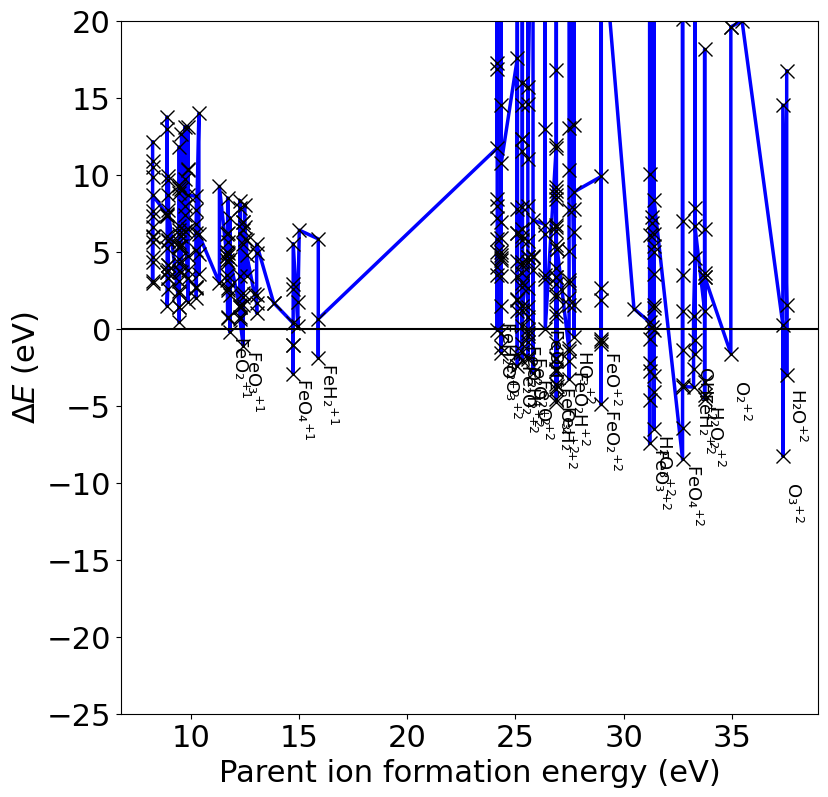

In [18]:
SUB = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
nndf = df.sort_values('Efp')
fd = nndf.loc[nndf.del_E<0].groupby('Efp',as_index=False).agg(min)
plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})  
plt.plot(nndf.Efp,nndf.del_E,'x-',ms=10,lw=2.5,c='b',mec='k')
for i,r in fd.iterrows():
    plt.annotate(r.parent.translate(SUB)+f'$^{{+{str(r.cp)}}}$',
                 [r.Efp,r.del_E],
                 xytext=(-0, -45),
                 textcoords='offset points',rotation=-90,fontsize=13)
plt.axhline(c='k')
plt.xlabel('Parent ion formation energy (eV)')
plt.ylabel(r'$\Delta E$ (eV)')
plt.ylim([-25,20]);

#plt.xlim([-0.5,430])
#plt.title('Pair Reactions');
#plt.savefig('pair_energies.jpg',dpi=200);

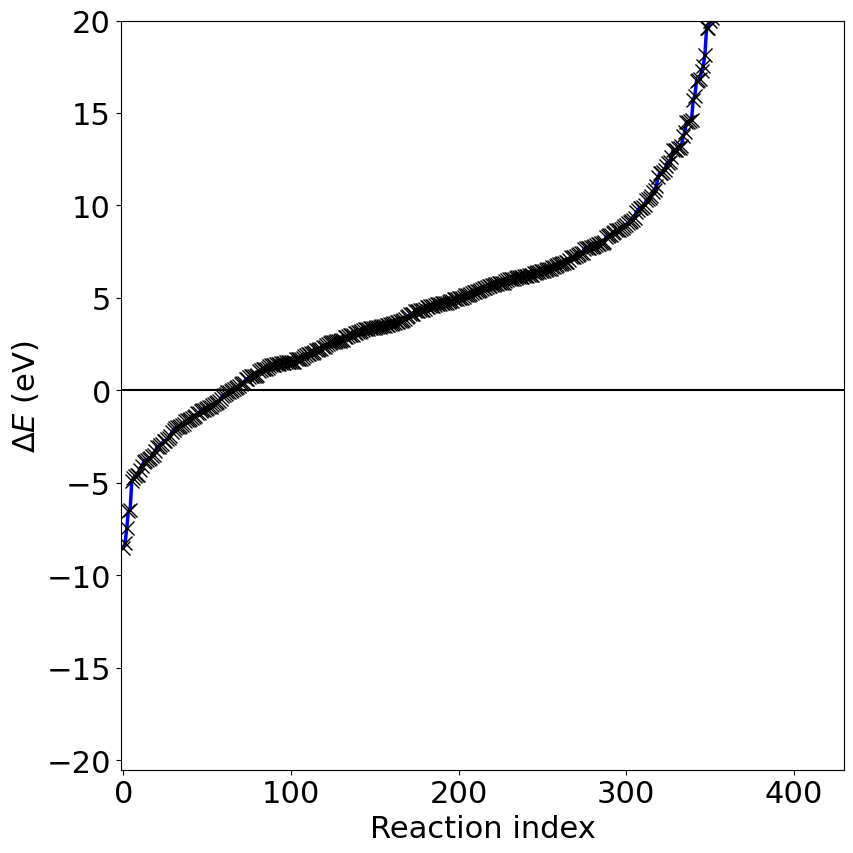

In [26]:
ndf = df.sort_values('del_E')
plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})  
plt.plot(np.arange(0,len(ndf)),ndf.del_E,'x-',ms=10,lw=2.5,c='b',mec='k')
plt.axhline(c='k')
plt.xlabel('Reaction index')
plt.ylabel(r'$\Delta E$ (eV)')
plt.ylim([-20.5,20])
plt.xlim([-1.5,430])
plt.tight_layout()
plt.savefig('reactions_pair_sorted.jpg',dpi=300);
#plt.title('Pair Reactions');

## All reactions with negative reaction energies

In [23]:
# neg_pairs.to_csv("Negative_energies_pair_reactions.csv")
neg_pairs.head(40)

,parent,cp,daughter_1,cd1,daughter_2,cd2,del_E,Efp
0,Fe2O2,2,FeO,1,FeO,1,-2.441297,25.088218
1,Fe2O2,2,Fe,1,FeO2,1,-1.663269,25.088218
2,FeO2,1,O2,0,Fe,1,-0.191133,11.808041
3,FeO2,2,FeO,1,O,1,-0.968062,28.962099
4,FeO2,2,O2,0,Fe,2,-0.770218,28.962099
5,FeO2,2,O2,1,Fe,1,-4.918104,28.962099
6,Fe2O,2,FeO,1,Fe,1,-2.873033,25.813401
7,FeO3,1,O2,0,FeO,1,-1.100918,12.424379
8,FeO3,2,O2,0,FeO,2,-2.235497,31.202956
9,FeO3,2,O2,1,FeO,1,-7.45241,31.202956


# Read APT data in .epos format

In [34]:
elements_mass = {'Fe': 55.847, 'O': 15.9994, 'H': 1.00784} # dictionary with elements mass


path = r'/Users/shyamkatnagallu/Dropbox/Mac/Downloads/FeO/Fe oxides/R5076_69145/recons/recon-v01/default/R5076_69145-v01.epos'
epos = corr.read_epos(path)
m = epos[:, 3]
ipp = epos[:, 10]
dx = epos[:,-4]
dy = epos[:,-3]

In [141]:
nat_pulse = epos[:,9]

In [172]:
len(np.where((ipp>1)| (ipp==0))[0]) / len(epos)

0.5507743450226176

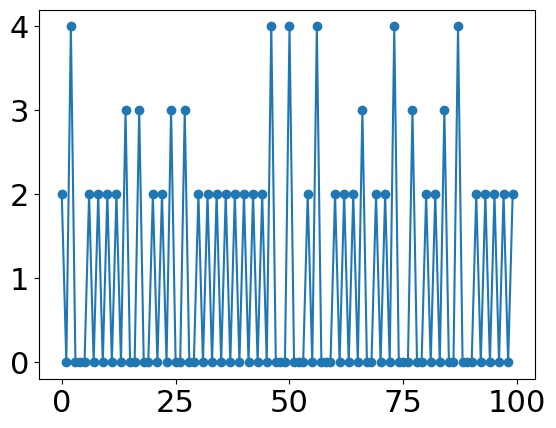

In [175]:
plt.plot(ipp[np.where((ipp>1)| (ipp==0))[0]][:100],'o-')

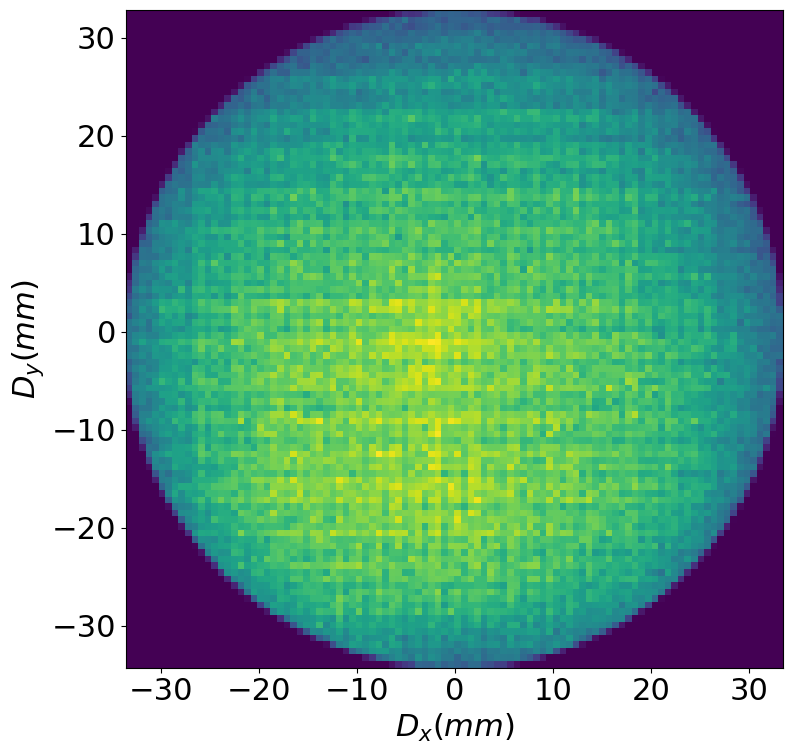

In [142]:
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx[nat_pulse<10],dy[nat_pulse<10],bins=100)
plt.axis('square')
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout();

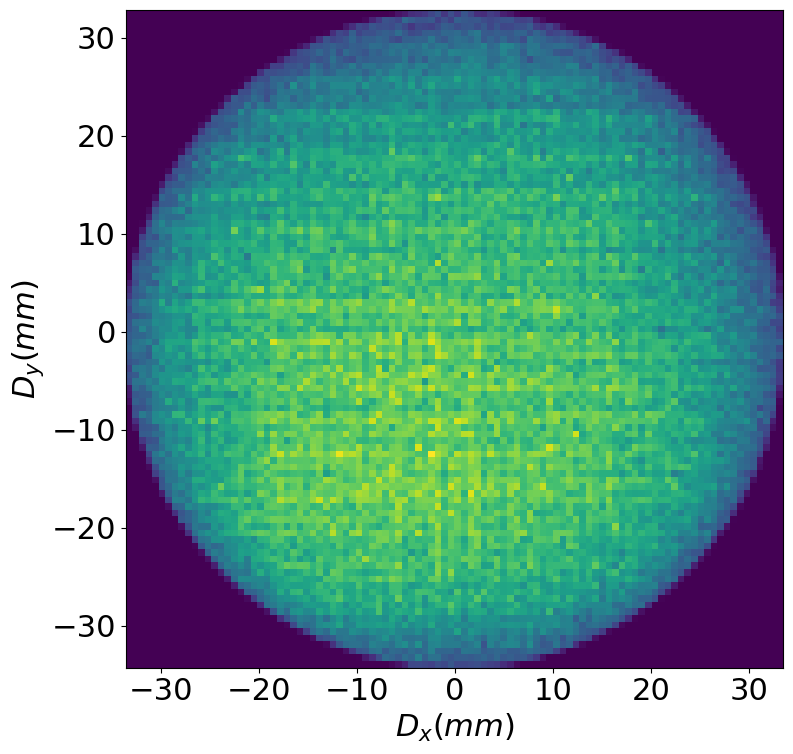

In [143]:
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx[ipp>1],dy[ipp>1],bins=100)
plt.axis('square')
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout();

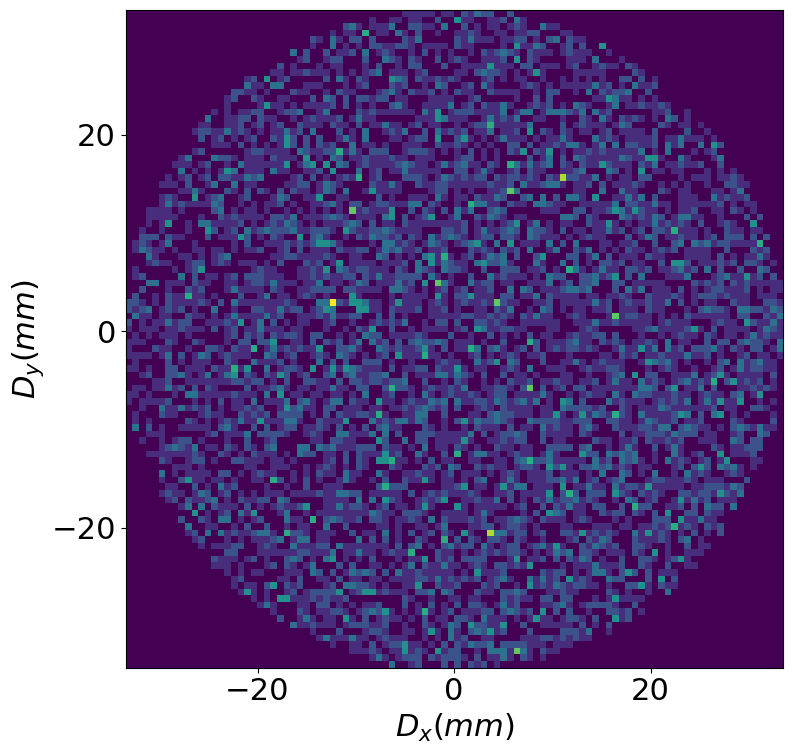

In [179]:
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx[m<3],dy[m<3],bins=100)
plt.axis('square')
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.xticks(np.arange(-20,25,20))
plt.yticks(np.arange(-20,25,20))
#plt.yticks(np.arange(-30,35,10))
plt.tight_layout()
plt.savefig('FeO_hydrogen_det.jpg',dpi=300);

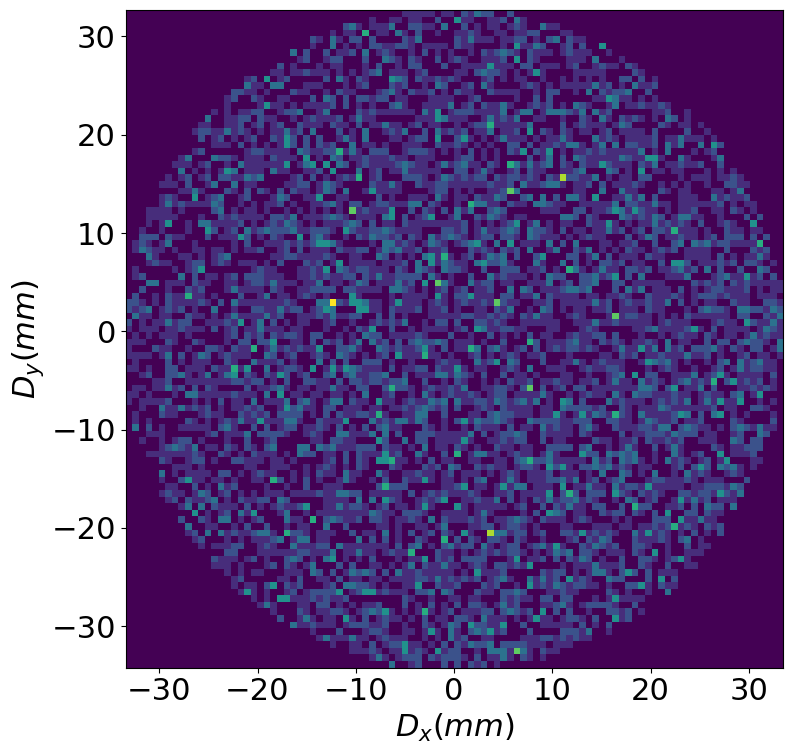

In [144]:
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx[m<3],dy[m<3],bins=100)
plt.axis('square')
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout();

In [132]:
len(epos)

4936430

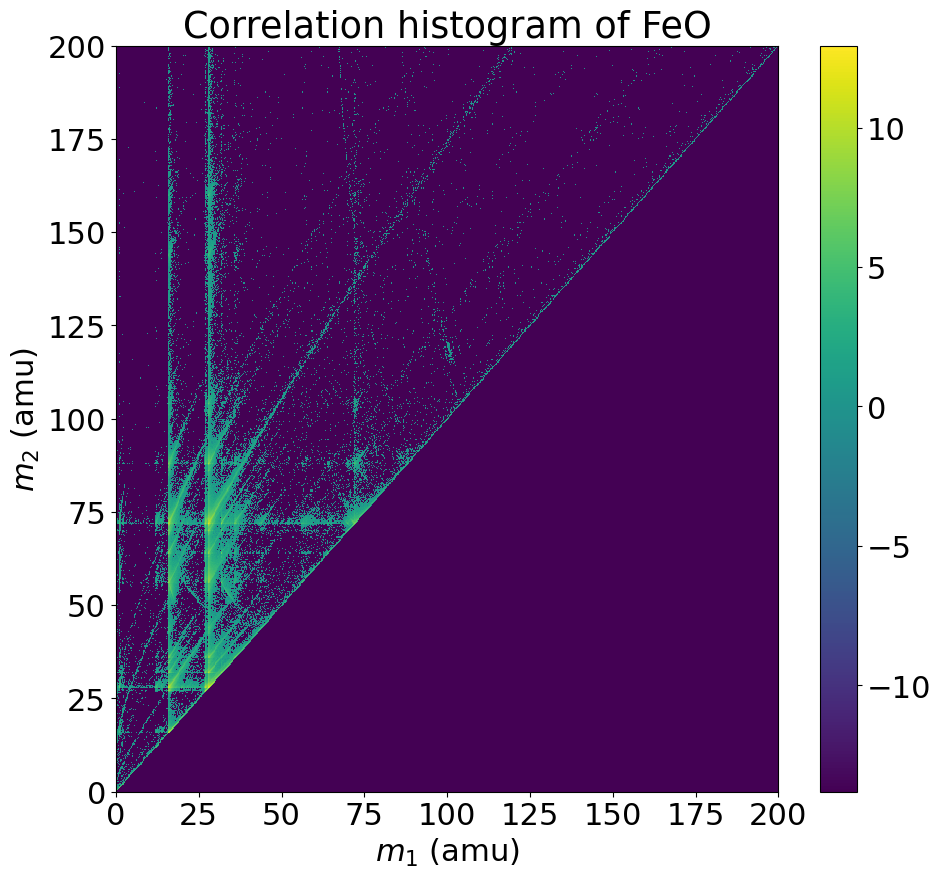

In [35]:
m1, m2,new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)

ind = np.where((m1 < 200) & (m2 < 200))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)

X, Y = np.meshgrid(m1e, m2e)



plt.figure(figsize=(10, 9))
plt.rcParams.update({'font.size': 22})

plt.pcolormesh(X, Y, np.log(h + 1e-6)) #adding a noise of 1e-6 for better visualisation

plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.xlim([0, 200])
plt.ylim([0, 200])
plt.xticks(np.linspace(0,200,9))
plt.yticks(np.linspace(0,200,9))
plt.tight_layout()
plt.title('Correlation histogram of FeO')
#plt.savefig('CorrelationHistogram_FeO.jpg',dpi=300)
plt.show()


## Tracing all negative energy reactions on the correlation histogram

0 Fe2O2 + 2 -> FeO + 1  +  FeO + 1 := -2.441296728443782


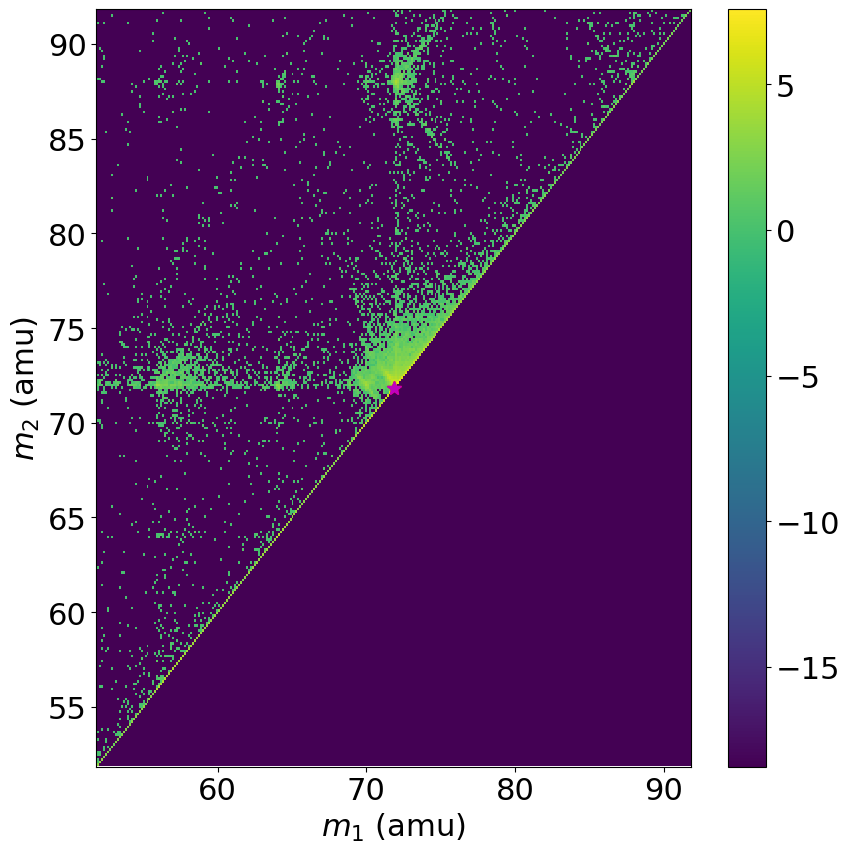

1 Fe2O2 + 2 -> Fe + 1  +  FeO2 + 1 := -1.6632687729076845


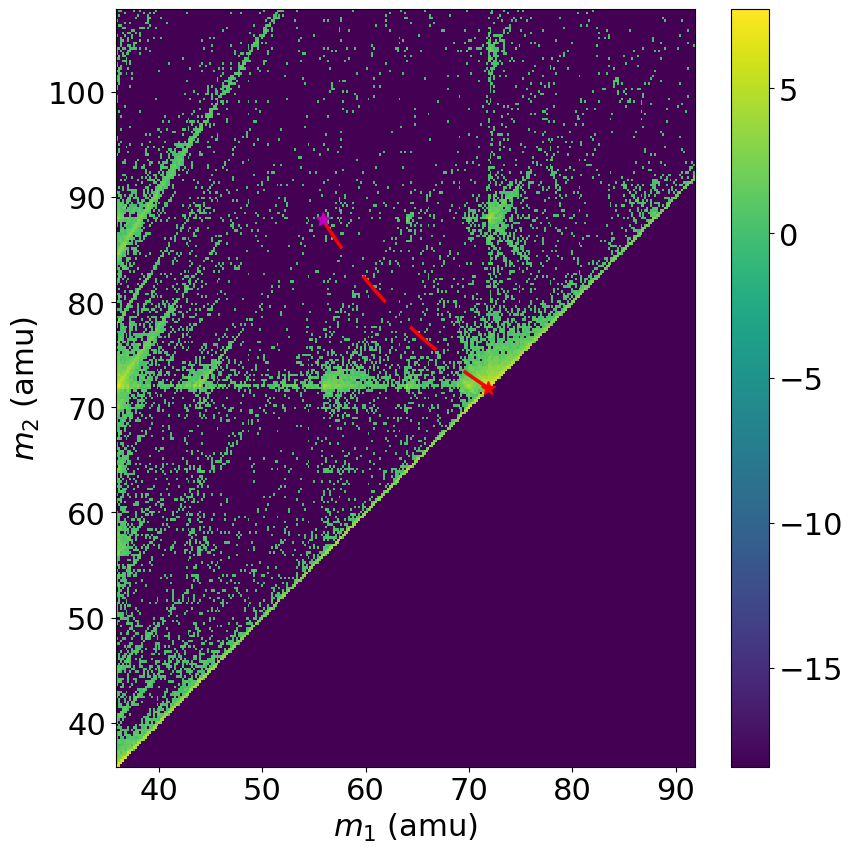

2 FeO2 + 1 -> Fe + 1  +  O2 + 0 := -0.19113277699185377


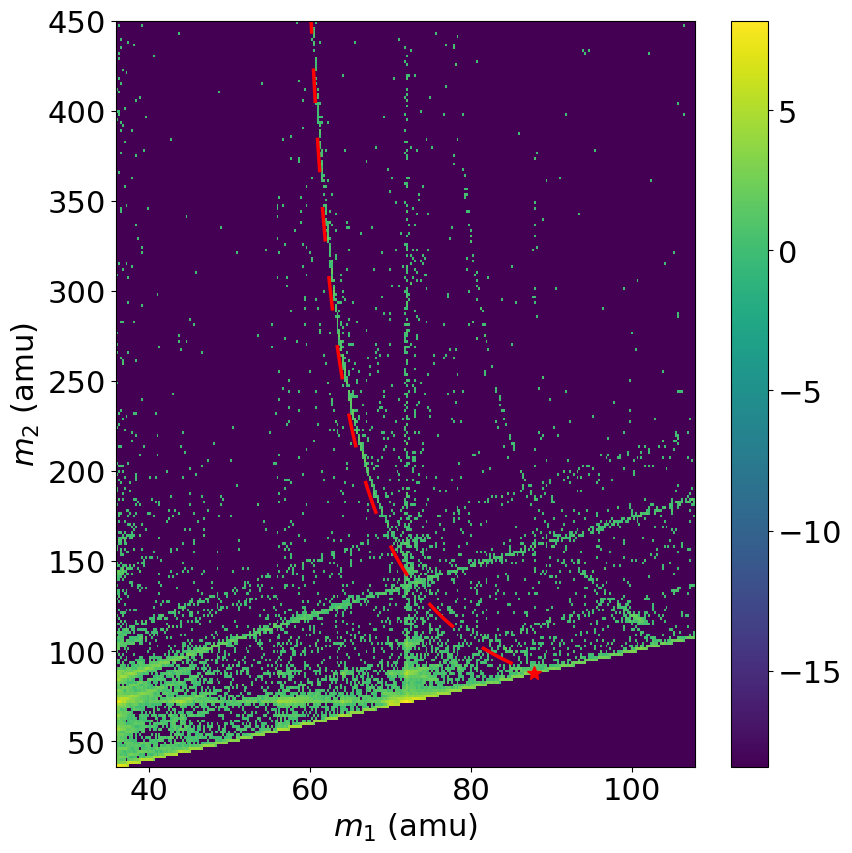

3 FeO2 + 2 -> O + 1  +  FeO + 1 := -0.9680619367582578


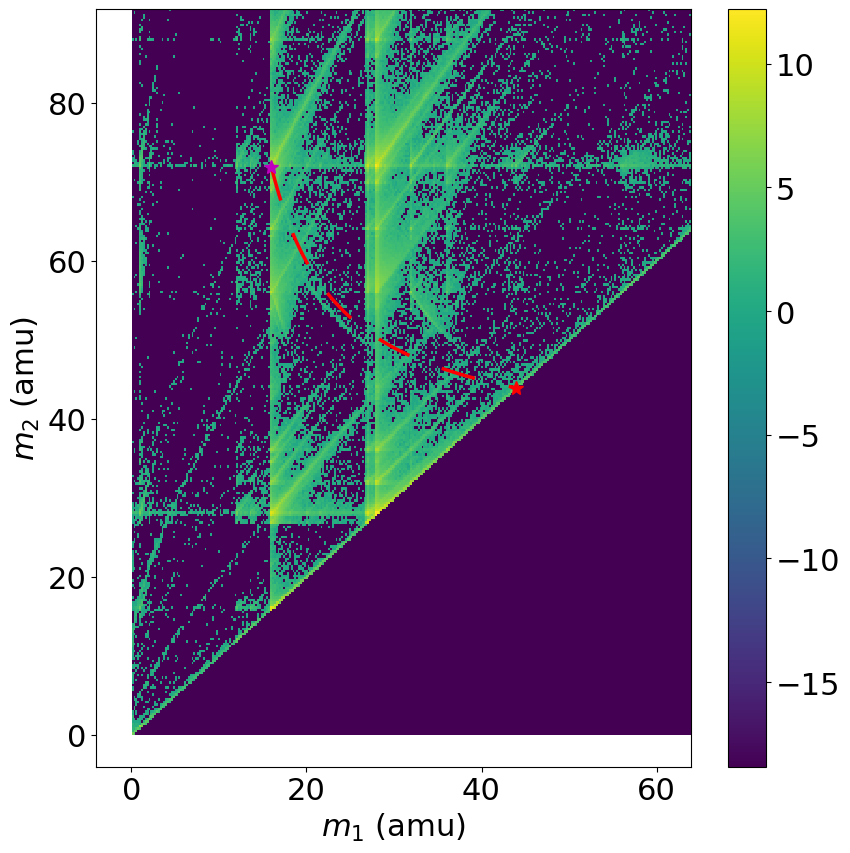

4 FeO2 + 2 -> Fe + 1  +  O2 + 1 := -4.918104315944823


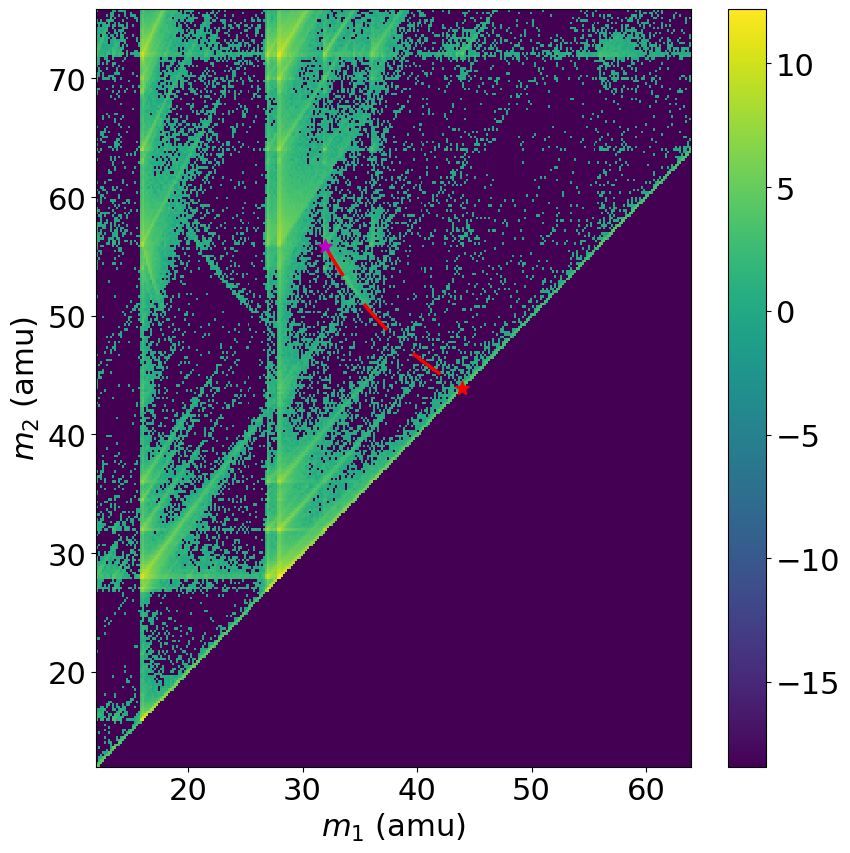

5 FeO2 + 2 -> Fe + 2  +  O2 + 0 := -0.7702182876877485


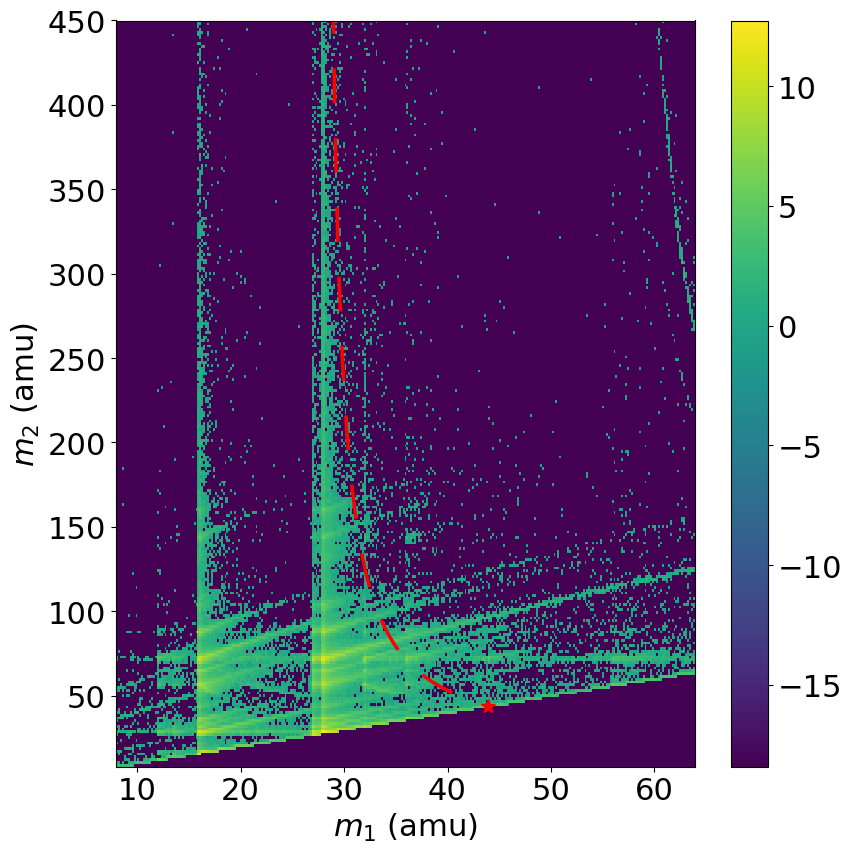

6 Fe2O + 2 -> FeO + 1  +  Fe + 1 := -2.8730325826277254


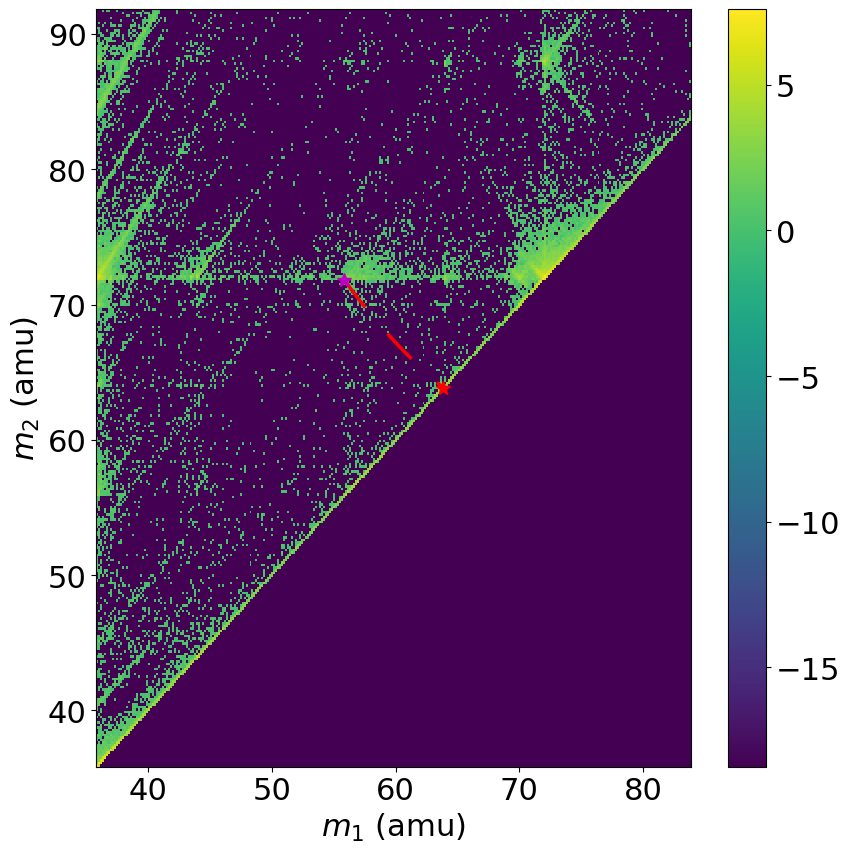

7 FeO3 + 1 -> FeO + 1  +  O2 + 0 := -1.1009182647386626


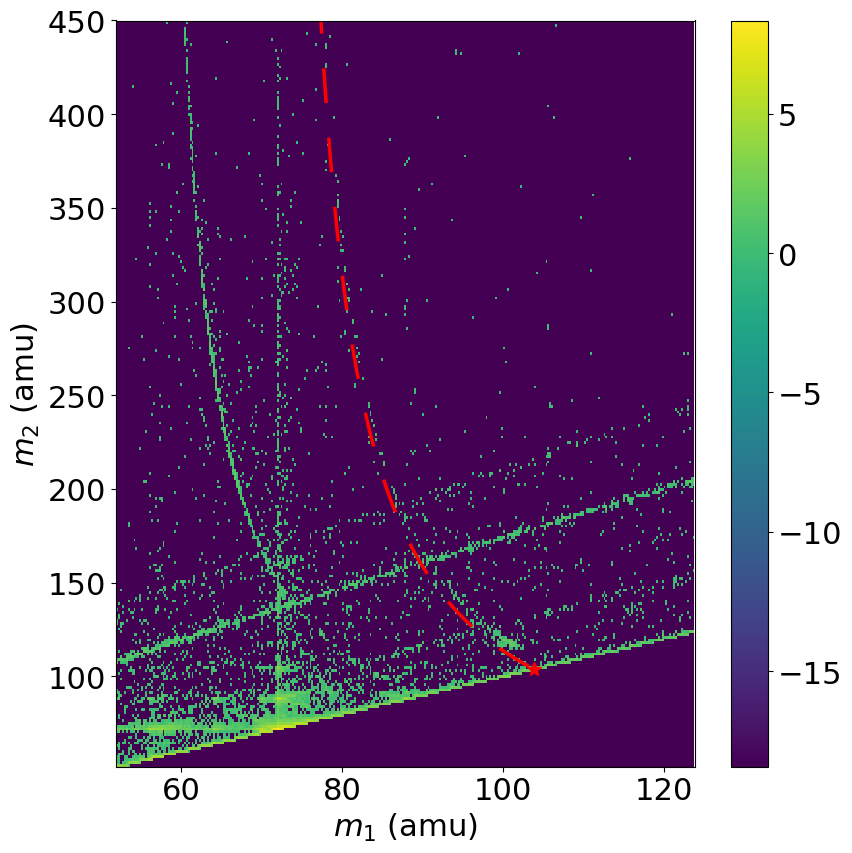

8 FeO3 + 2 -> FeO + 1  +  O2 + 1 := -7.45240956257768


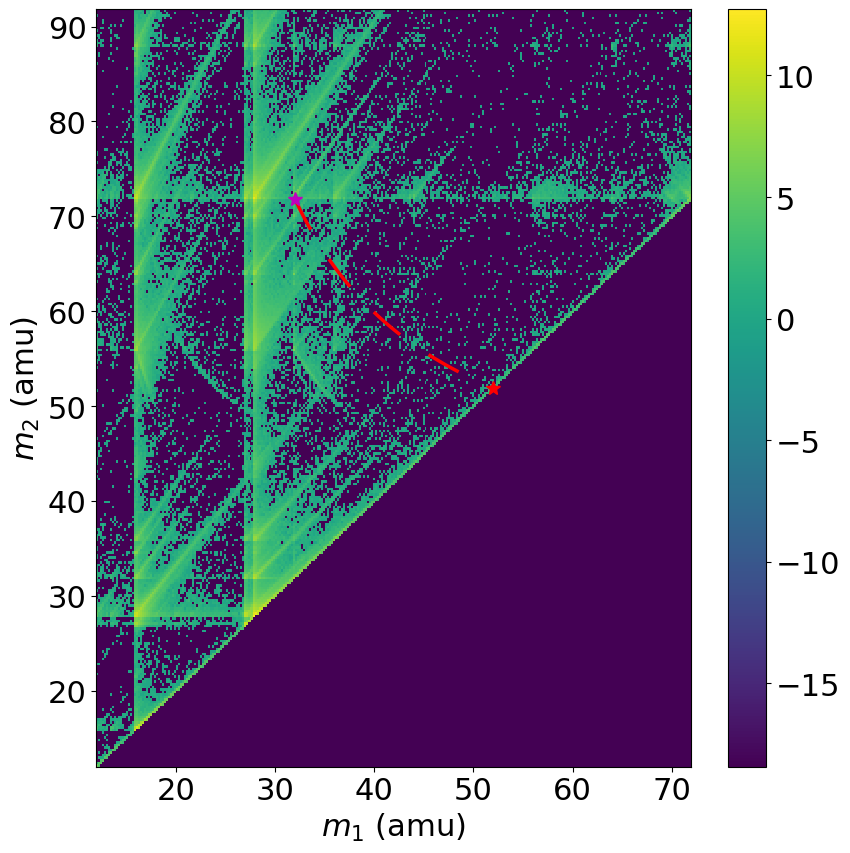

9 FeO3 + 2 -> FeO + 2  +  O2 + 0 := -2.2354970142683417


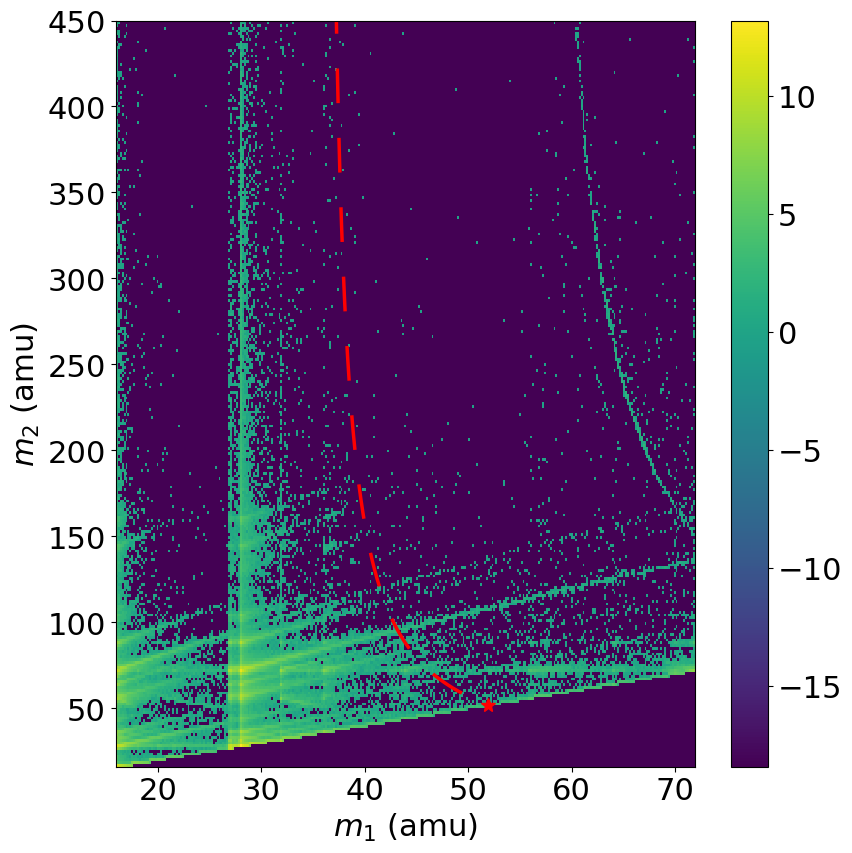

10 FeO3 + 2 -> O + 1  +  FeO2 + 1 := -2.72433922784883


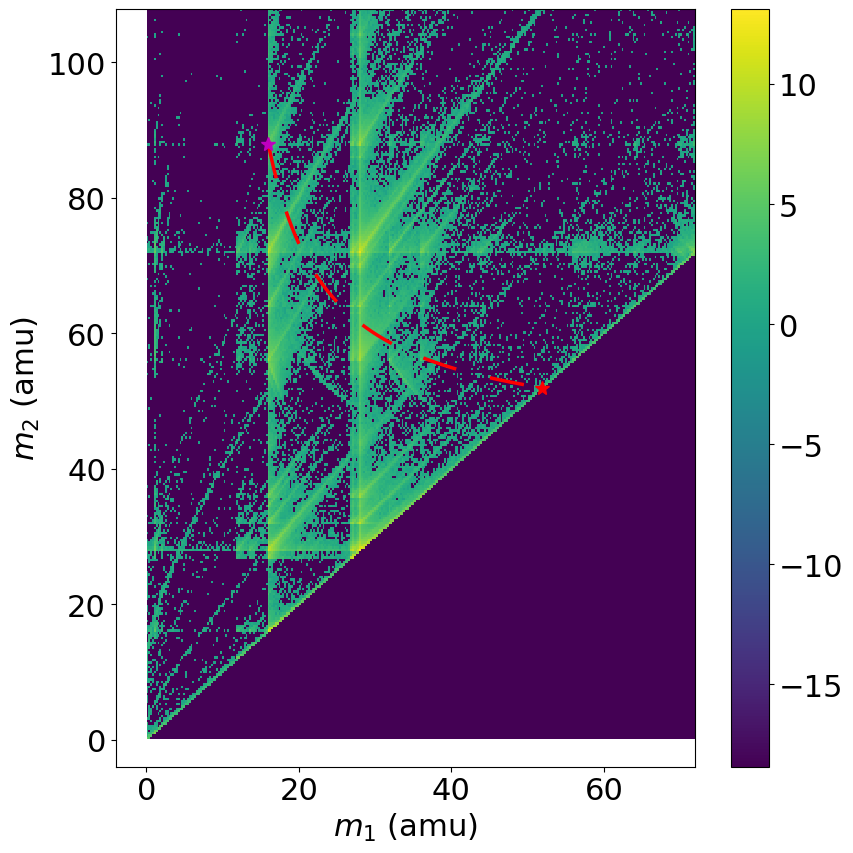

11 FeO3 + 2 -> Fe + 1  +  O3 + 1 := -4.636262382900515


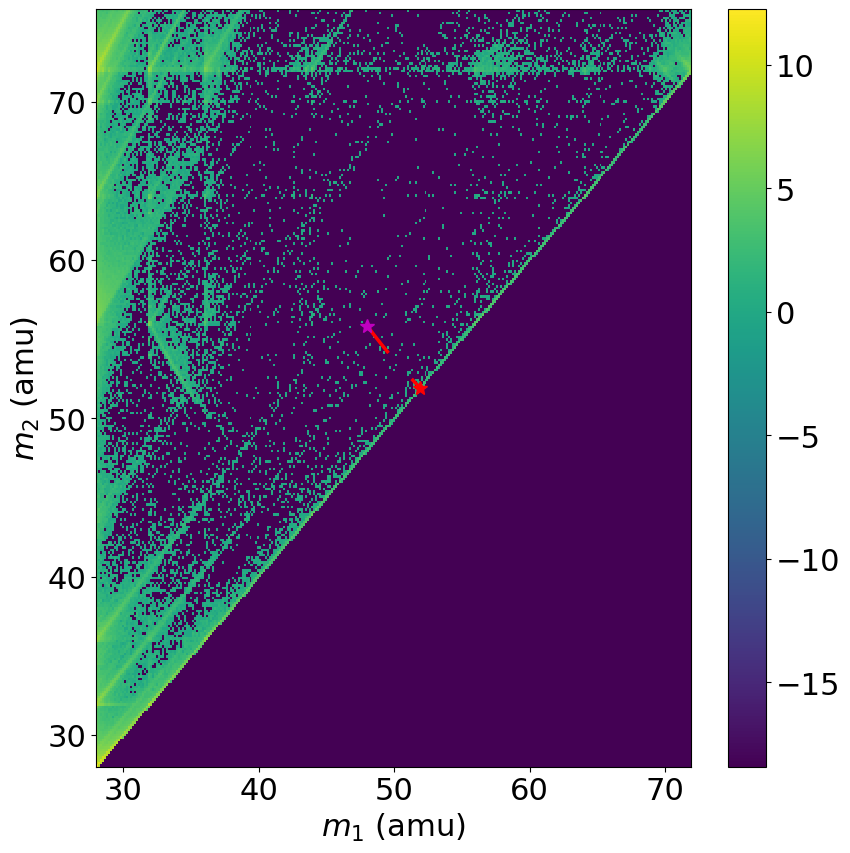

12 FeO3 + 2 -> Fe + 2  +  O3 + 0 := -0.6376172025148219


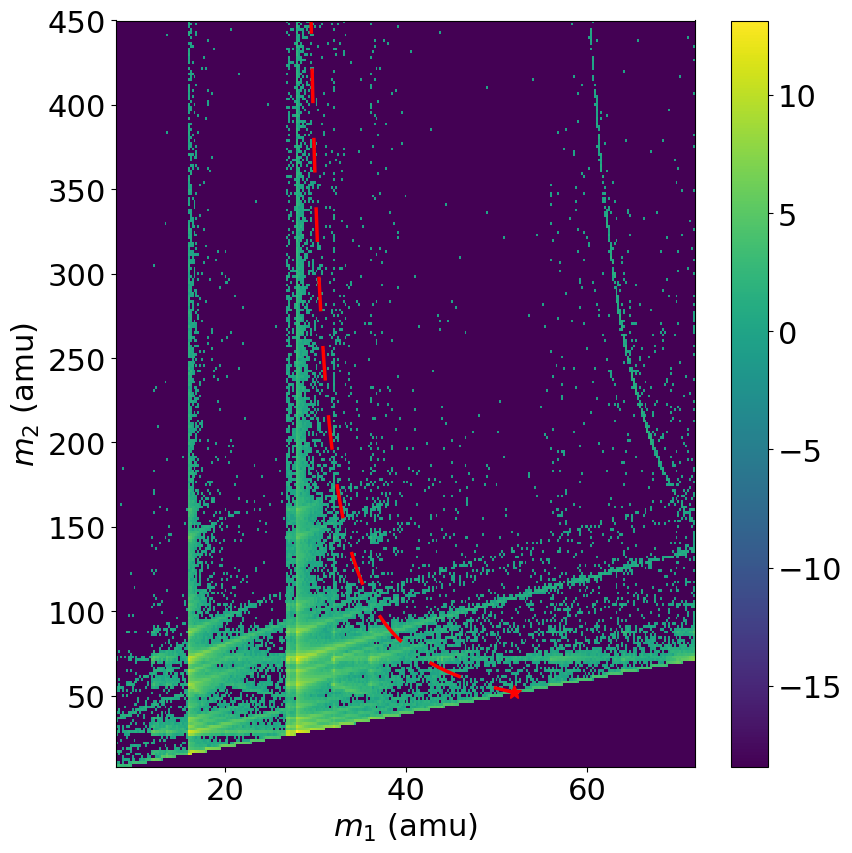

13 FeOH + 2 -> Fe + 1  +  OH + 1 := -0.02786445951978655


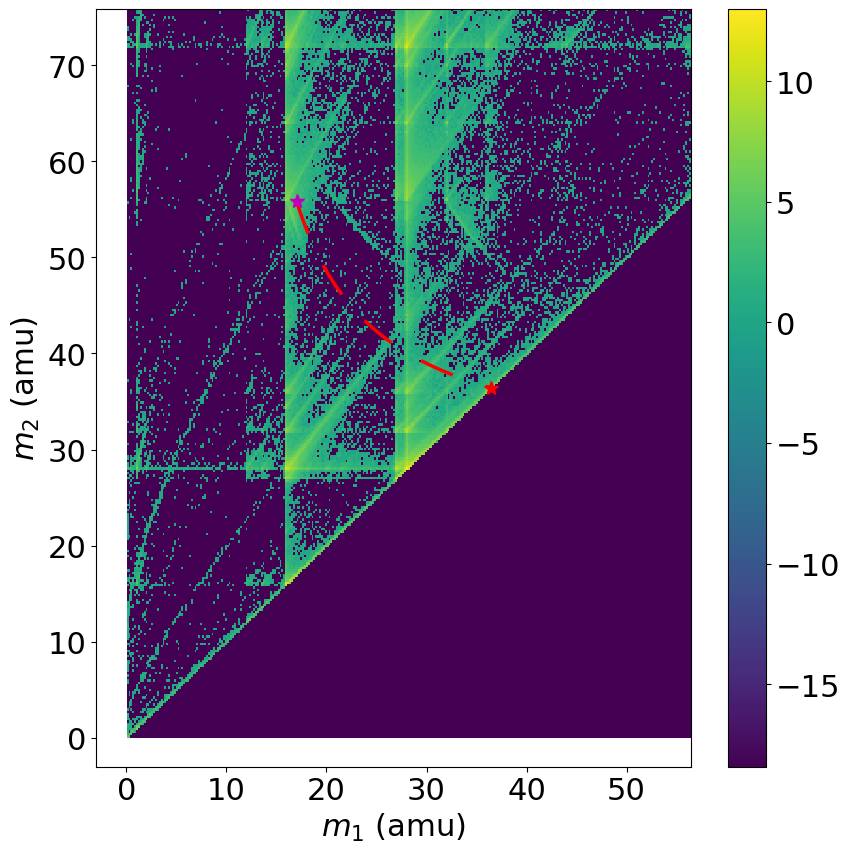

14 FeO4 + 1 -> O2 + 0  +  FeO2 + 1 := -2.9197817441916714


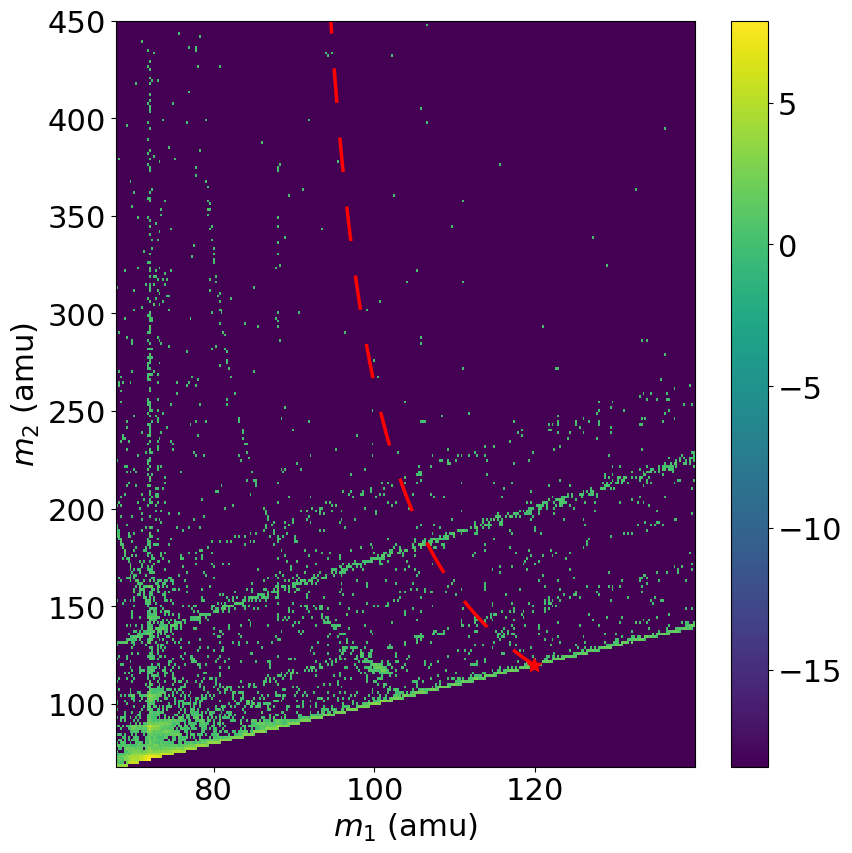

15 FeO4 + 1 -> O2 + 1  +  FeO2 + 0 := -1.0316652867411364


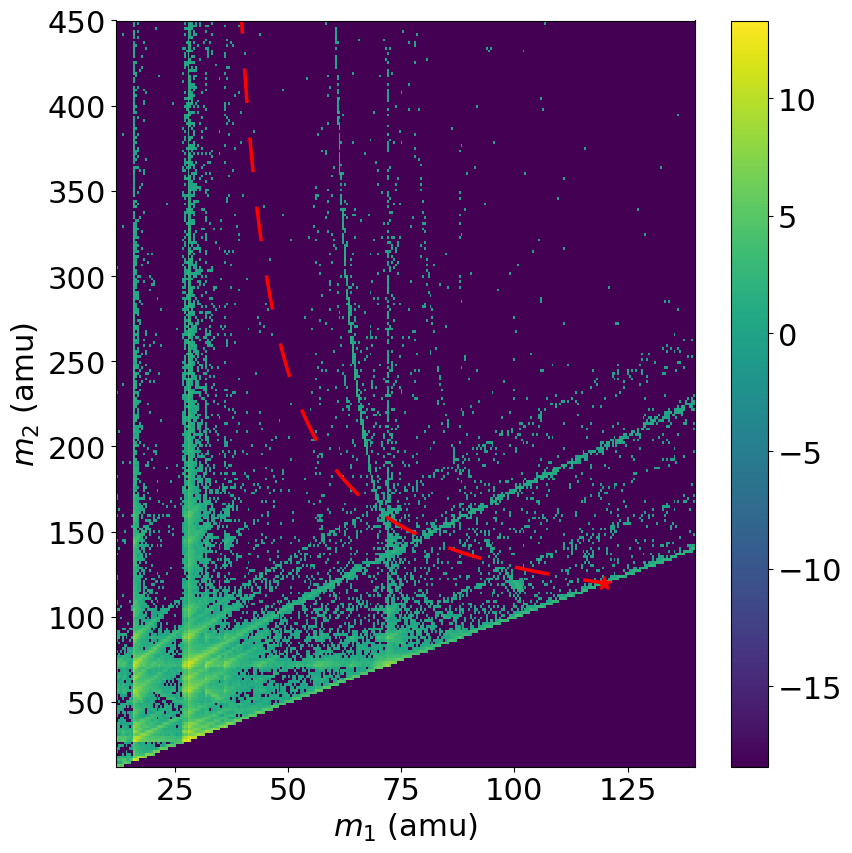

16 FeO4 + 1 -> FeO + 1  +  O3 + 0 := -1.0309033679281723


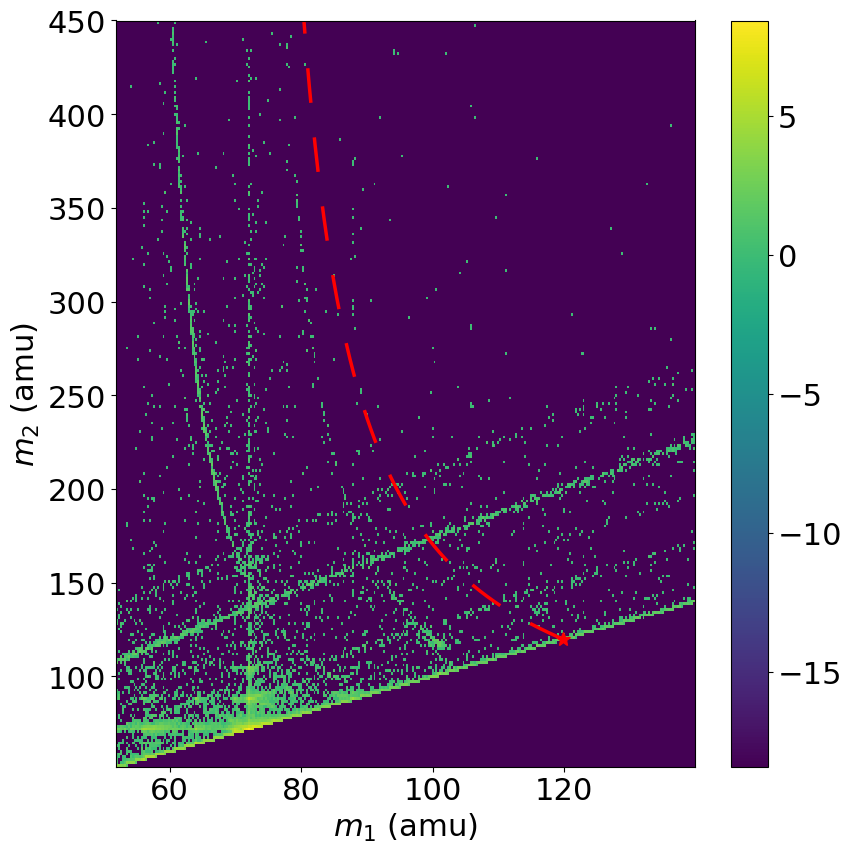

17 FeO4 + 2 -> O2 + 0  +  FeO2 + 2 := -3.7606135791981847


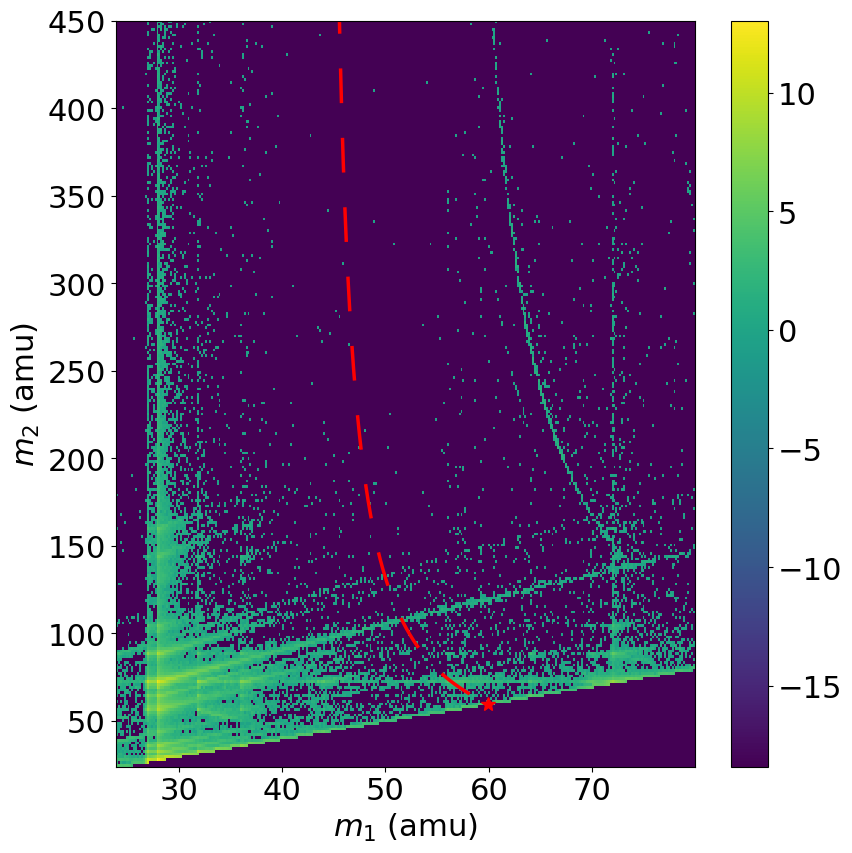

18 FeO4 + 2 -> O2 + 1  +  FeO2 + 1 := -8.487585118151154


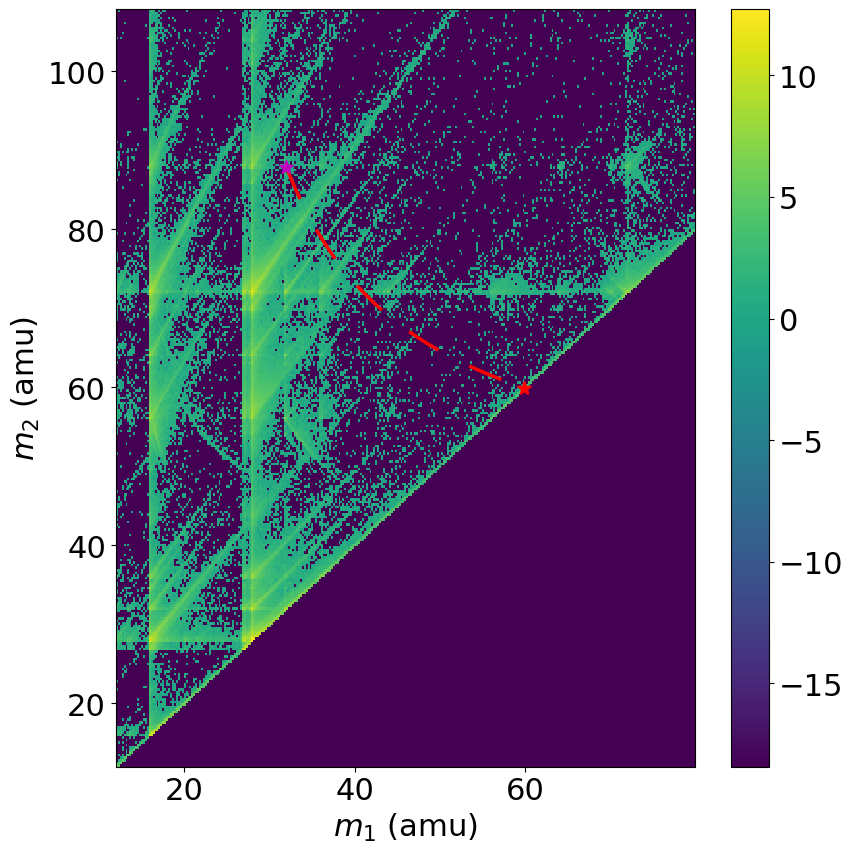

19 FeO4 + 2 -> FeO + 1  +  O3 + 1 := -6.4494658940162735


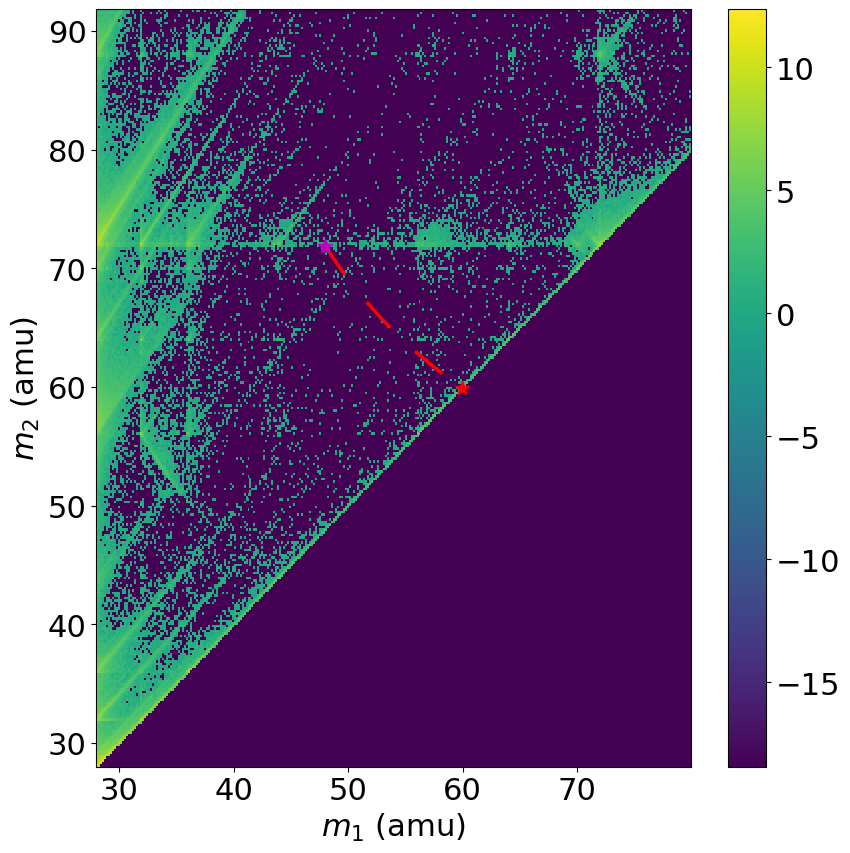

20 FeO4 + 2 -> FeO + 2  +  O3 + 0 := -1.3817941935783171


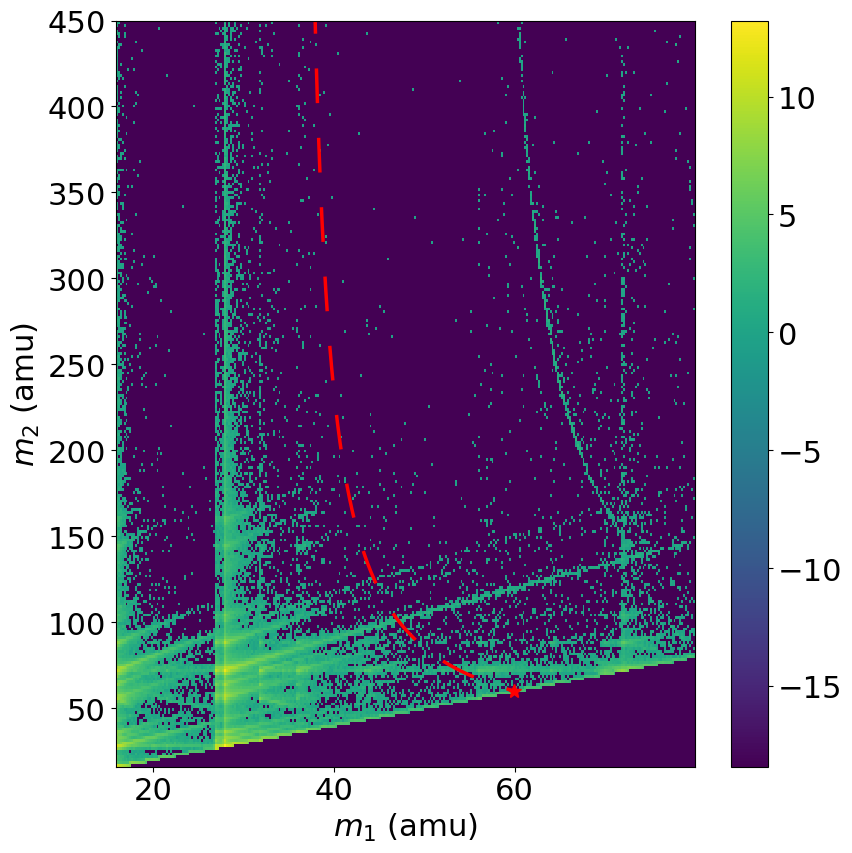

21 FeO4 + 2 -> O + 1  +  FeO3 + 1 := -3.62775725121778


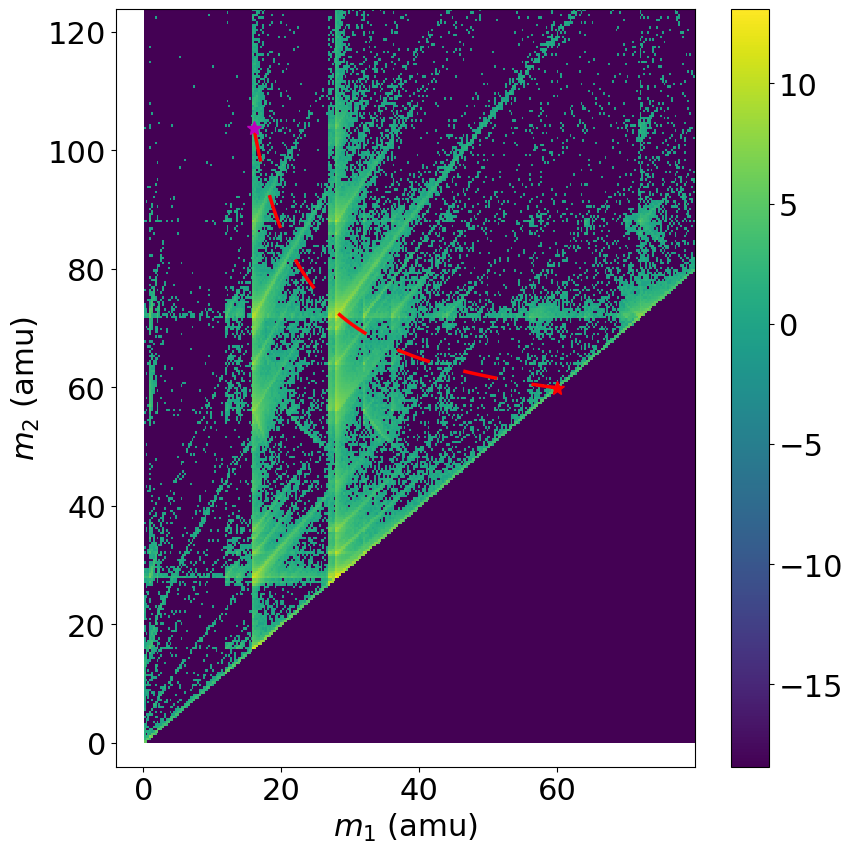

22 OH3 + 2 -> OH + 1  +  H2 + 1 := -0.7351585117914134


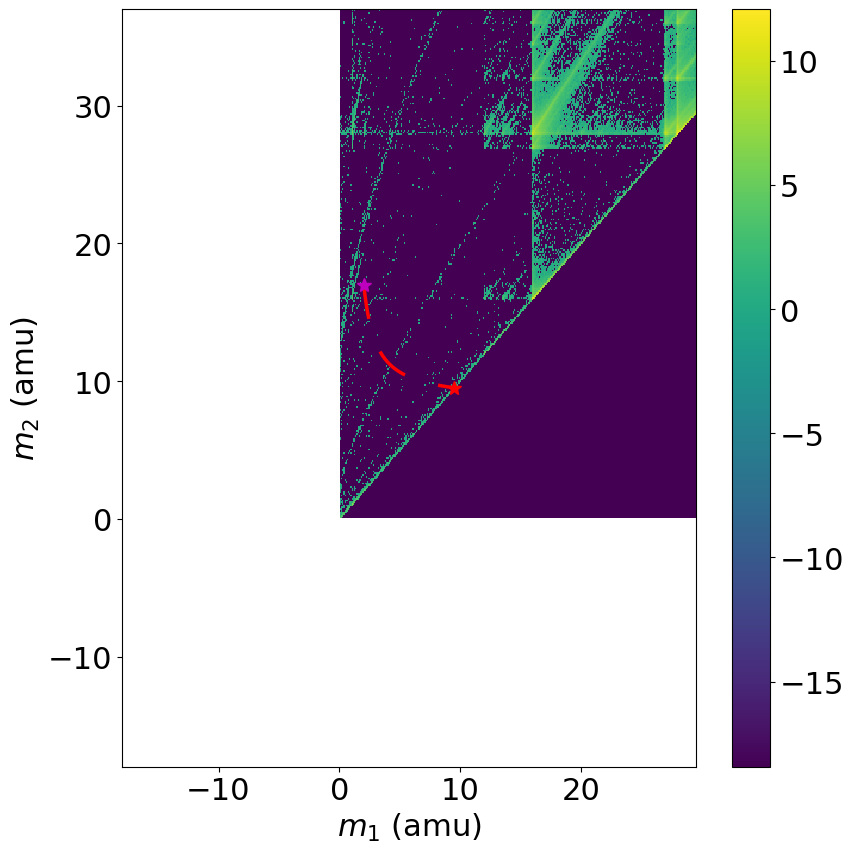

23 OH3 + 2 -> O + 1  +  H3 + 1 := -1.6117749523890543


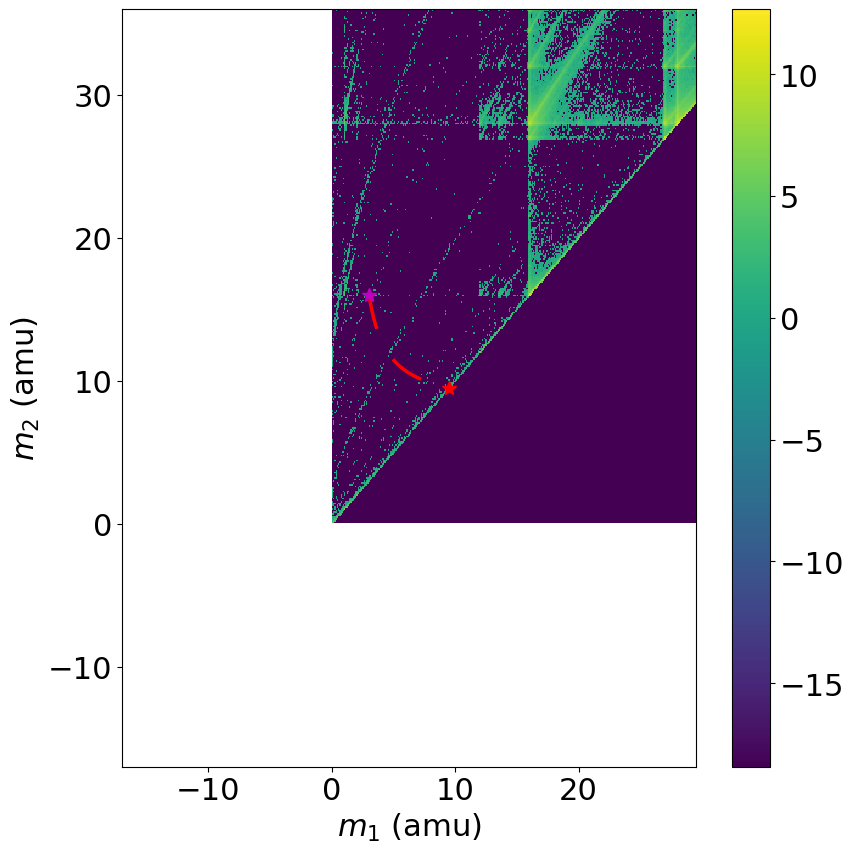

24 H2O + 2 -> H2 + 1  +  O + 1 := -3.0367266766603263


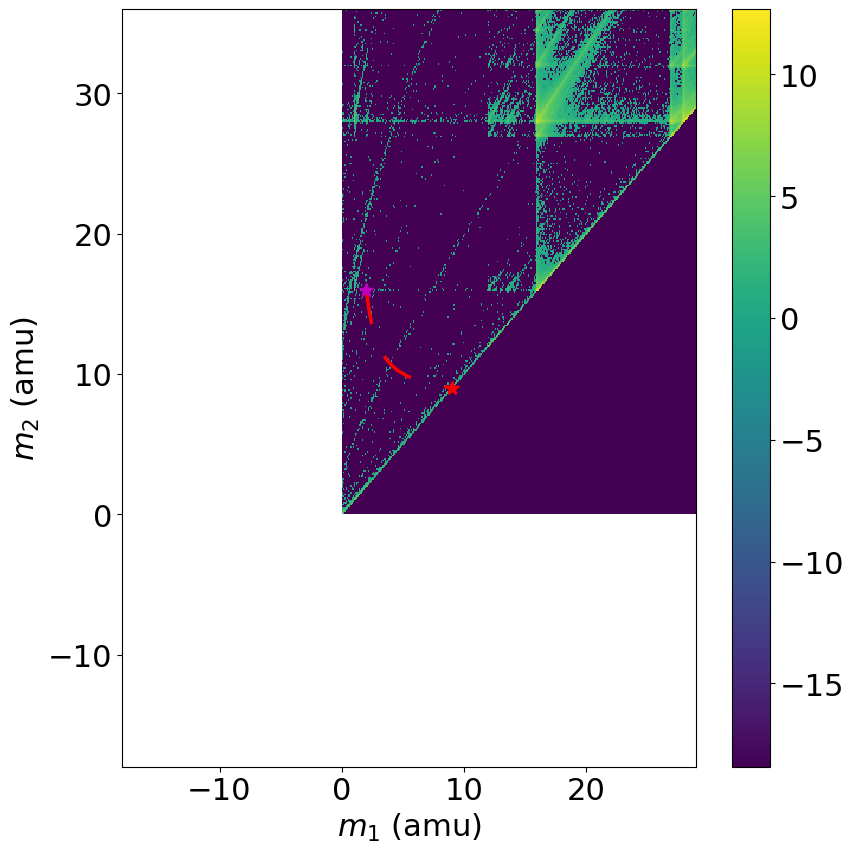

25 O2 + 2 -> O + 1  +  O + 1 := -1.6119219755090217


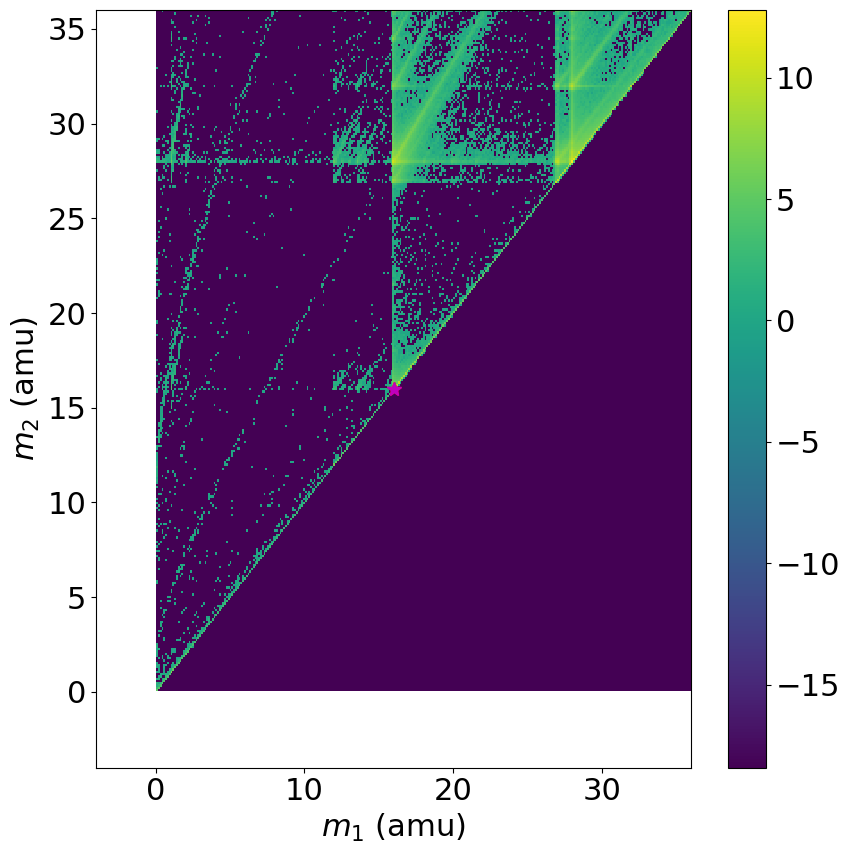

26 Fe2 + 2 -> Fe + 1  +  Fe + 1 := -3.6991974804444654


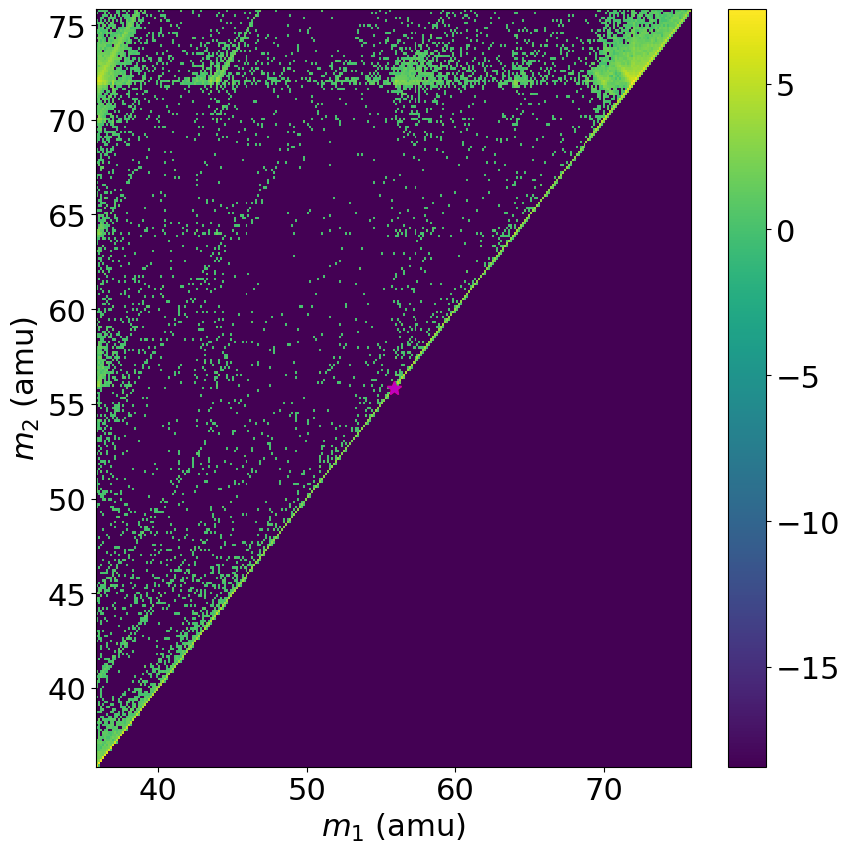

27 FeO + 2 -> Fe + 1  +  O + 1 := -0.679974990572342


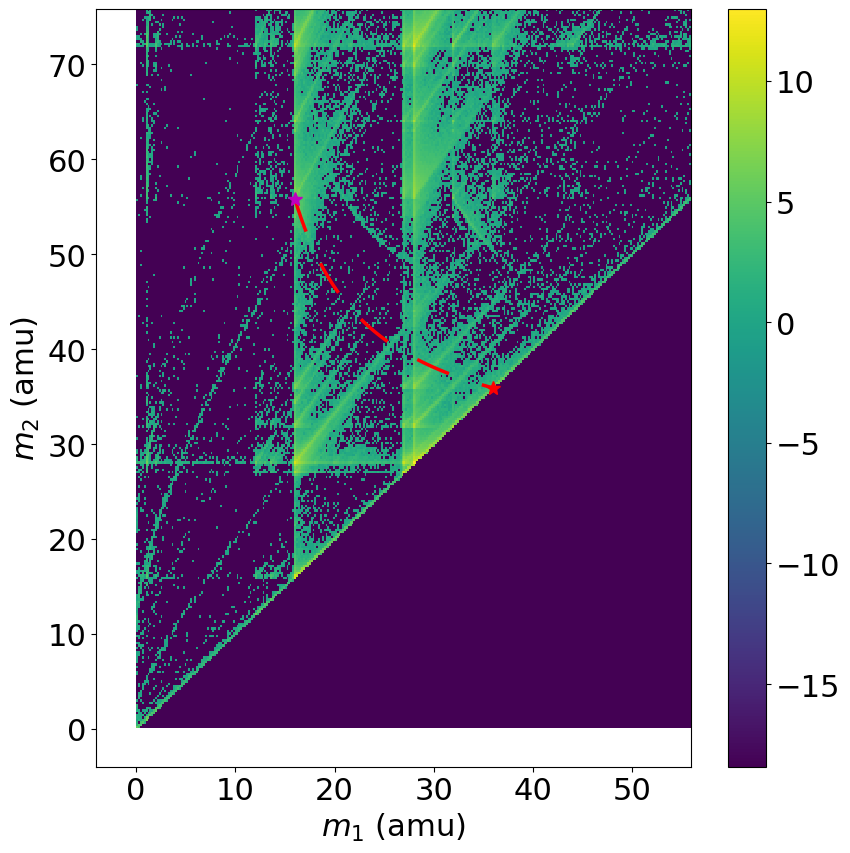

28 Fe2O3 + 2 -> Fe2O + 1  +  O2 + 1 := -1.544028478363273


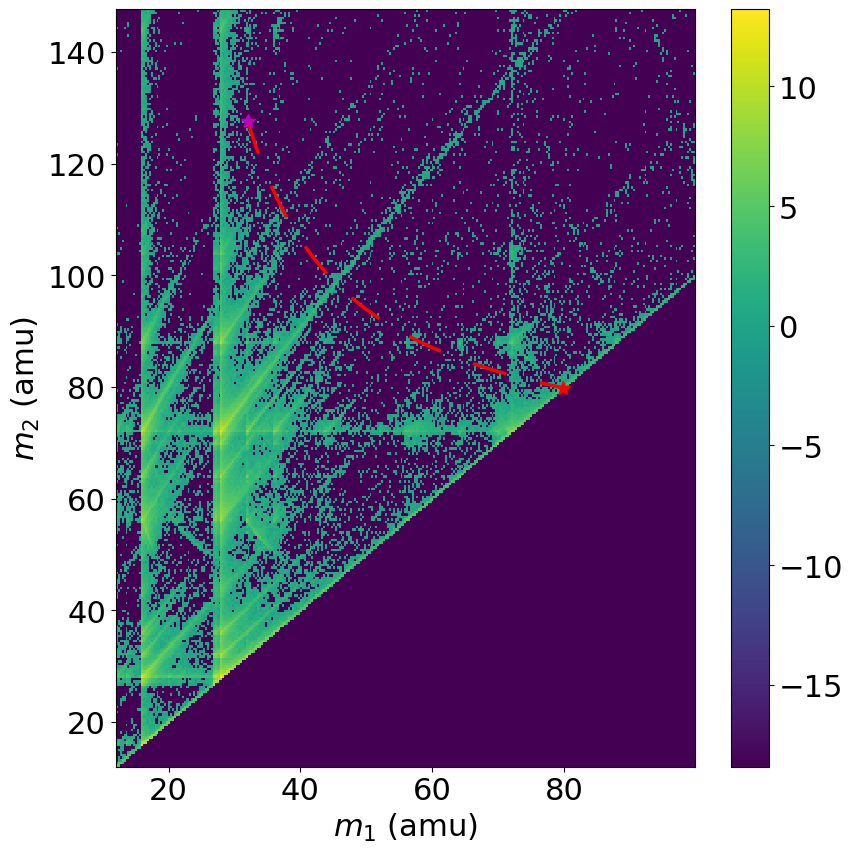

29 Fe2O3 + 2 -> FeO + 1  +  FeO2 + 1 := -1.2132740785461915


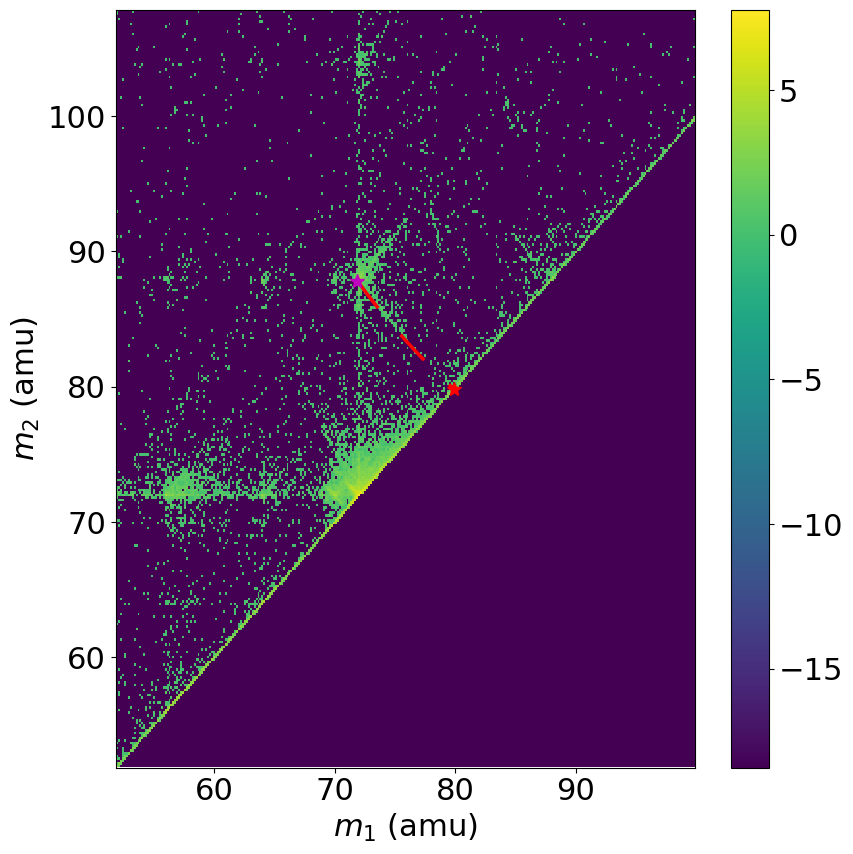

30 Fe2O3 + 2 -> Fe + 1  +  FeO3 + 1 := -0.3034885907993825


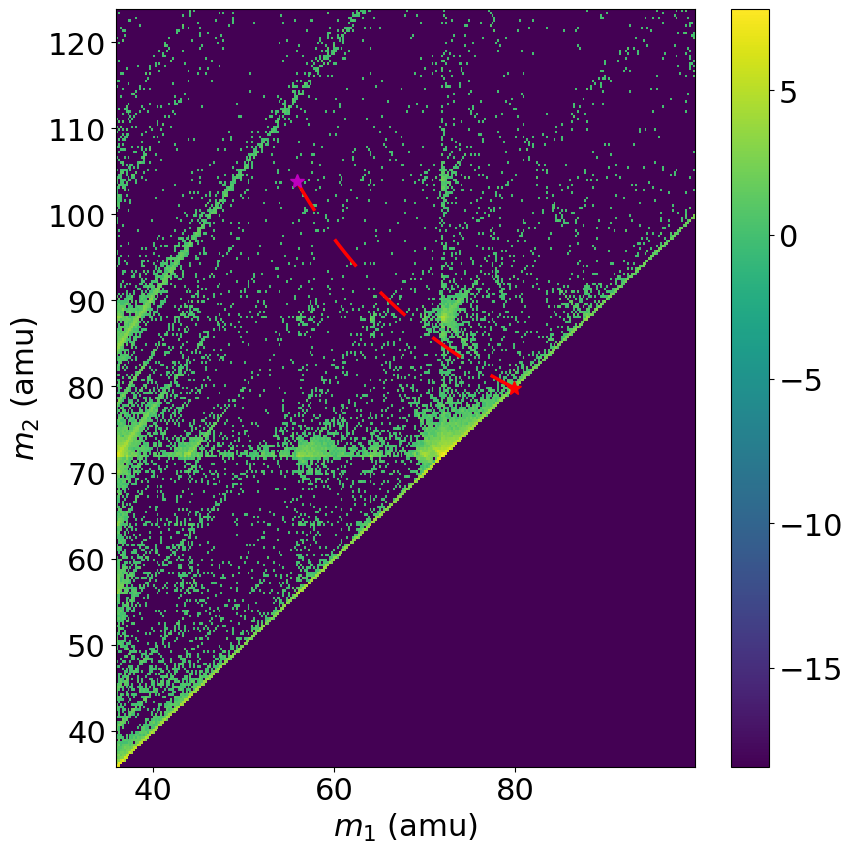

31 FeO2H + 2 -> OH + 1  +  FeO + 1 := -1.4232099234391404


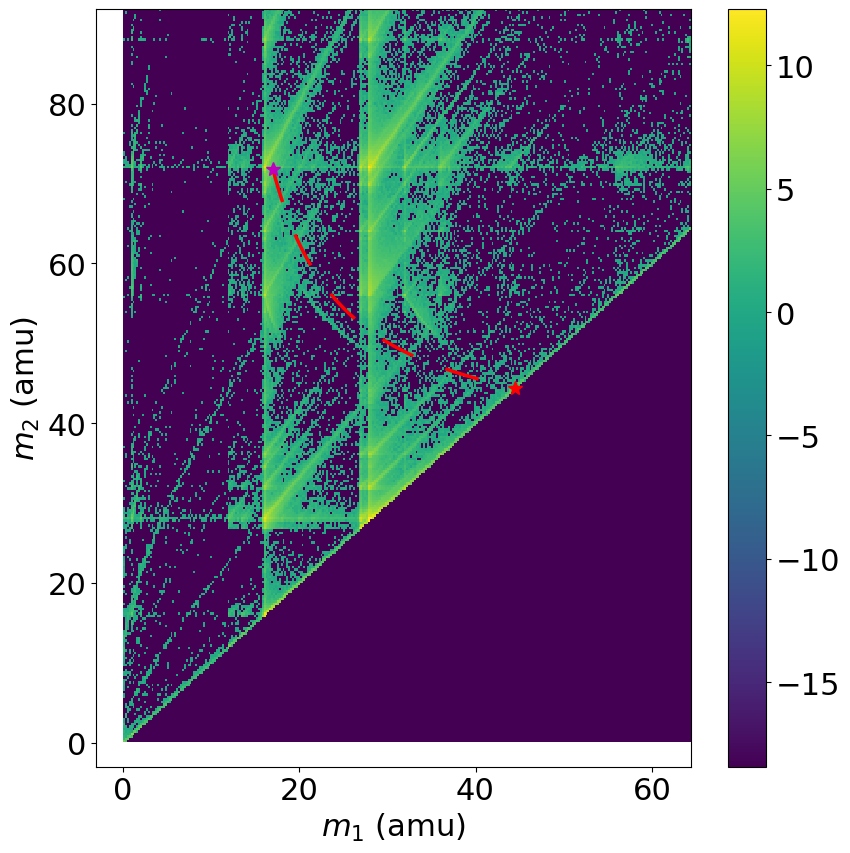

32 FeO2H + 2 -> FeH + 1  +  O2 + 1 := -2.113154621705907


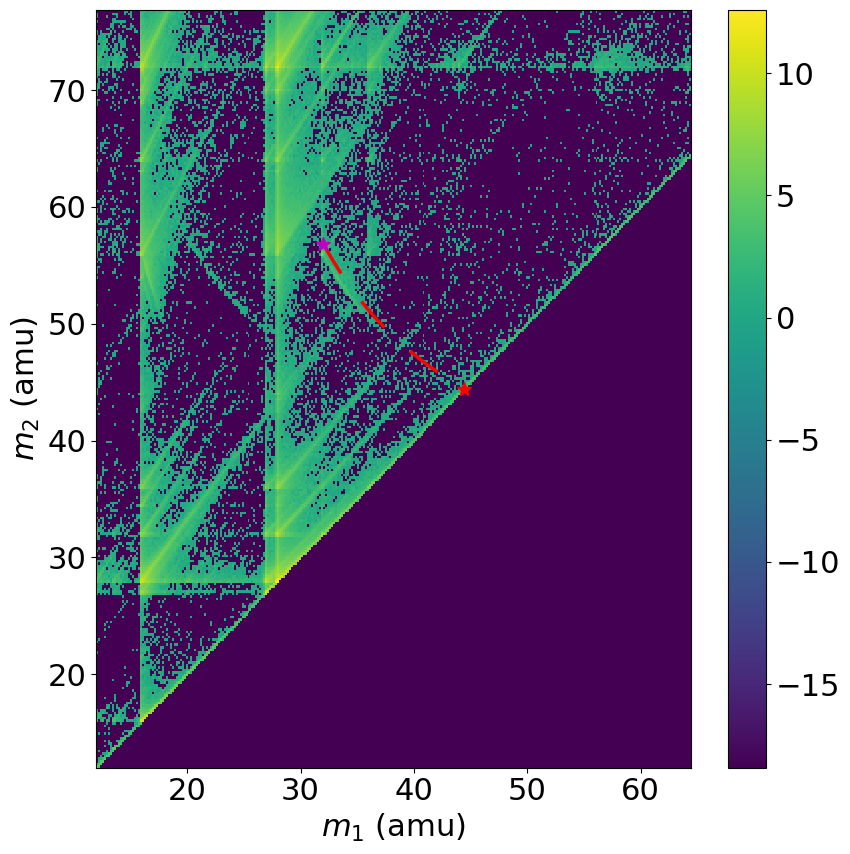

33 FeO2H + 2 -> FeOH + 1  +  O + 1 := -1.2397948398114083


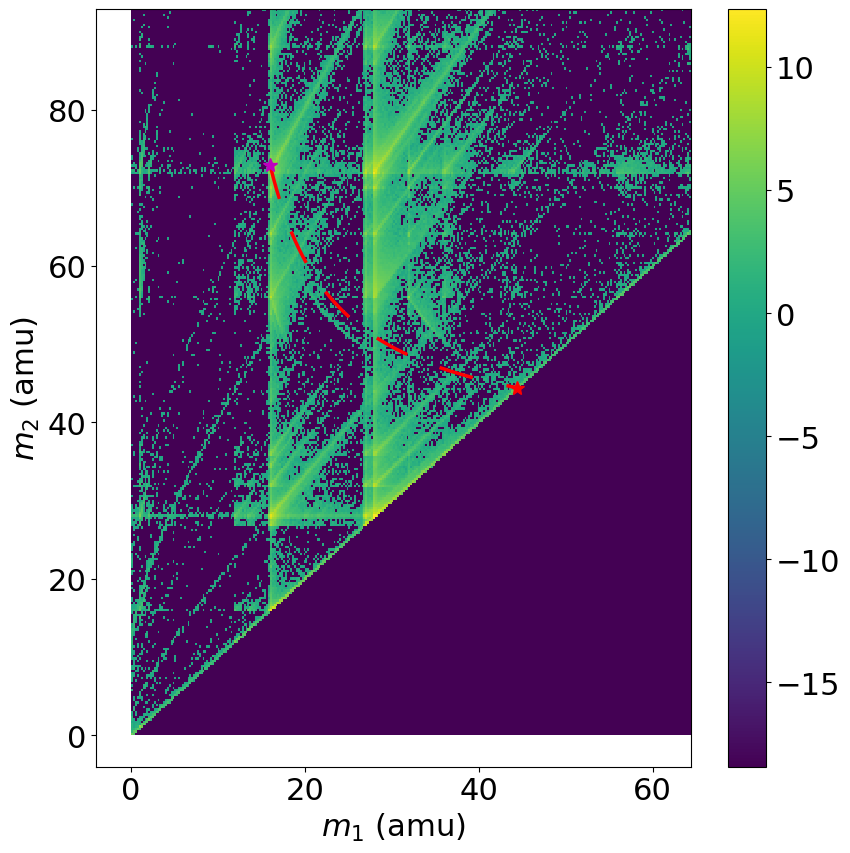

34 FeO2H + 2 -> O2H + 1  +  Fe + 1 := -3.2808224169075983


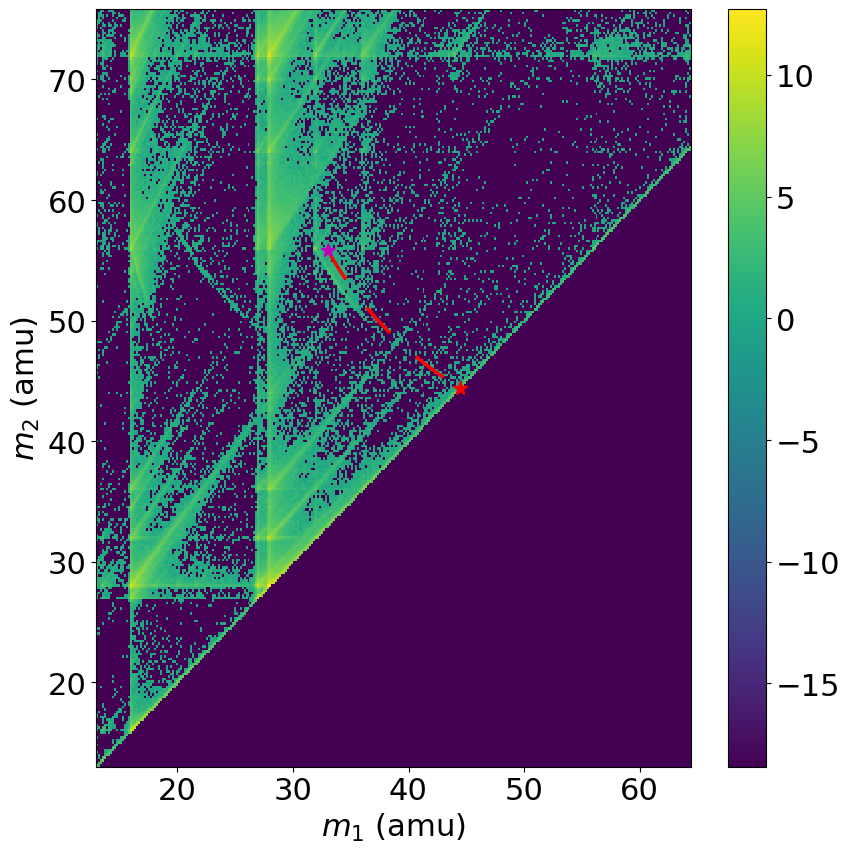

35 Fe2O4 + 2 -> FeO2 + 1  +  FeO2 + 1 := -1.9577231834714595


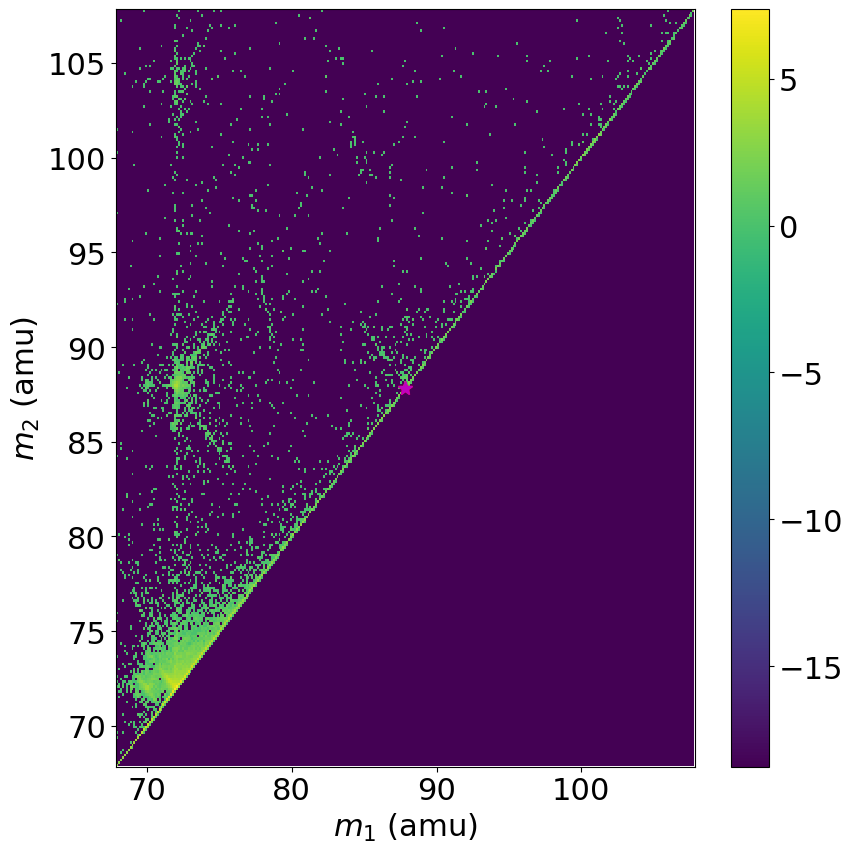

36 Fe2O4 + 2 -> O3 + 1  +  Fe2O + 1 := -0.25035835915984844


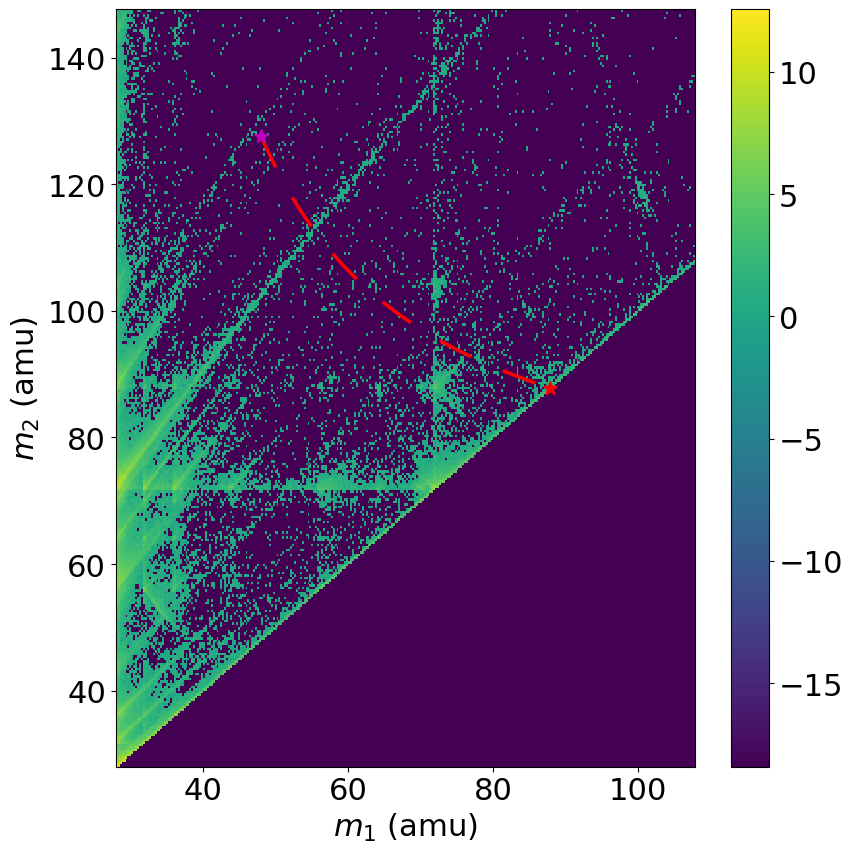

37 Fe2O4 + 2 -> Fe2O2 + 1  +  O2 + 1 := -0.8805060361458035


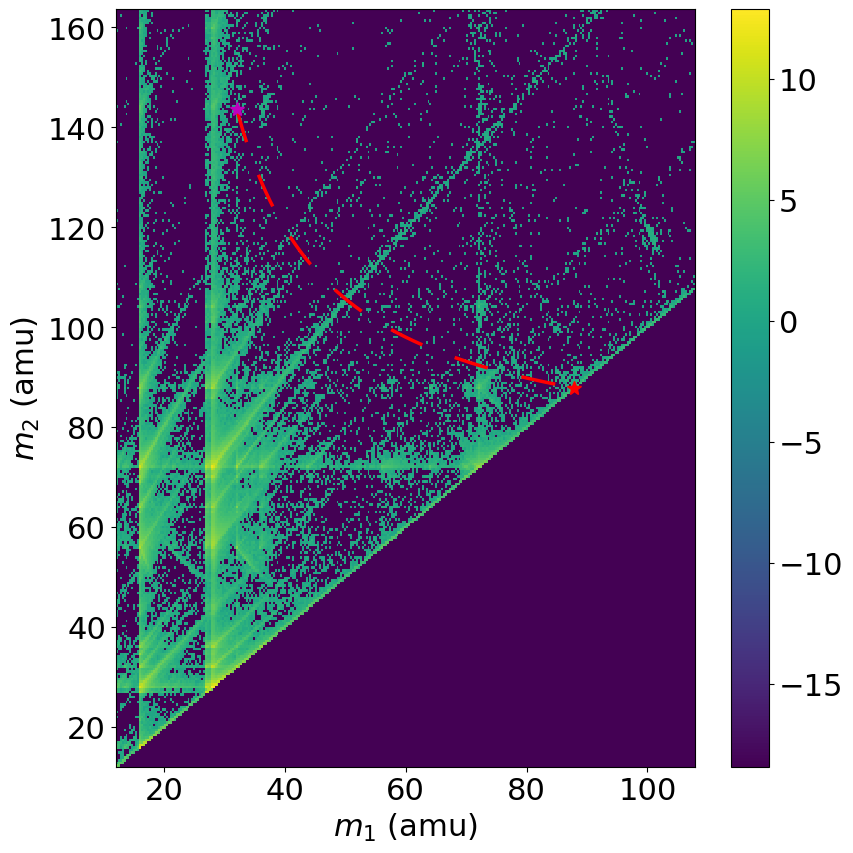

38 Fe2O4 + 2 -> Fe2O2 + 2  +  O2 + 0 := -0.48558718756800306


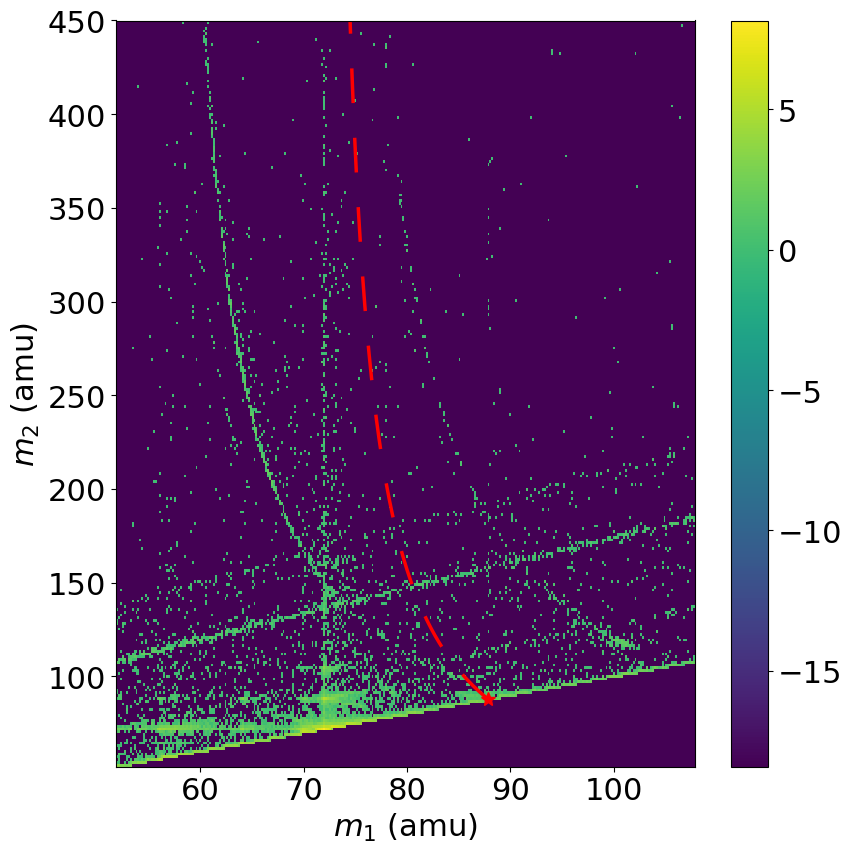

39 Fe2O4 + 2 -> FeO + 1  +  FeO3 + 1 := -1.8259656512731222


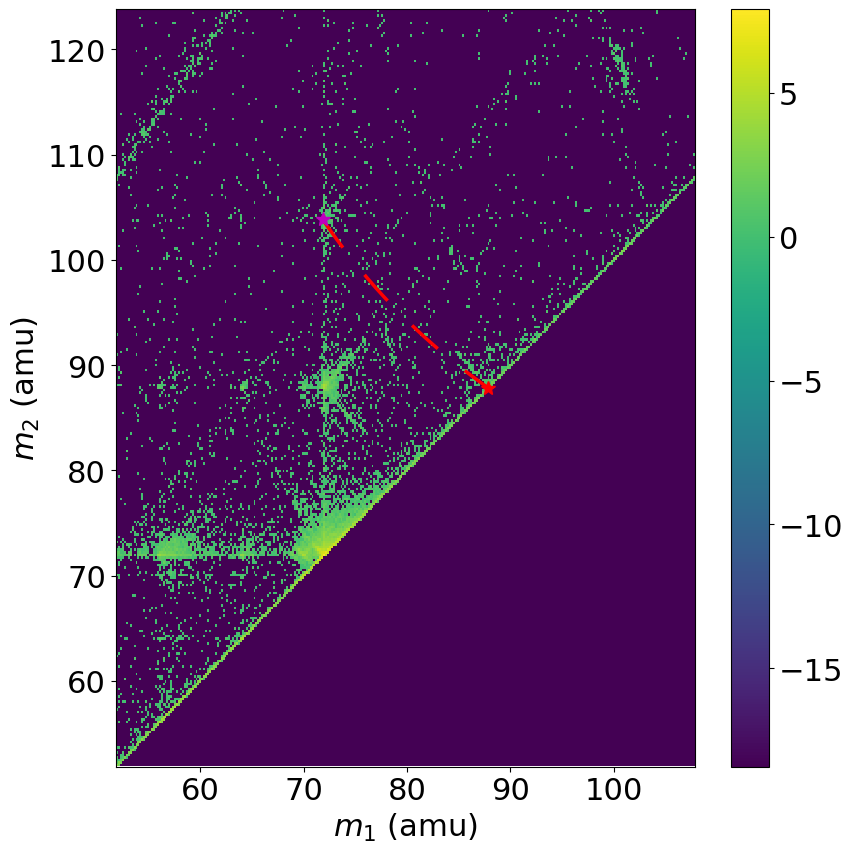

40 FeO2H2 + 2 -> FeOH + 1  +  OH + 1 := -1.0172432520300518


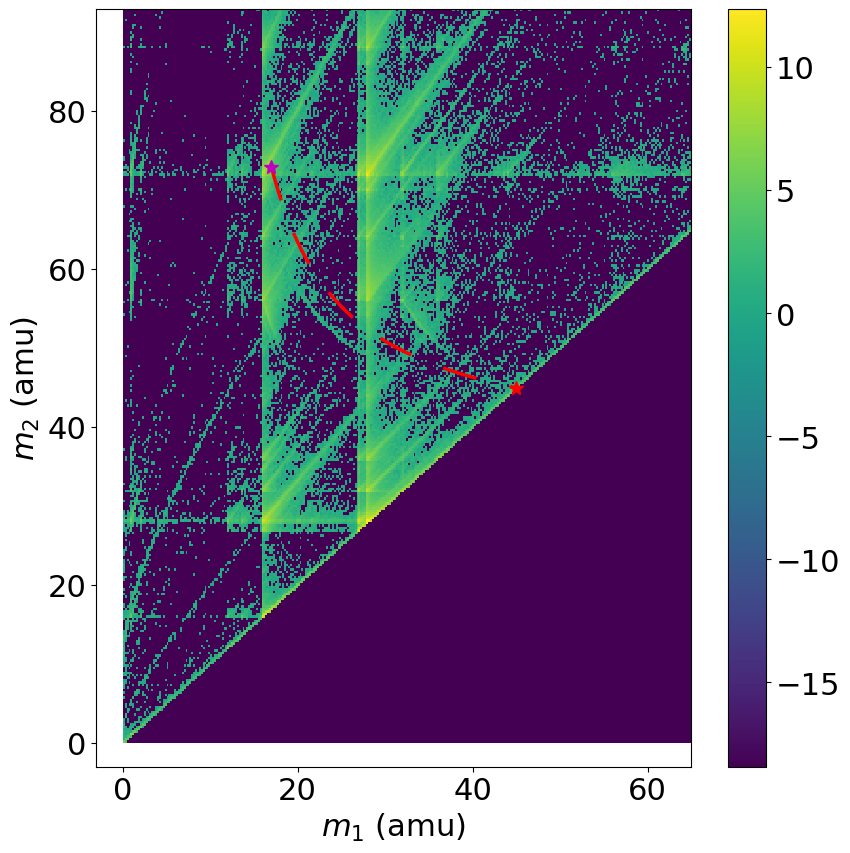

41 FeO2H2 + 2 -> OH2 + 1  +  FeO + 1 := -1.5096953281151113


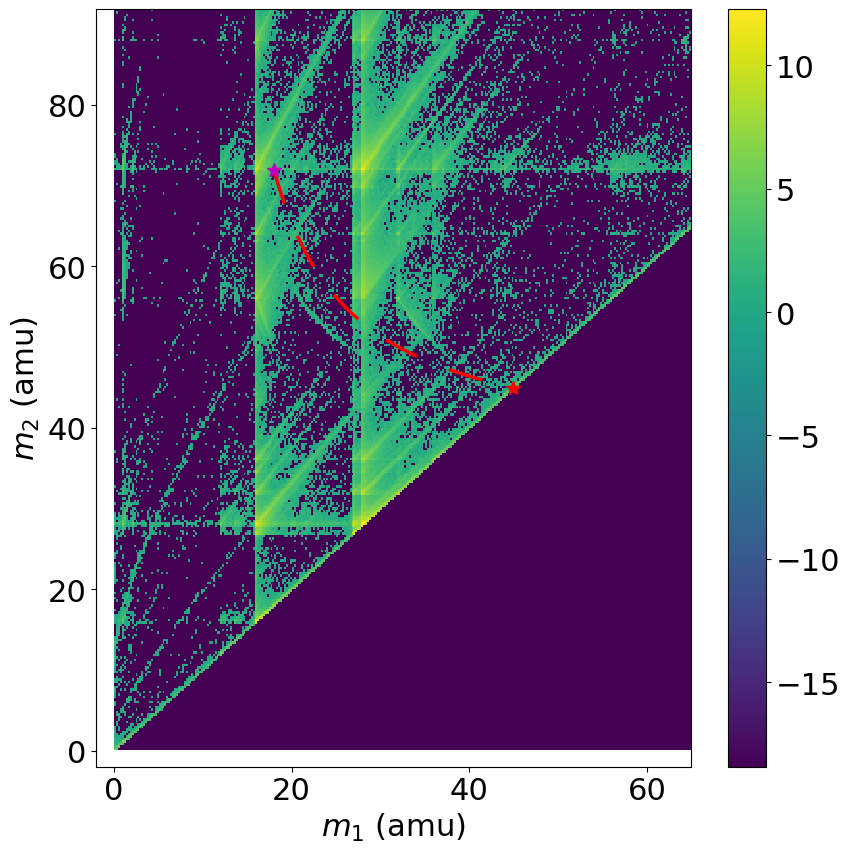

42 FeO2H2 + 2 -> O + 0  +  FeOH2 + 2 := -15.781569989996322


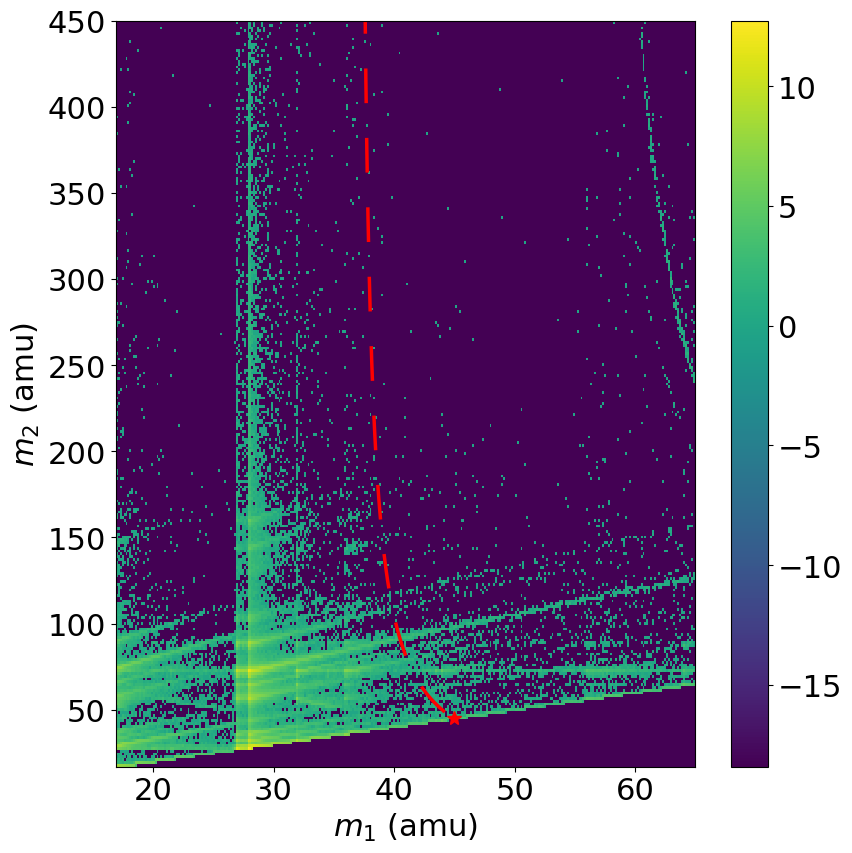

43 FeO2H2 + 2 -> O2H2 + 1  +  Fe + 1 := -2.0241733886834448


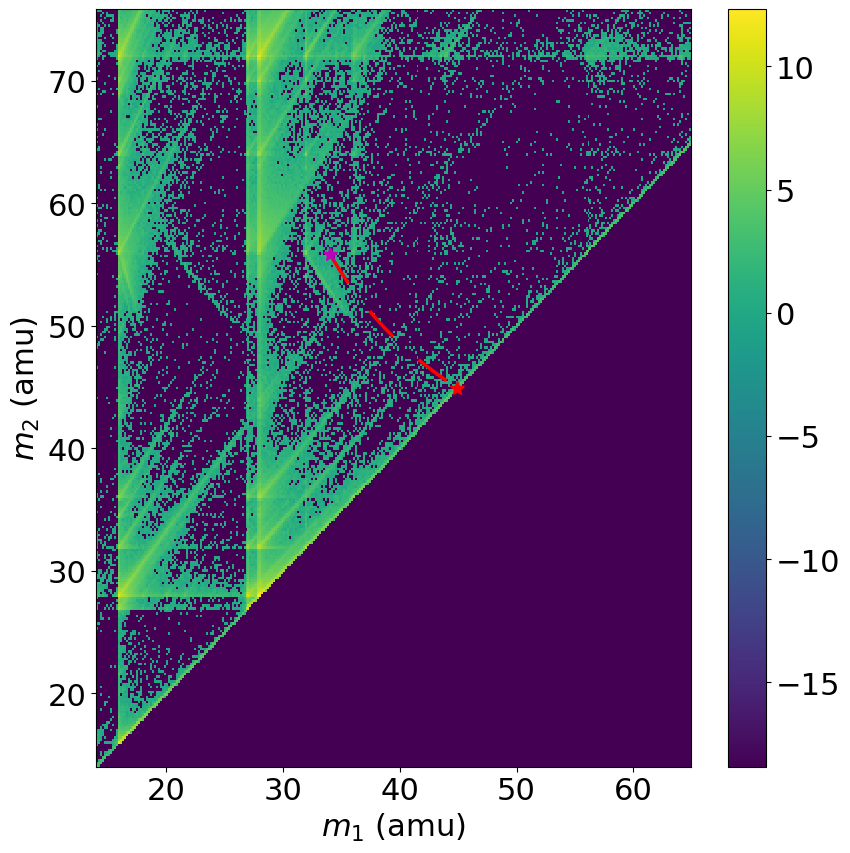

44 H2O3 + 2 -> H2O + 1  +  O2 + 1 := -6.493038942581616


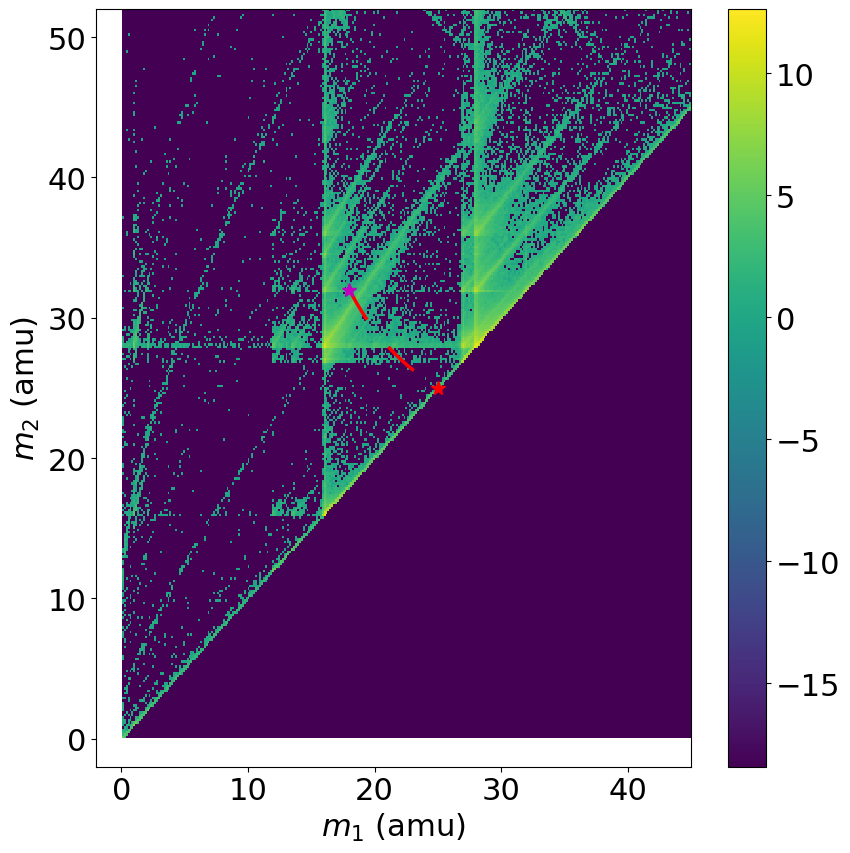

45 H2O3 + 2 -> HO + 1  +  HO2 + 1 := -4.091572064412369


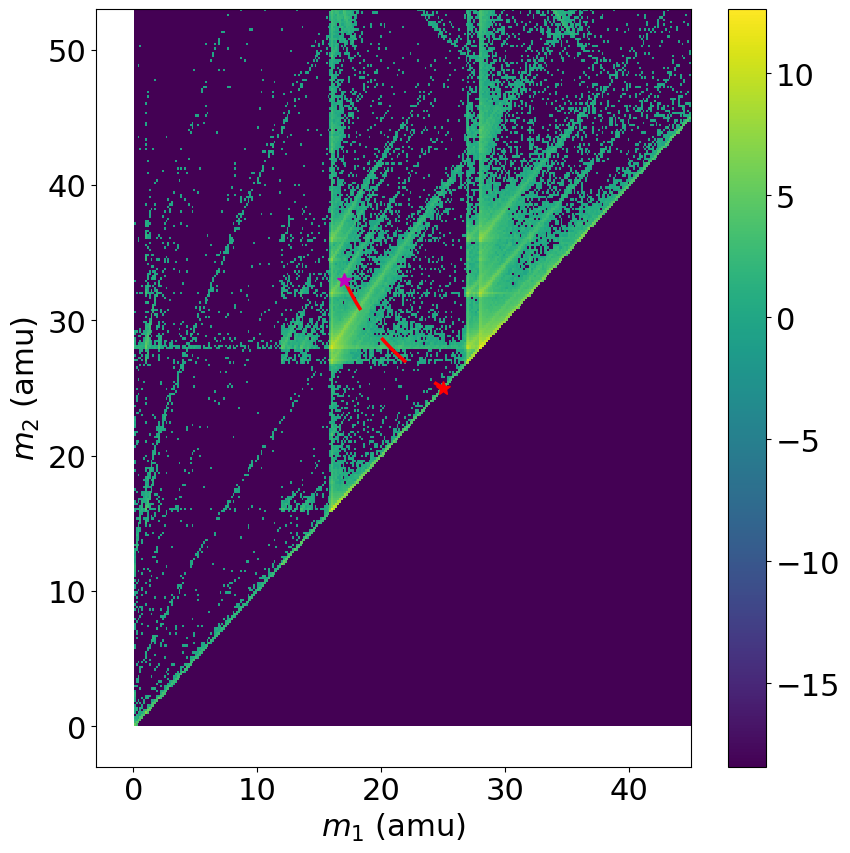

46 H2O3 + 2 -> H2O2 + 1  +  O + 1 := -3.057474623965705


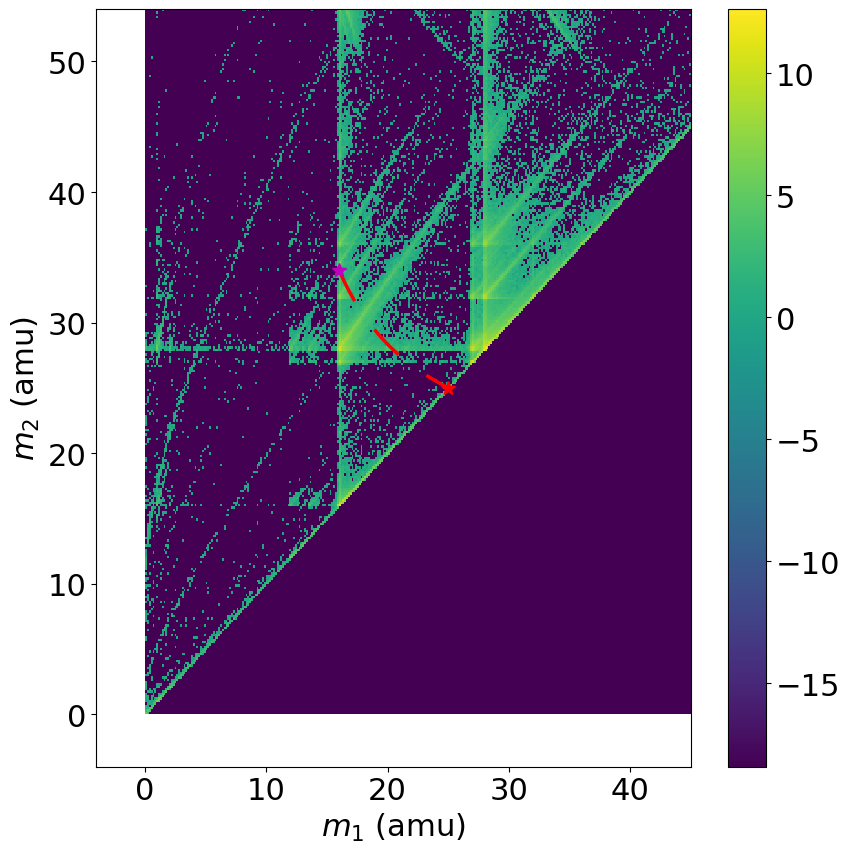

47 H2O3 + 2 -> H + 0  +  HO3 + 2 := -0.10549269402811463


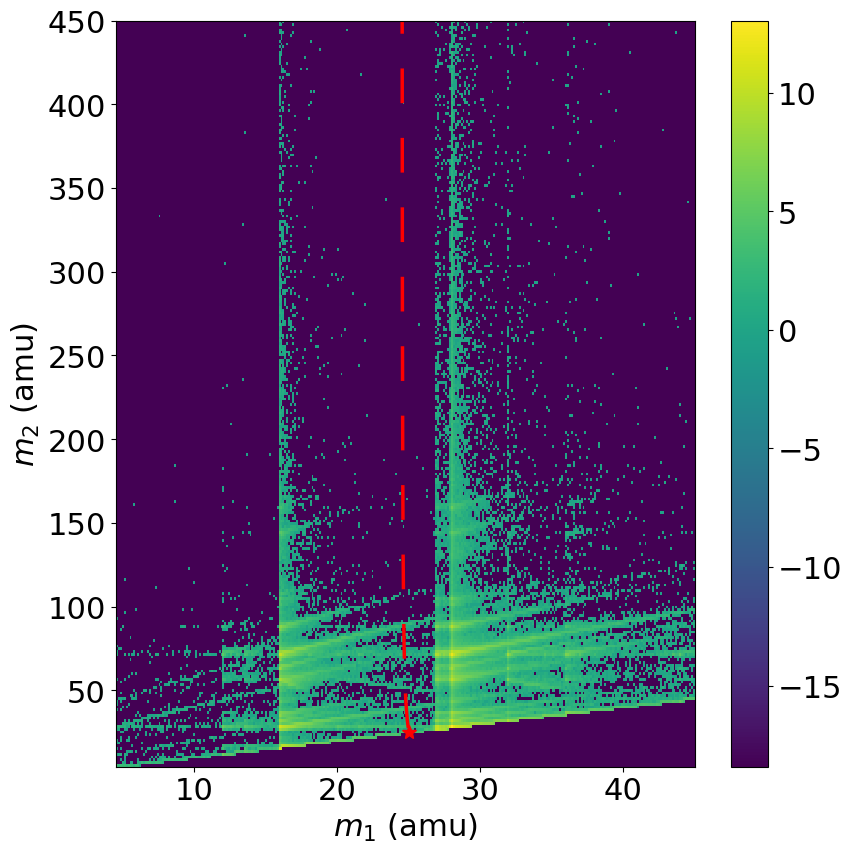

48 FeH2 + 1 -> H2 + 0  +  Fe + 1 := -1.8754337201323474


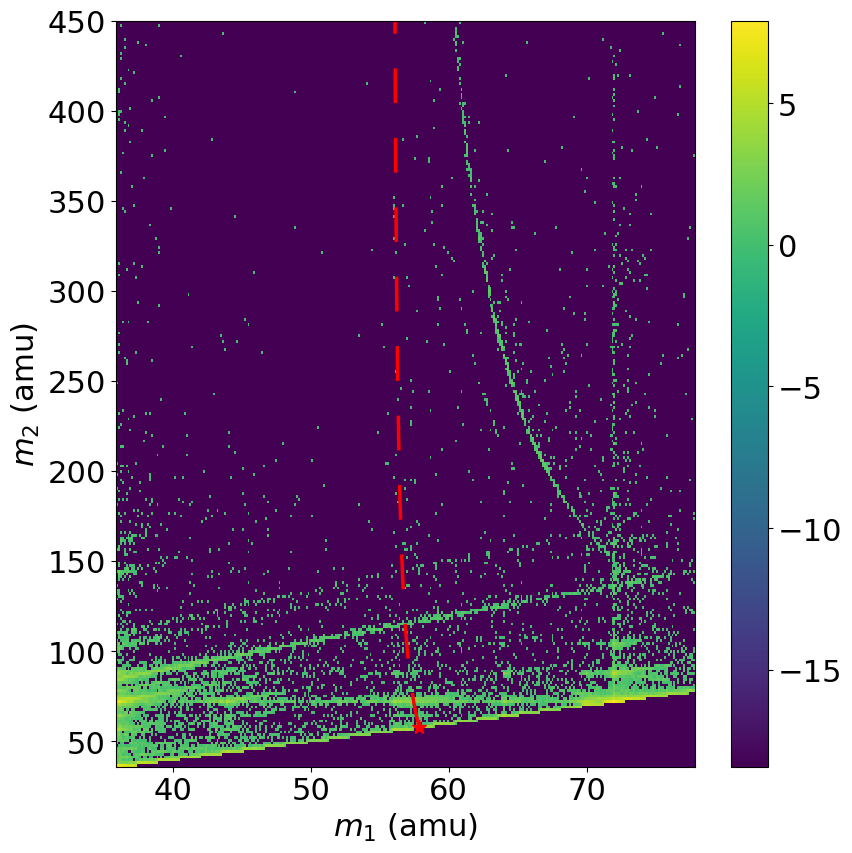

49 FeH2 + 2 -> H2 + 0  +  Fe + 2 := -2.6403457875000576


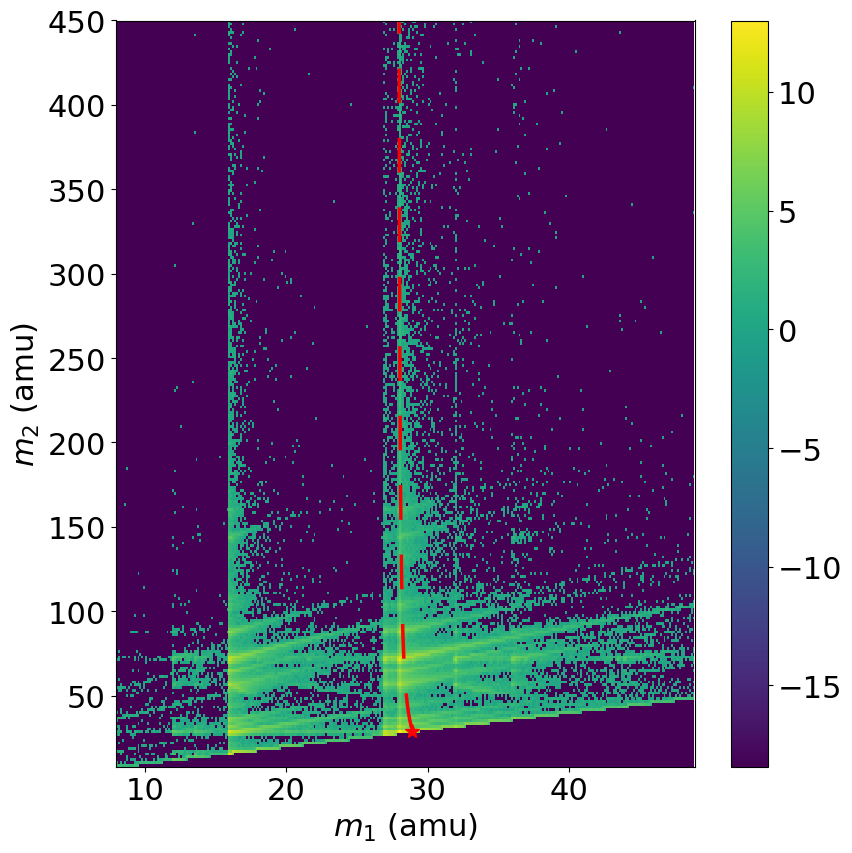

50 FeH2 + 2 -> H2 + 1  +  Fe + 1 := -3.7865073084886216


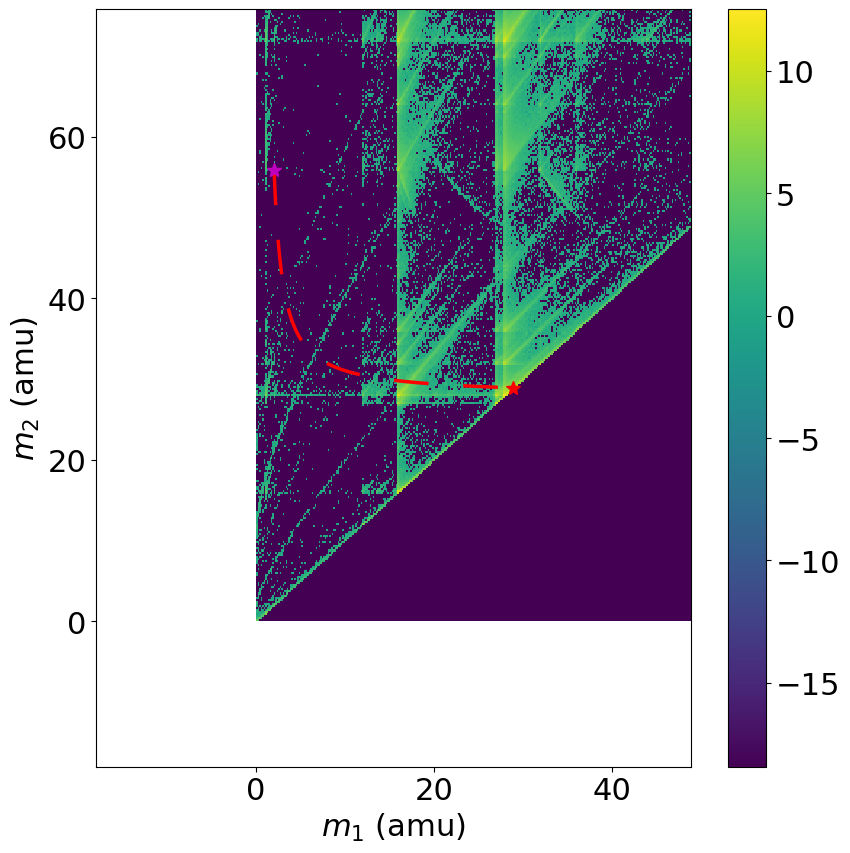

51 HO3 + 2 -> HO + 1  +  O2 + 1 := -0.5541054581263684


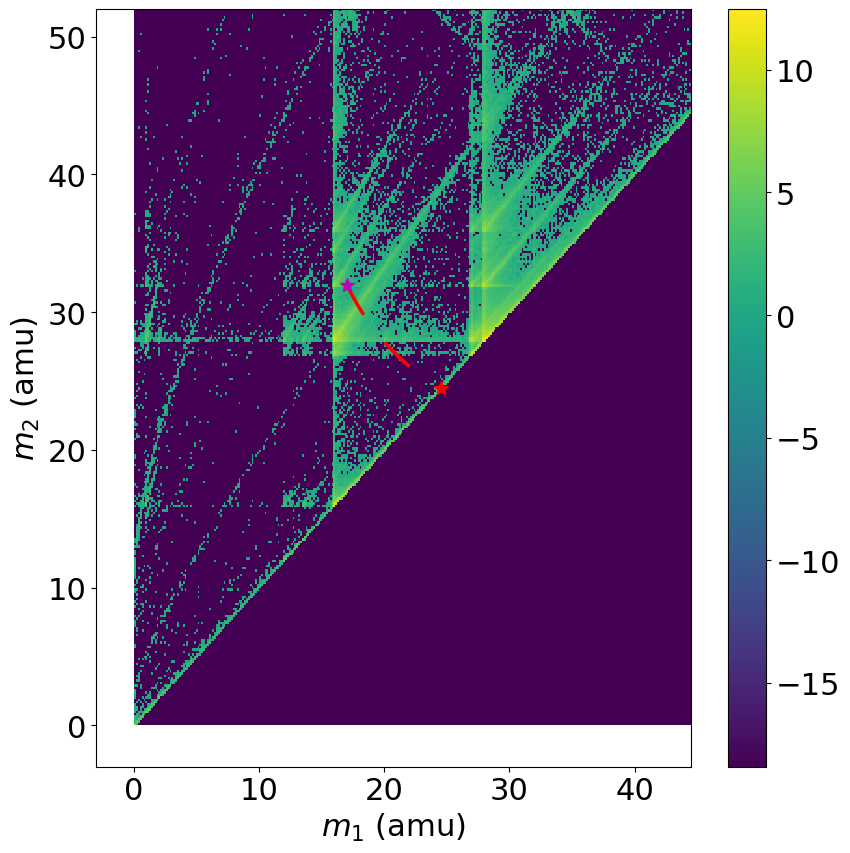

52 H2O2 + 2 -> HO + 1  +  HO + 1 := -4.277357804006465


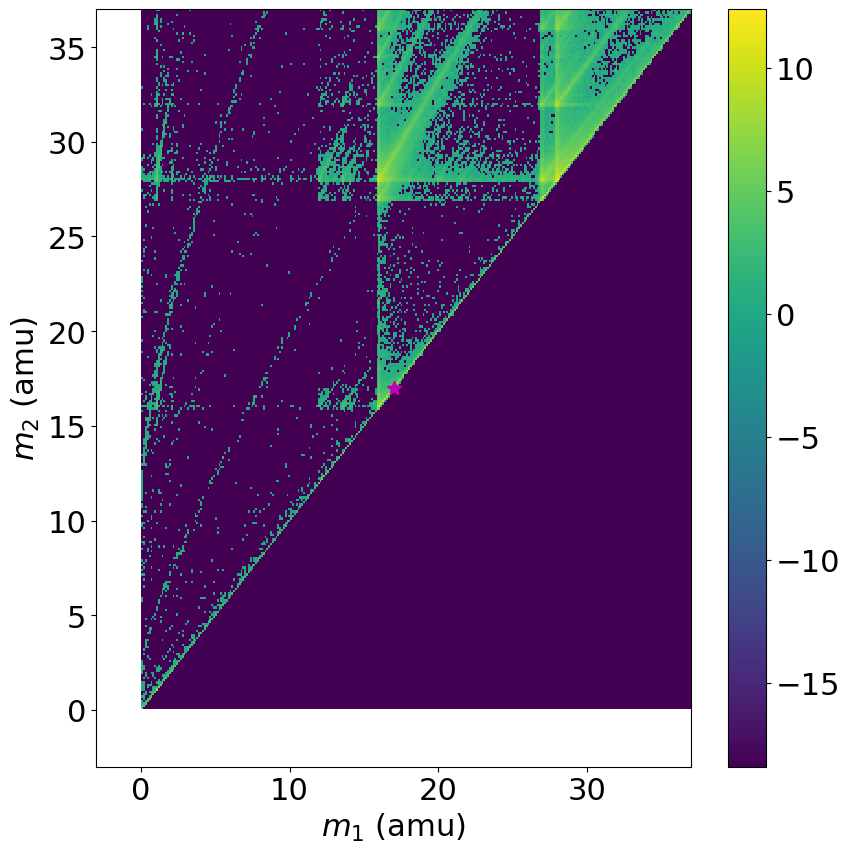

53 H2O2 + 2 -> O2 + 1  +  H2 + 1 := -3.4890324340437


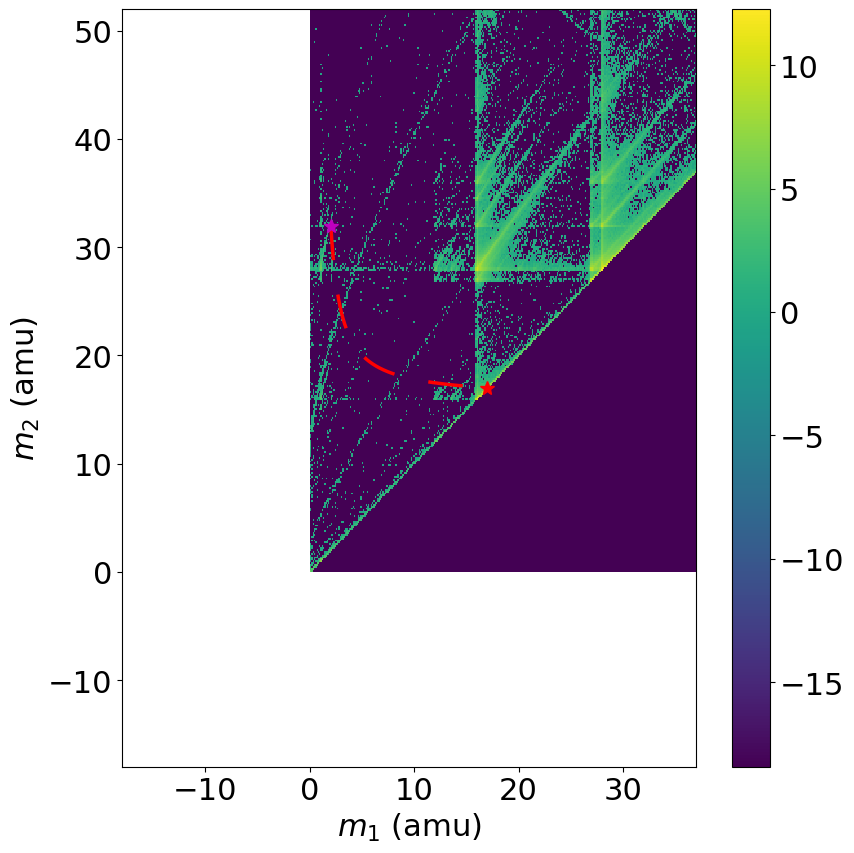

54 H2O2 + 2 -> H2O + 1  +  O + 1 := -4.586394796463792


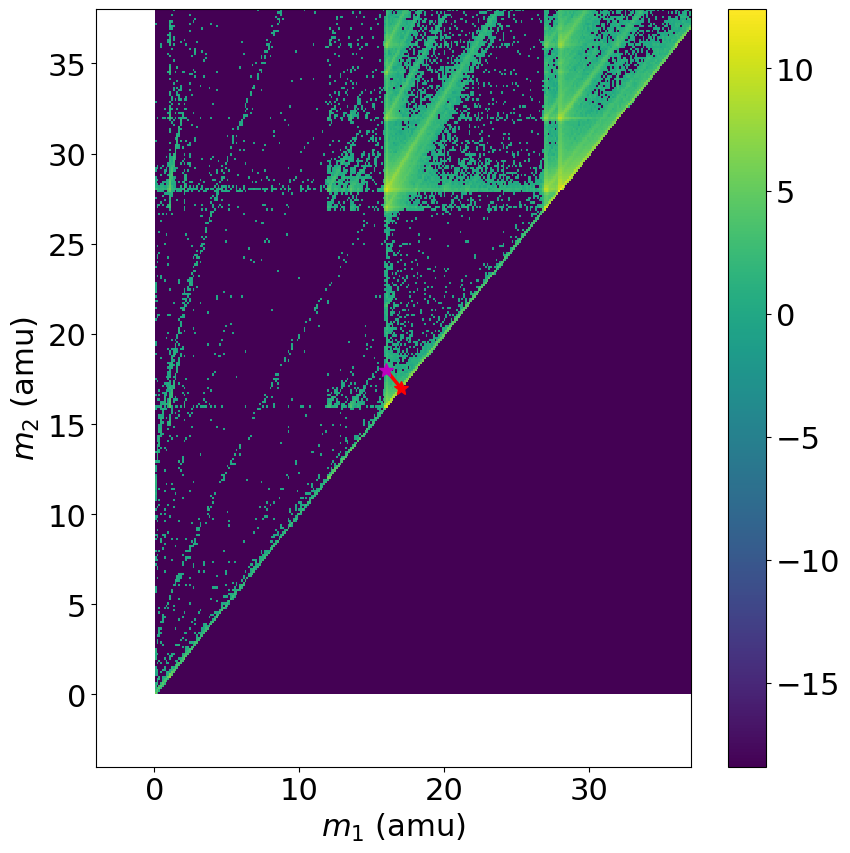

55 O3 + 2 -> O2 + 1  +  O + 1 := -8.259053556123925


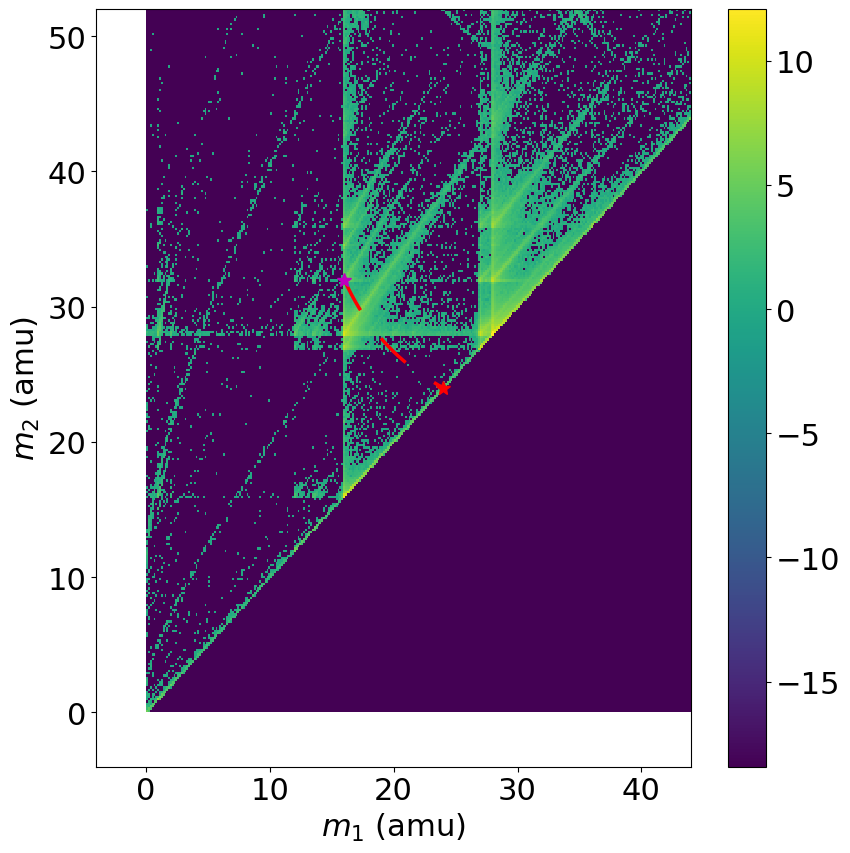

56 FeO3H2 + 2 -> OH2 + 1  +  FeO2 + 1 := -2.595130314084869


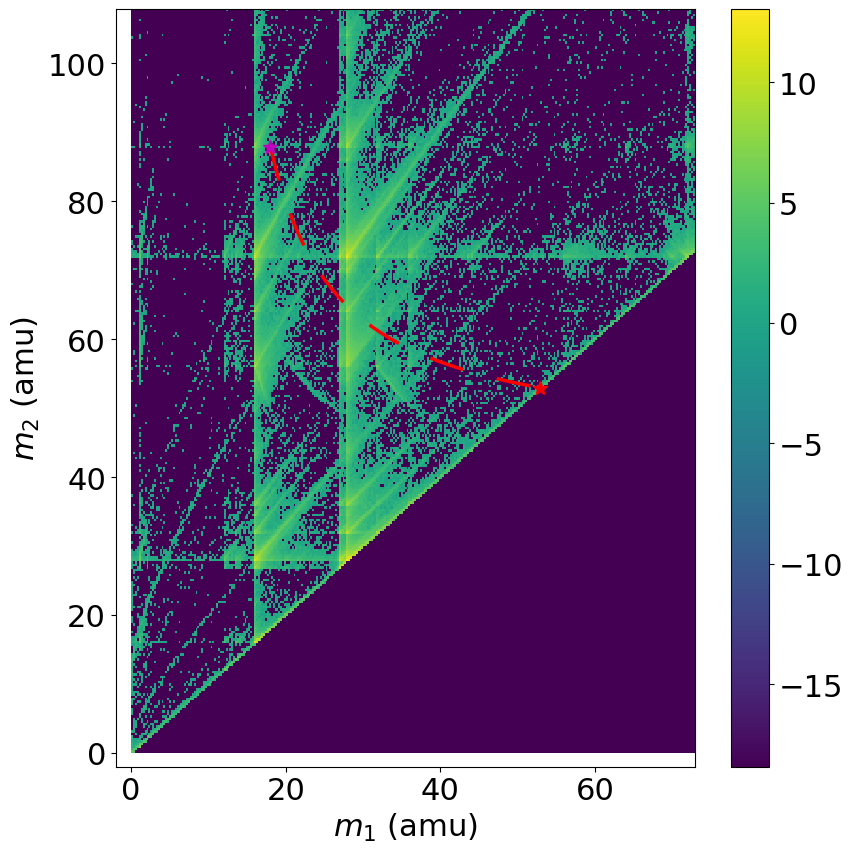

57 FeO3H2 + 2 -> O2H + 1  +  FeOH + 1 := -4.738318687016739


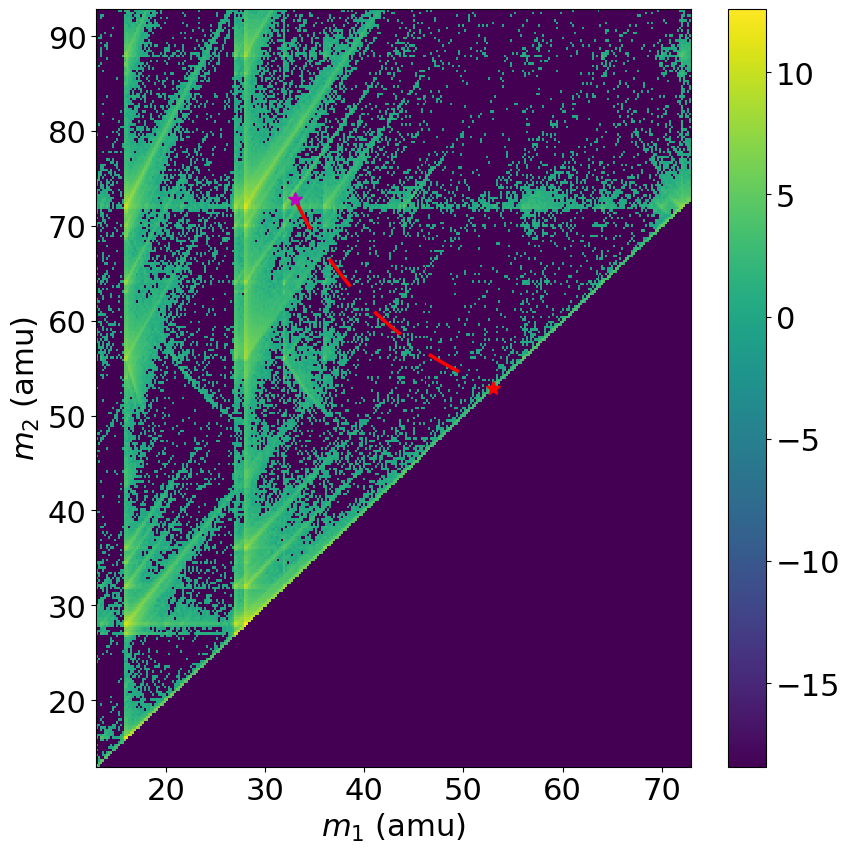

58 FeO3H2 + 2 -> O2 + 0  +  FeOH2 + 2 := -20.019661763650742


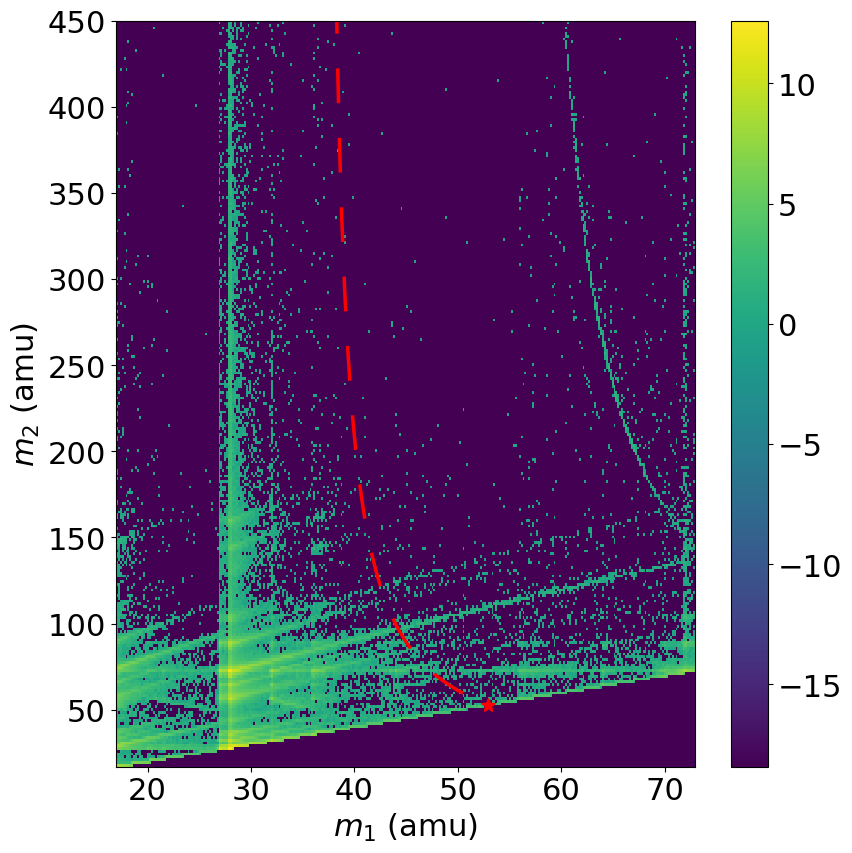

59 FeO3H2 + 2 -> O2 + 1  +  FeOH2 + 1 := -4.583894070067758


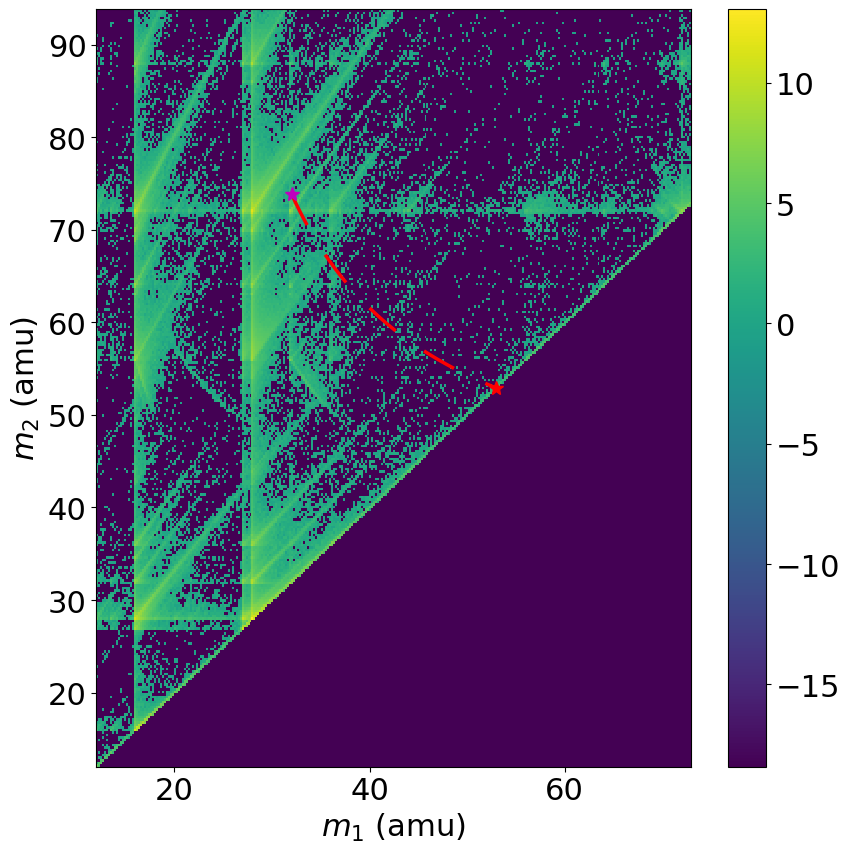

60 FeO3H2 + 2 -> FeO2H + 1  +  OH + 1 := -1.9008241748293566


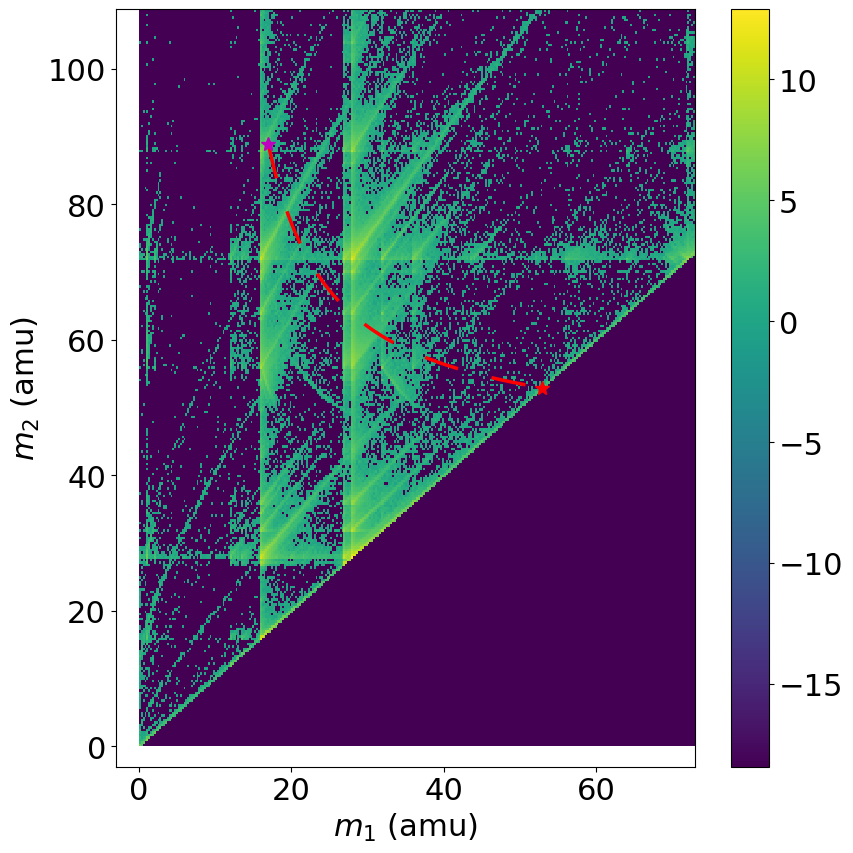

61 FeO3H2 + 2 -> FeO + 1  +  O2H2 + 1 := -3.887636330195487


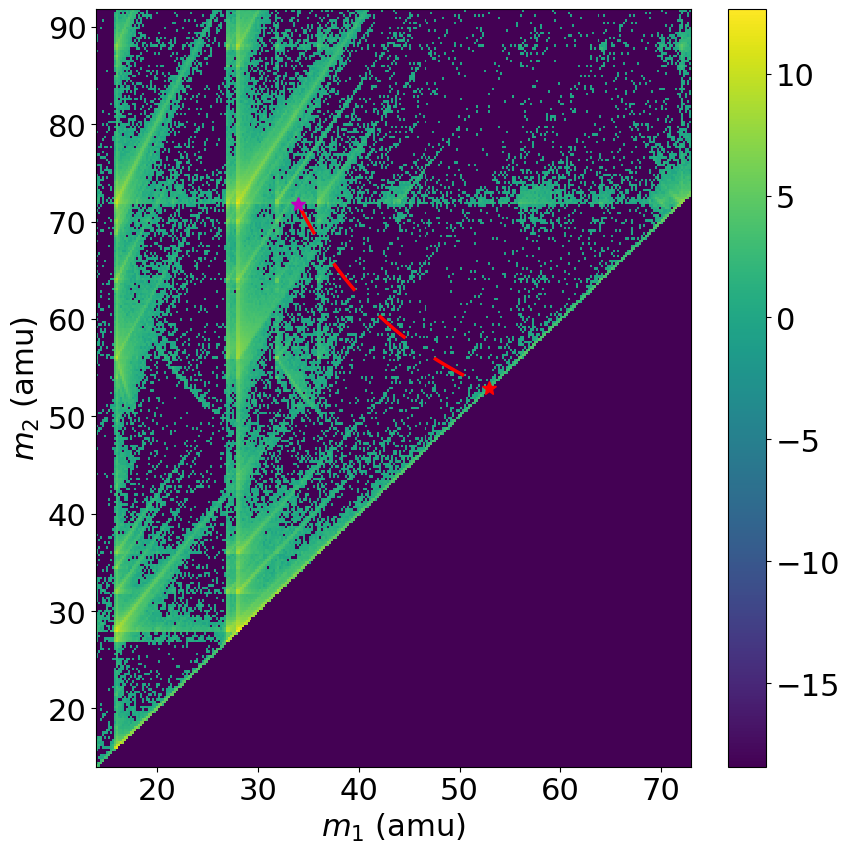

62 FeO3H2 + 2 -> FeH + 1  +  O3H + 1 := -0.9069555035781841


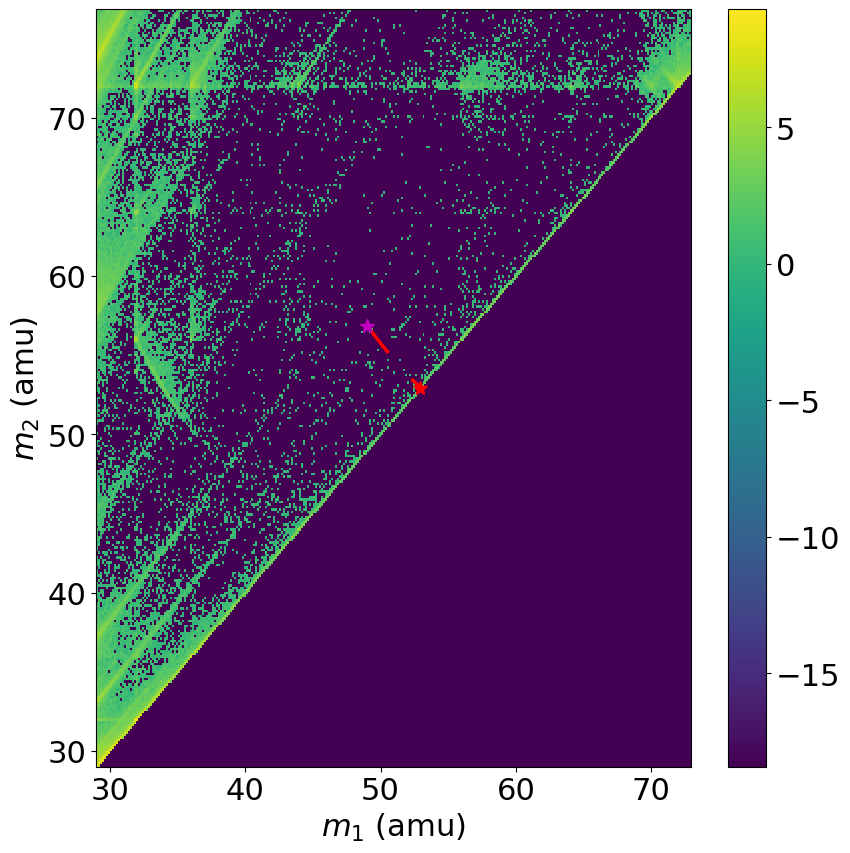

63 FeO3H2 + 2 -> FeO2H2 + 1  +  O + 1 := -1.982965009577063


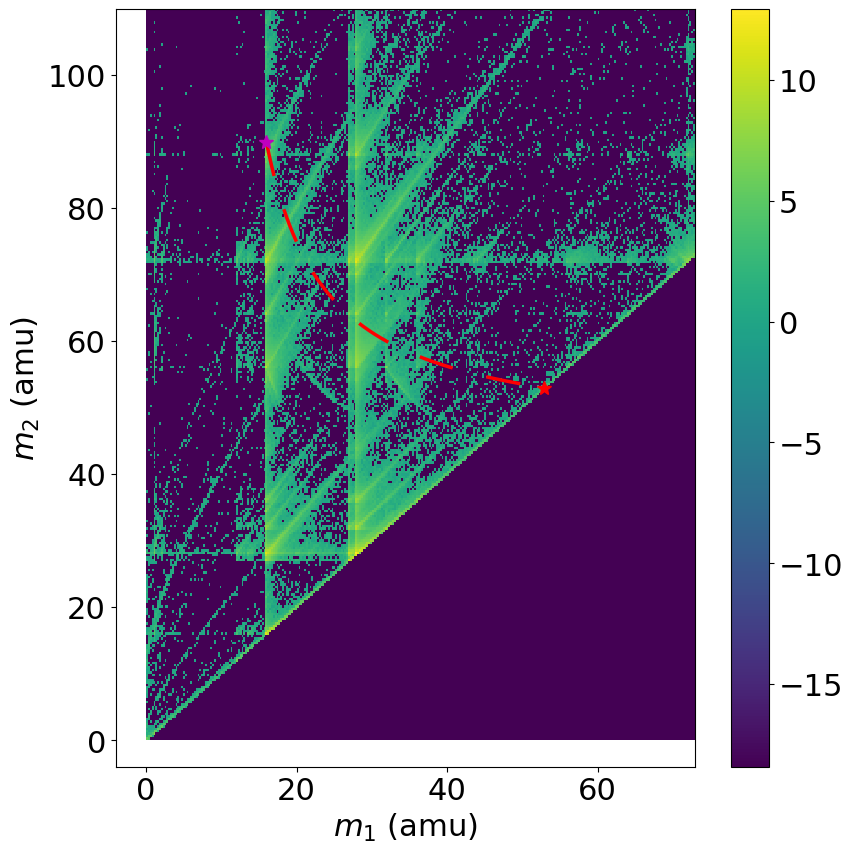

64 FeO3H2 + 2 -> Fe + 1  +  O3H2 + 1 := -3.568016829628137


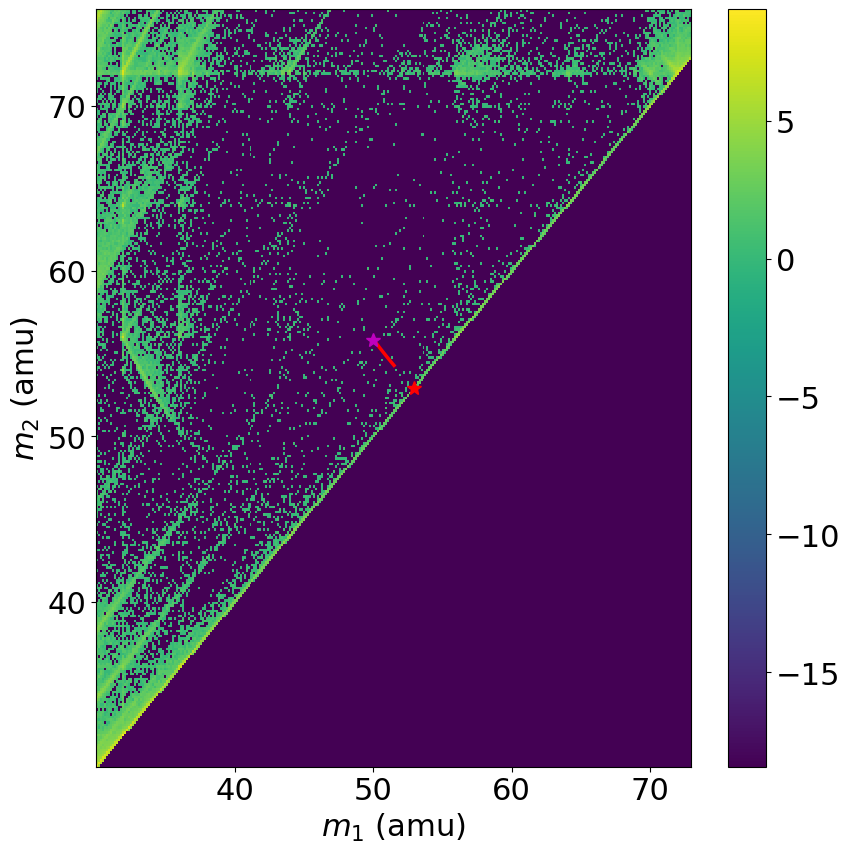

In [36]:
m1, m2,new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)
hits_along_track_pairs = {}
bins_along_track = {}
for index,row in neg_pairs.iterrows():
    mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)
    plt.figure(figsize=(9, 9))
    plt.rcParams.update({'font.size': 22})   
    if md1>md2:
        if md1>1e4:
            m1d,m2d = corr.diss_track(md1,md2,mp,interp_points=500)
            ind = np.where((m1>md2-20)&(m1 < mp+20) & (m2>md2-20)&(m2 < 500))
            h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=300)
            bins_along_track[index] = np.unique(np.array([np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2]).T,axis=0)
            hits_along_track_pairs[index] = h[bins_along_track[index][:,0],bins_along_track[index][:,1]][::-1] 
            #hits_along_track_pairs[index] = h[np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2][::-1] 
            X, Y = np.meshgrid(m1e, m2e)        
            plt.xlim([md2-20, mp+20])
            plt.ylim([md2-20, 450])
        else:
            m1d,m2d = corr.diss_track(md1,md2,mp,interp_points=500)
            ind = np.where((m1>md2-20)&(m1 < mp+20) & (m2>md2-20)&(m2 < md1+20))
            h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=300)
            bins_along_track[index] = np.unique(np.array([np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2]).T,axis=0)
            hits_along_track_pairs[index] = h[bins_along_track[index][:,0],bins_along_track[index][:,1]][::-1] 
            #hits_along_track_pairs[index] = h[np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2][::-1] 
            X, Y = np.meshgrid(m1e, m2e)        
            plt.xlim([md2-20, mp+20])
            plt.ylim([md2-20, md1+20])

    else:
        if md2>1e4:
            m1d,m2d = corr.diss_track(md2,md1,mp,interp_points=500)
            ind = np.where((m1>md1-20)&(m1 < mp+20) & (m2>md1-20)&(m2 < 500))
            h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=300)
            X, Y = np.meshgrid(m1e, m2e)
            bins_along_track[index] = np.unique(np.array([np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2]).T,axis=0)
            hits_along_track_pairs[index] = h[bins_along_track[index][:,0],bins_along_track[index][:,1]][::-1] 
            #hits_along_track_pairs[index] = h[np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2][::-1] 
            plt.xlim([md1-20, mp+20])
            plt.ylim([md1-20, 450])
        else:
            m1d,m2d = corr.diss_track(md2,md1,mp,interp_points=500)
            ind = np.where((m1>md1-20)&(m1 < mp+20) & (m2>md1-20)&(m2 < md2+20))
            h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=300)
            X, Y = np.meshgrid(m1e, m2e)
            bins_along_track[index] = np.unique(np.array([np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2]).T,axis=0)
            hits_along_track_pairs[index] = h[bins_along_track[index][:,0],bins_along_track[index][:,1]][::-1] 
            #hits_along_track_pairs[index] = h[np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2][::-1] 
            plt.xlim([md1-20, mp+20])
            plt.ylim([md1-20, md2+20])
            
        
    plt.pcolormesh(X, Y, np.log(h + 1e-8))
    plt.plot(m2d, m1d, 'r',lw=2.5,ls='dashed',dashes=(10,10))
    plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
    plt.plot(m2d[0], m1d[0], 'm*',ms=10)
    plt.xlabel('$m_1$ (amu)')
    plt.ylabel('$m_2$ (amu)')
    plt.colorbar()
    plt.tight_layout()
    print(index, row['parent'],'+',row['cp'],'->',row['daughter_1'],'+',row['cd1'],' + ',row['daughter_2'],'+',row['cd2'],':=',row['del_E'])
    plt.show()


## Common reactions between DFT and experiment

In [37]:
FeO_common_reaction_indices = [2,3,4,7,27,29,39]

In [38]:
common_reactions = neg_pairs.iloc[FeO_common_reaction_indices]
common_reactions = common_reactions.reset_index(drop=True)
common_reactions

,parent,cp,daughter_1,cd1,daughter_2,cd2,del_E
0,FeO2,1,Fe,1,O2,0,-0.191133
1,FeO2,2,O,1,FeO,1,-0.968062
2,FeO2,2,Fe,1,O2,1,-4.918104
3,FeO3,1,FeO,1,O2,0,-1.100918
4,FeO,2,Fe,1,O,1,-0.679975
5,Fe2O3,2,FeO,1,FeO2,1,-1.213274
6,Fe2O4,2,FeO,1,FeO3,1,-1.825966


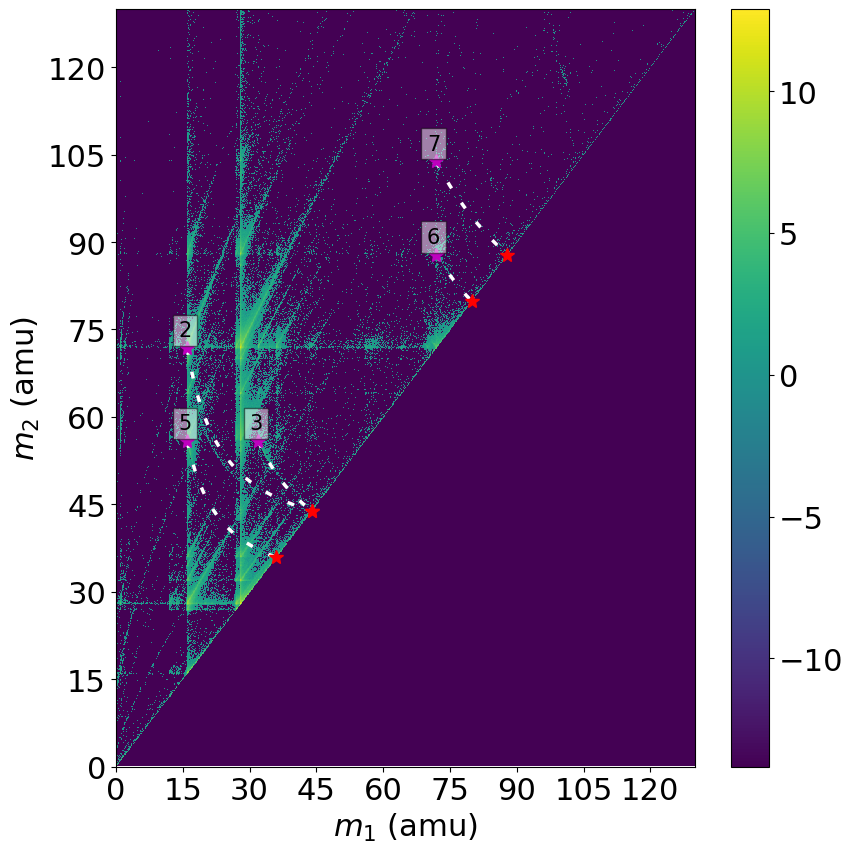

In [176]:
m1, m2,new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)
plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})
plt.rcParams['text.usetex'] = False
ind = np.where((m1>=0)&(m1 < 130) & (m2>=0)&(m2 < 130))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=900)
X, Y = np.meshgrid(m1e, m2e)  
plt.pcolormesh(X, Y, np.log(h + 1e-6))
for index,row in common_reactions.loc[common_reactions.cp>1].iterrows():

    
    mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)

    if md1>md2:
            m1d,m2d = corr.diss_track(md1,md2,mp,interp_points=500)
      

    else:
            m1d,m2d = corr.diss_track(md2,md1,mp,interp_points=500)


    plt.plot(m2d, m1d, 'w',lw=2.5,ls='dashed',dashes=(2,5))
    plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
    plt.plot(m2d[0], m1d[0], 'm*',ms=10)
    plt.text(m2d[0]-2, m1d[0]+2,index+1,fontdict=dict(fontsize=15),bbox=dict(facecolor='w', alpha=0.5))
    string = fr"{index} ${row['parent']}^{+row['cp']} \rightarrow {row['daughter_1']}^{+row['cd1']} + {row['daughter_2']}^{+row['cd2']}: \DeltaE={np.round(row['del_E'],2)}eV$"
    #print(string)
    #plt.text(m2d[-1], m1d[-1],string)
    #print(index, row['parent'],'+',row['cp'],'->',row['daughter_1'],'+',row['cd1'],'',row['daughter_2'],'+',row['cd2'],':=',row['del_E'])
    #plt.savefig(f'reaction_{index}_FeO.jpg',dpi=300)
#plt.legend()
plt.xticks(np.arange(0,130,15))
plt.yticks(np.arange(0,130,15))

plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.tight_layout()  
plt.savefig('all_charged_reactions_FeO.jpg',dpi=300)
plt.show()

2 $FeO2^1 \rightarrow Fe^1 + O2^0: \DeltaE=-0.19eV$


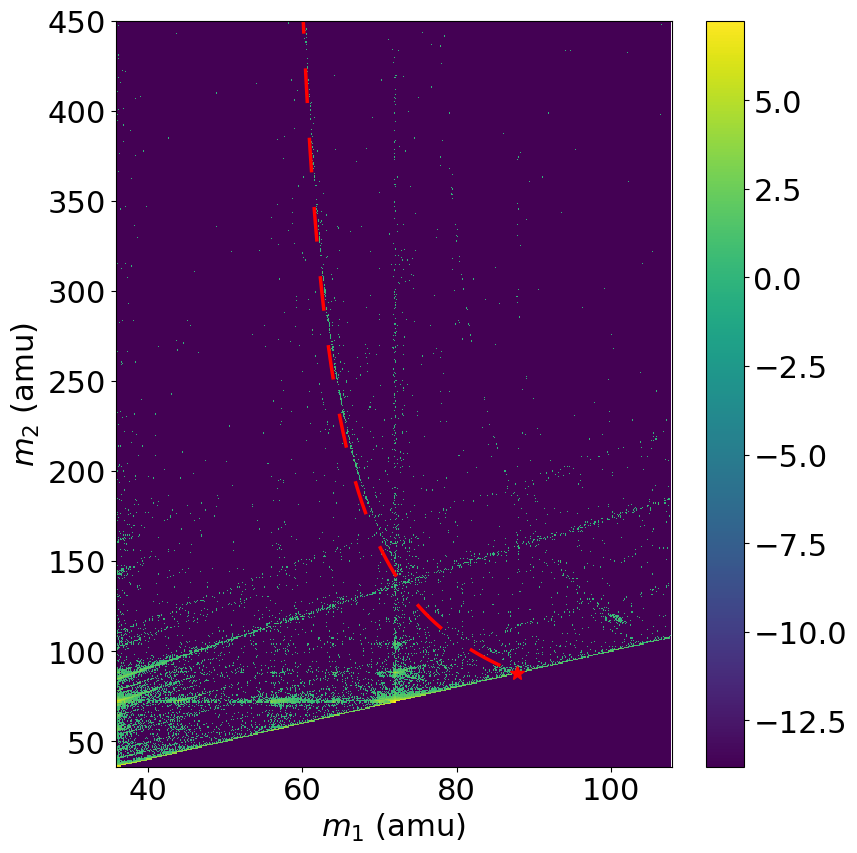

3 $FeO2^2 \rightarrow O^1 + FeO^1: \DeltaE=-0.97eV$


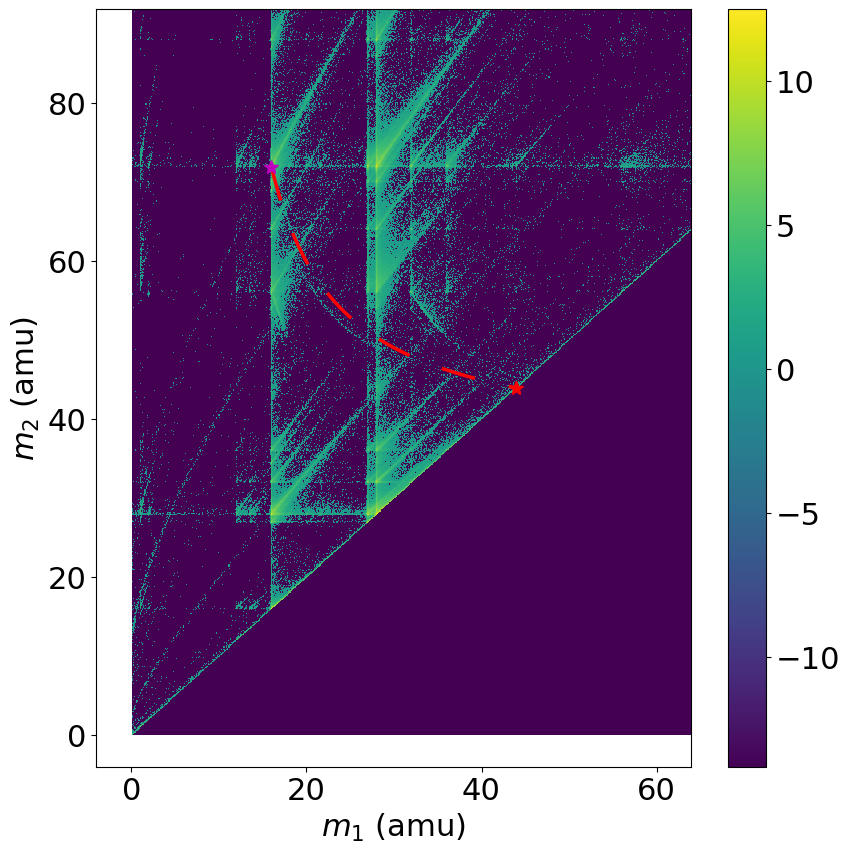

4 $FeO2^2 \rightarrow Fe^1 + O2^1: \DeltaE=-4.92eV$


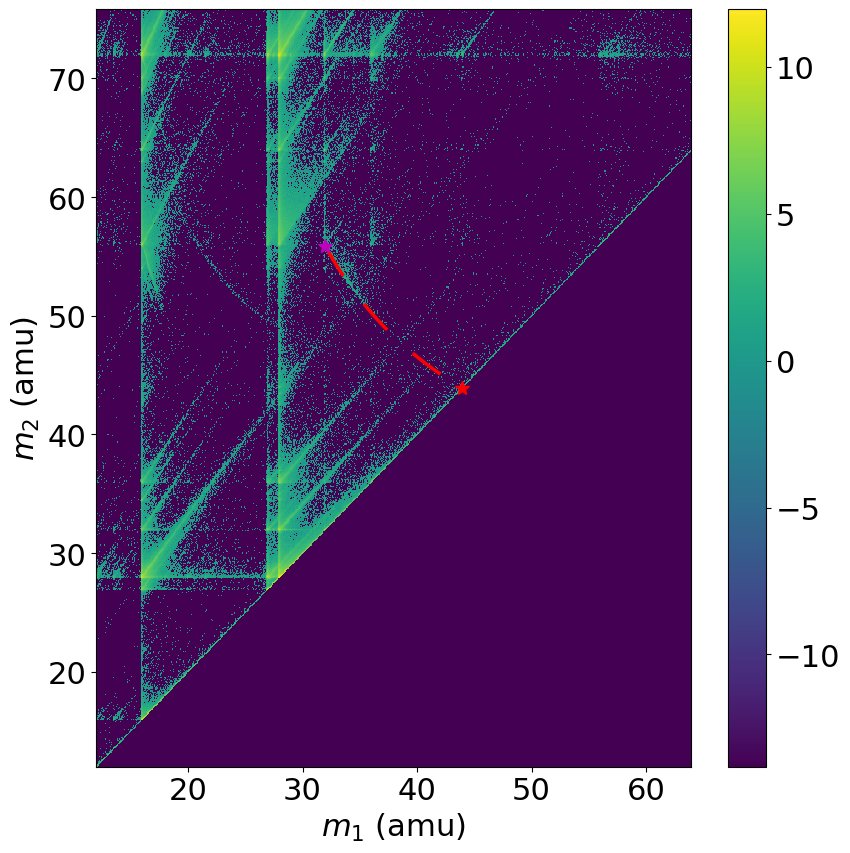

7 $FeO3^1 \rightarrow FeO^1 + O2^0: \DeltaE=-1.1eV$


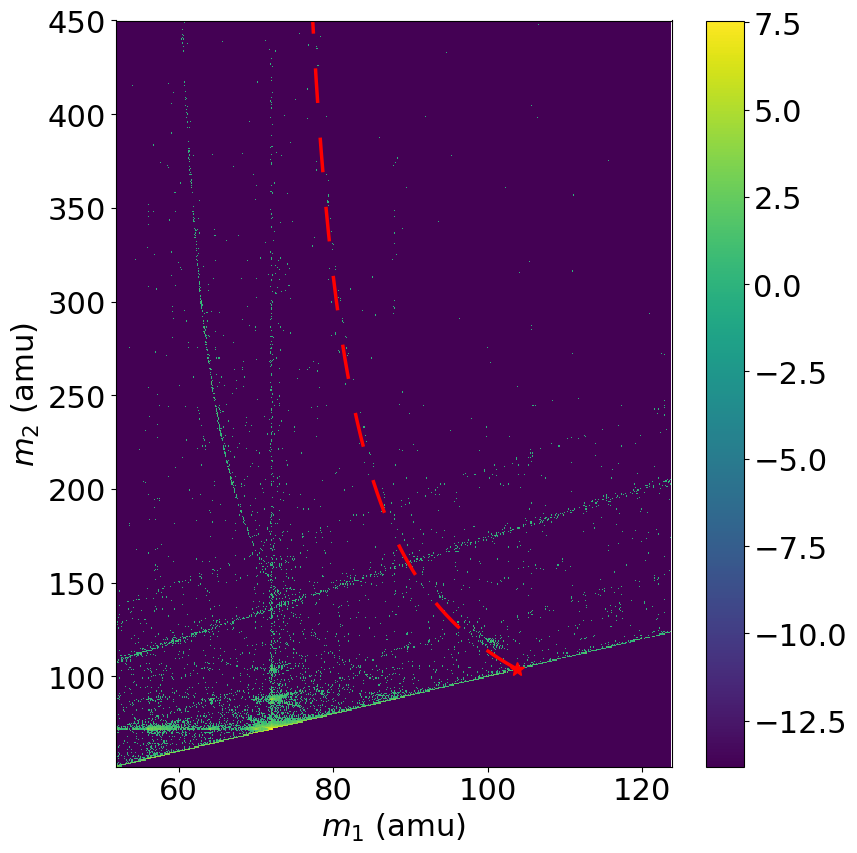

27 $FeO^2 \rightarrow Fe^1 + O^1: \DeltaE=-0.68eV$


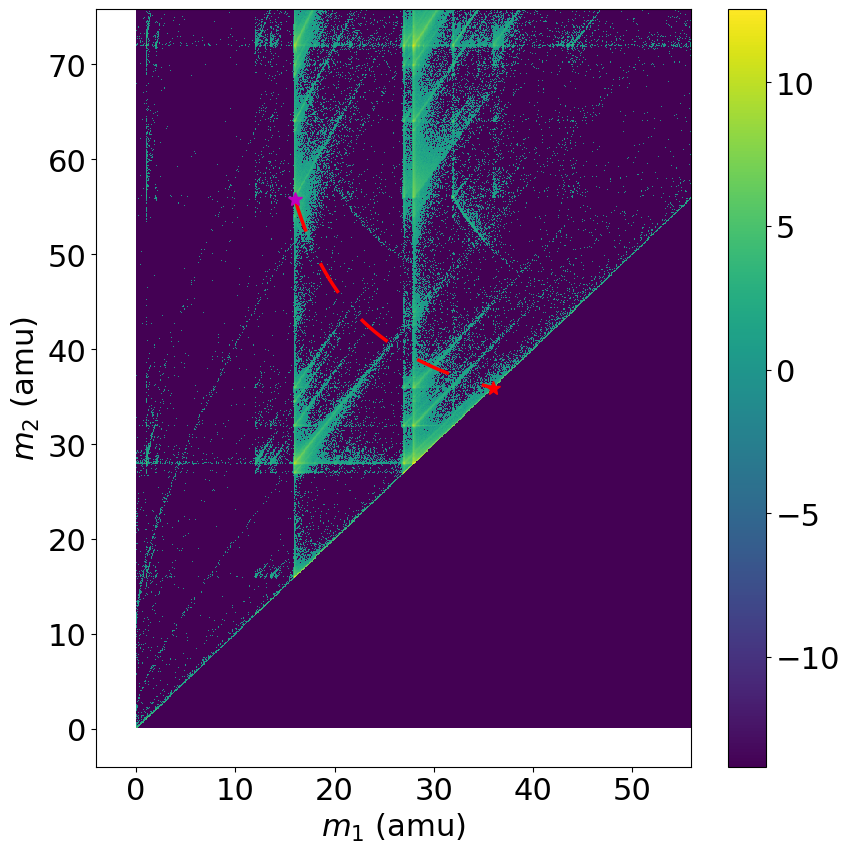

29 $Fe2O3^2 \rightarrow FeO^1 + FeO2^1: \DeltaE=-1.21eV$


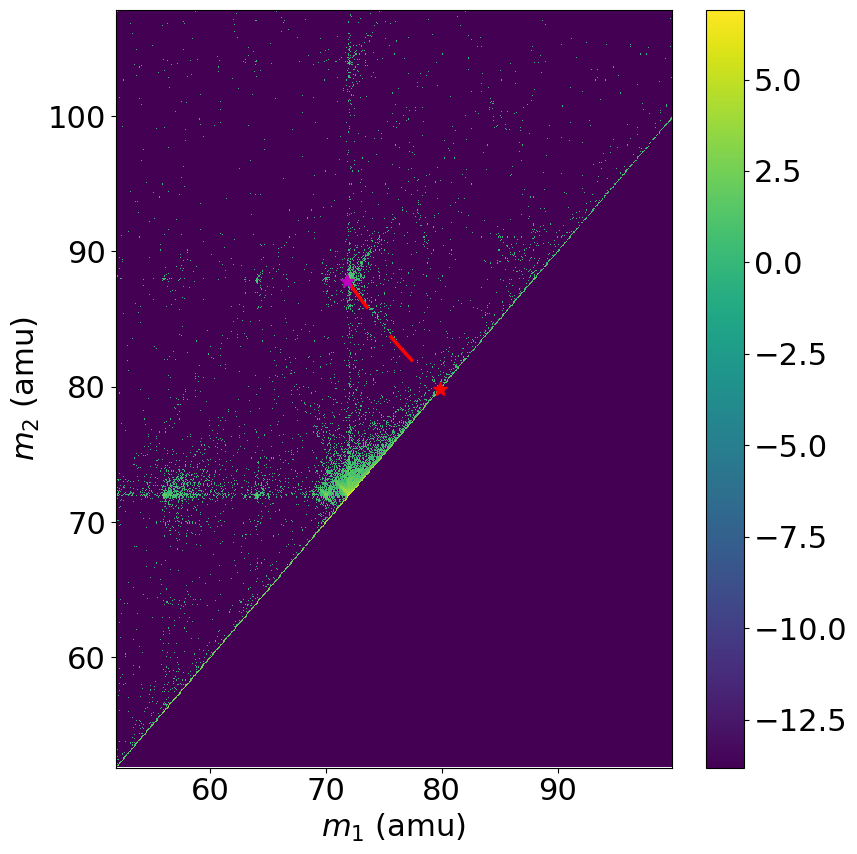

39 $Fe2O4^2 \rightarrow FeO^1 + FeO3^1: \DeltaE=-1.83eV$


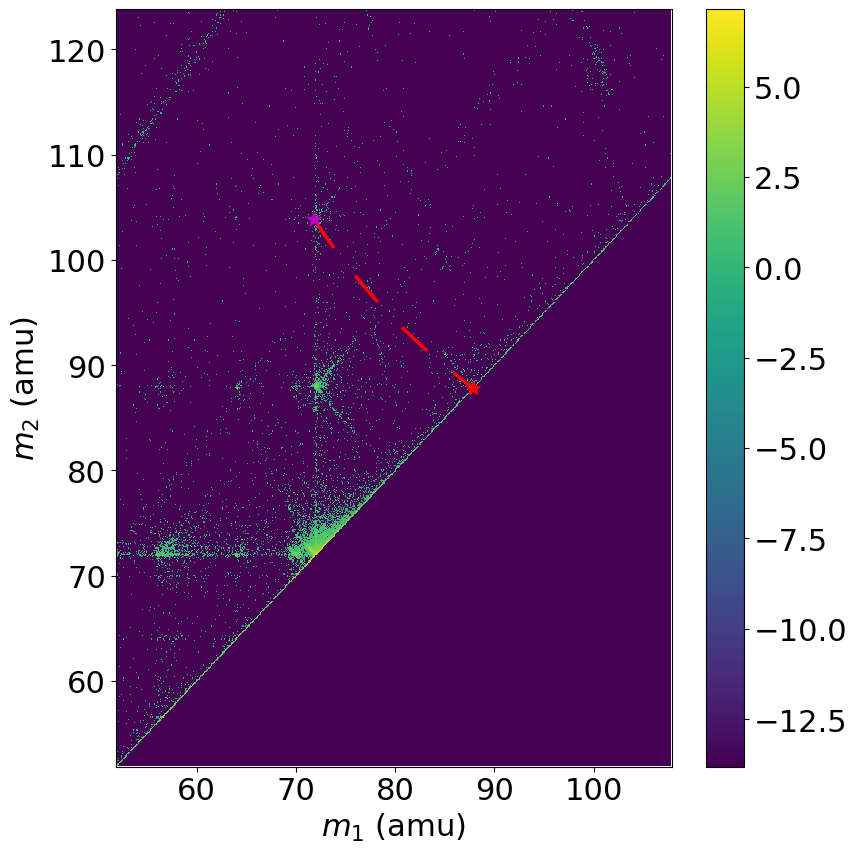

In [39]:
m1, m2,new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)
hits_along_track_pairs = {}
bins_along_track = {}
reaction_data = {}
reaction_data['FeO'] = {}
for index in FeO_common_reaction_indices:
    reaction_data['FeO'][index] = {}
    row = neg_pairs.iloc[index]
    mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)
    plt.figure(figsize=(9, 9))
    plt.rcParams.update({'font.size': 22})
    plt.rcParams['text.usetex'] = False
    if md1>md2:
        if md1>1e4:
            m1d,m2d = corr.diss_track(md1,md2,mp,interp_points=500)
            ind = np.where((m1>md2-20)&(m1 < mp+20) & (m2>md2-20)&(m2 < 500))
            h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)
            bins_along_track[index] = np.unique(np.array([np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2]).T,axis=0)
            hits_along_track_pairs[index] = h[bins_along_track[index][:,0],bins_along_track[index][:,1]][::-1] 
            #hits_along_track_pairs[index] = h[np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2][::-1] 
            X, Y = np.meshgrid(m1e, m2e)        
            plt.xlim([md2-20, mp+20])
            plt.ylim([md2-20, 450])
        else:
            m1d,m2d = corr.diss_track(md1,md2,mp,interp_points=500)
            ind = np.where((m1>md2-20)&(m1 < mp+20) & (m2>md2-20)&(m2 < md1+20))
            h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)
            bins_along_track[index] = np.unique(np.array([np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2]).T,axis=0)
            hits_along_track_pairs[index] = h[bins_along_track[index][:,0],bins_along_track[index][:,1]][::-1] 
            #hits_along_track_pairs[index] = h[np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2][::-1] 
            X, Y = np.meshgrid(m1e, m2e)        
            plt.xlim([md2-20, mp+20])
            plt.ylim([md2-20, md1+20])

    else:
        if md2>1e4:
            m1d,m2d = corr.diss_track(md2,md1,mp,interp_points=500)
            ind = np.where((m1>md1-20)&(m1 < mp+20) & (m2>md1-20)&(m2 < 500))
            h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)
            X, Y = np.meshgrid(m1e, m2e)
            bins_along_track[index] = np.unique(np.array([np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2]).T,axis=0)
            hits_along_track_pairs[index] = h[bins_along_track[index][:,0],bins_along_track[index][:,1]][::-1] 
            #hits_along_track_pairs[index] = h[np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2][::-1] 
            plt.xlim([md1-20, mp+20])
            plt.ylim([md1-20, 450])
        else:
            m1d,m2d = corr.diss_track(md2,md1,mp,interp_points=500)
            ind = np.where((m1>md1-20)&(m1 < mp+20) & (m2>md1-20)&(m2 < md2+20))
            h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)
            X, Y = np.meshgrid(m1e, m2e)
            bins_along_track[index] = np.unique(np.array([np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2]).T,axis=0)
            hits_along_track_pairs[index] = h[bins_along_track[index][:,0],bins_along_track[index][:,1]][::-1] 
            #hits_along_track_pairs[index] = h[np.digitize(m1d,m2e)-2,np.digitize(m2d,m1e)-2][::-1] 
            plt.xlim([md1-20, mp+20])
            plt.ylim([md1-20, md2+20])
            
    reaction_data['FeO'][index]['reaction'] = row
    reaction_data['FeO'][index]['hits'] = hits_along_track_pairs[index]
    reaction_data['FeO'][index]['bins'] = bins_along_track[index]
    
    
    plt.pcolormesh(X, Y, np.log(h + 1e-6))
    plt.plot(m2d, m1d, 'r',lw=2.5,ls='dashed',dashes=(10,10))
    plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
    plt.plot(m2d[0], m1d[0], 'm*',ms=10)
    plt.xlabel('$m_1$ (amu)')
    plt.ylabel('$m_2$ (amu)')
    plt.colorbar()
    plt.tight_layout()
    string = fr"{index} ${row['parent']}^{+row['cp']} \rightarrow {row['daughter_1']}^{+row['cd1']} + {row['daughter_2']}^{+row['cd2']}: \DeltaE={np.round(row['del_E'],2)}eV$"
    print(string)
    #plt.text(m2d[-1], m1d[-1],string)
    #print(index, row['parent'],'+',row['cp'],'->',row['daughter_1'],'+',row['cd1'],'',row['daughter_2'],'+',row['cd2'],':=',row['del_E'])
    plt.savefig(f'reaction_{index}_FeO.jpg',dpi=300)
    plt.show()

## specific reactions from correlation histograms

### 2: $FeO_2^{+1} \rightarrow Fe^{+1} + O_2  : \Delta E= -0.19113277699185377 eV$

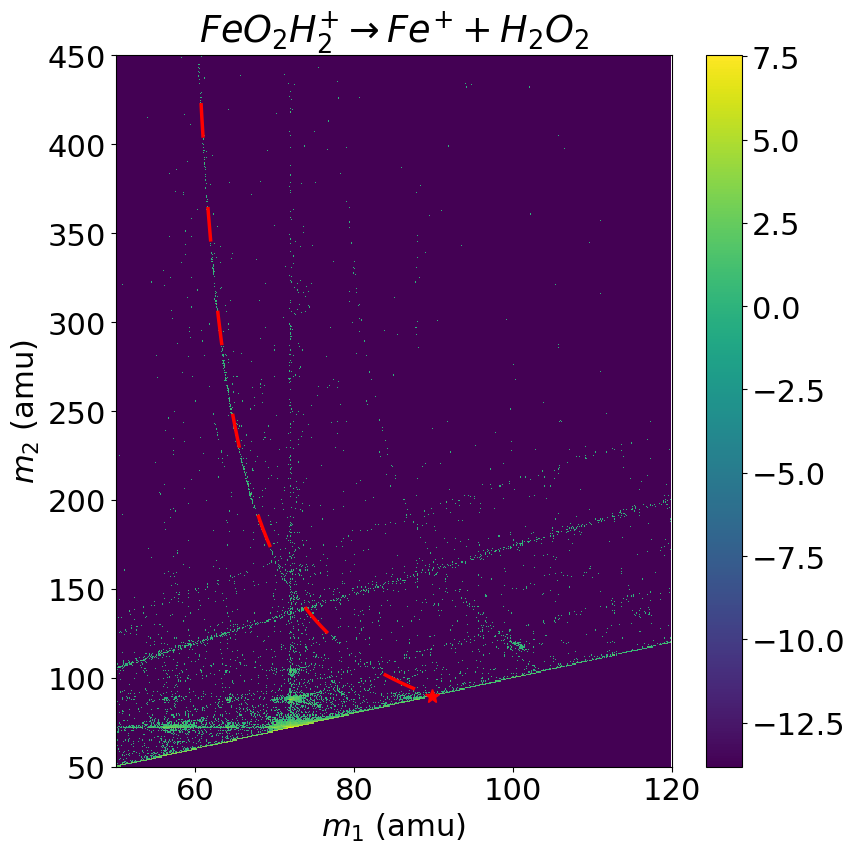

In [40]:
m1, m2, new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)

ind = np.where((m1>50)&(m1 < 120) & (m2>50)&(m2 < 500))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)

X, Y = np.meshgrid(m1e, m2e)


row = neg_pairs.iloc[2]
mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)
m1d,m2d = corr.diss_track(md1,md2,mp+2,interp_points=500) #adding 2H fits reaction quite well.


plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})
bins_along_track = np.unique(np.array([np.digitize(m1d,m1e)-2,np.digitize(m2d,m2e)-2]).T,axis=0)
hits_along_track = h[bins_along_track[:,1],bins_along_track[:,0]][::-1] 

plt.pcolormesh(X, Y, np.log(h + 1e-6))
plt.plot(m1d, m2d,'r',lw=2.5,ls='dashed',dashes=(10,20))
plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
plt.plot(m2d[0], m1d[0], 'm*',ms=10)
plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.xlim([50, 120])
plt.ylim([50, 450])
plt.title(r'$FeO_2H_2 ^{+} \rightarrow Fe^{+} + H_2O_2$')
plt.tight_layout()
#plt.savefig('reaction_modified_2_FeO.jpg',dpi=300)

plt.show()


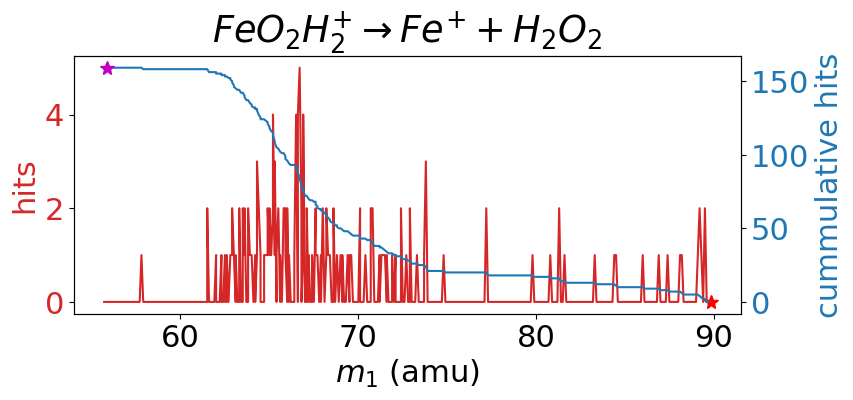

In [55]:
#plt.figure(figsize=(9, 8))
fig, ax1 = plt.subplots(figsize=(9,4))

color = 'tab:red'
ax1.set_xlabel('$m_1$ (amu)')
ax1.set_ylabel('hits', color=color)
ax1.plot(np.sort(m1e[bins_along_track[:,0]])[::-1],hits_along_track, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('cummulative hits', color=color)  # we already handled the x-label with ax1
ax2.plot(np.sort(m1e[bins_along_track[:,0]])[::-1],np.cumsum(hits_along_track), color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax1.plot(m2d[-1], 0, 'r*',ms=10)
ax2.plot(m1d[0],np.cumsum(hits_along_track)[-1], 'm*',ms=10)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title(r'$FeO_2H_2 ^{+} \rightarrow Fe^{+} + H_2O_2$')
#plt.savefig('reaction_modified_2_FeO_hits.jpg',dpi=300)
plt.show()

#### Detector impact distance of the pairs

In [45]:
indices_in_bin = diss.index_values_in_bin(m1,m2,ind,m1e,m2e,bins_along_track)
assert len(indices_in_bin)==np.cumsum(hits_along_track)[-1]
det_coord_pair_1 =np.vstack([new_dx1[ind][indices_in_bin],new_dy1[ind][indices_in_bin]]).T
det_coord_pair_2 =np.vstack([new_dx2[ind][indices_in_bin],new_dy2[ind][indices_in_bin]]).T
dist_coord = np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1)

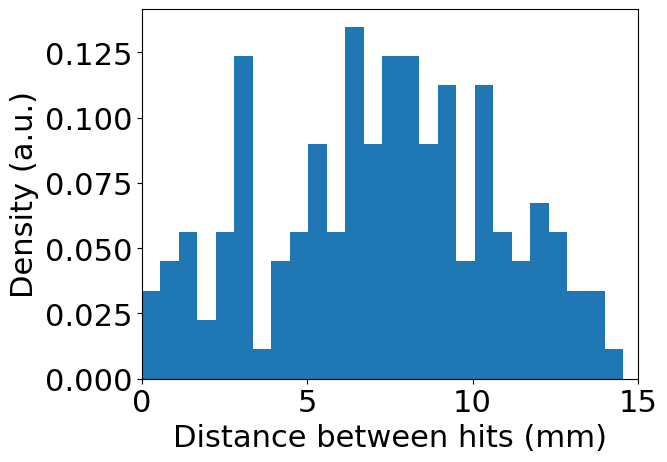

In [46]:
plt.hist(np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1),bins=100,density=True);
plt.xlabel('Distance between hits (mm)')
plt.ylabel('Density (a.u.)')
plt.xlim([0,15]);

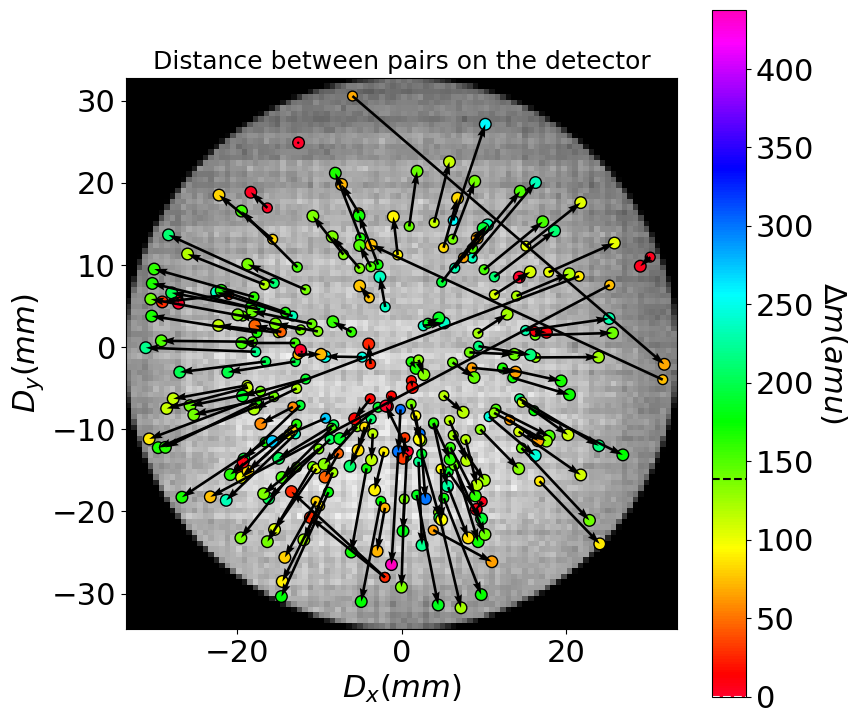

In [50]:
mass_diff = m2[ind][indices_in_bin]-m1[ind][indices_in_bin]
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx,dy,bins=100,cmap = matplotlib.colormaps['gray'])
cm = matplotlib.colormaps['gist_rainbow']
sc = plt.scatter(det_coord_pair_1[:,0],det_coord_pair_1[:,1],edgecolors='k',c=mass_diff,s=50,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
plt.scatter(det_coord_pair_2[:,0],det_coord_pair_2[:,1],edgecolors = 'k',c=mass_diff,s=70,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
cbar = plt.colorbar(sc)
cbar.ax.axhline(np.median(mass_diff), c='k',ls='--')
cbar.ax.axhline(np.abs(m2d[-1]-m1d[-1]),c='w',ls='--')
plt.quiver(det_coord_pair_1[:,0],det_coord_pair_1[:,1],det_coord_pair_2[:,0]-det_coord_pair_1[:,0],det_coord_pair_2[:,1]-det_coord_pair_1[:,1],angles='xy', scale_units='xy', scale=1)
plt.axis('square')

cbar.set_label('$\Delta m (amu)$', rotation=270,labelpad=25)
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout()
plt.title('Distance between pairs on the detector',fontdict={'fontsize':18});
#plt.savefig('reaction_2_FeO_detector.jpeg',dpi=300);


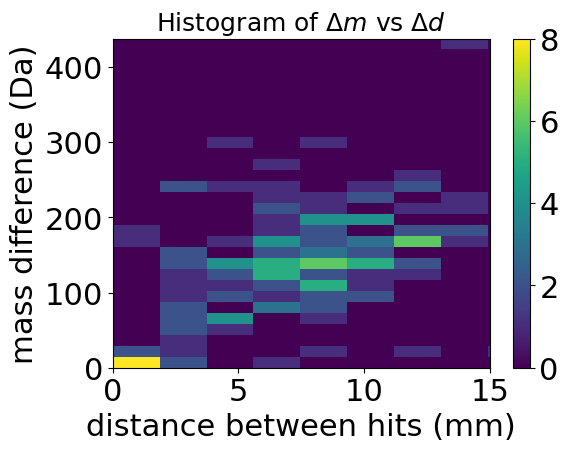

In [54]:
plt.hist2d(dist_coord,m2[ind][indices_in_bin]-m1[ind][indices_in_bin], bins=30)
plt.colorbar()
plt.xlabel('distance between hits (mm)')
plt.ylabel('mass difference (Da)')
plt.xlim([0,15])
plt.tight_layout()
plt.title(r'Histogram of $\Delta m$ vs $\Delta d $',fontdict={'fontsize':18});
#plt.savefig('reaction_modified_2_FeO_detector_dist.jpg',dpi=300);

### 7: $FeO_3^{+1} \rightarrow FeO^{+1} + O_2  : \Delta E= -1.1009182647386626 eV$

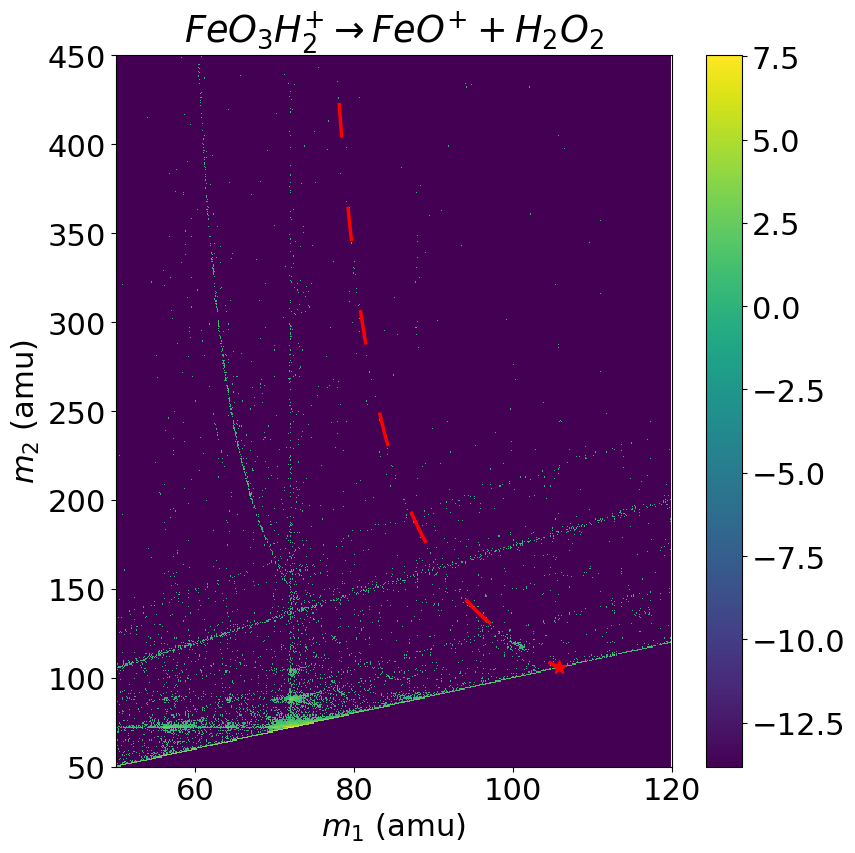

In [180]:
m1, m2, new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)

ind = np.where((m1>50)&(m1 < 120) & (m2>50)&(m2 < 500))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)

X, Y = np.meshgrid(m1e, m2e)


row = neg_pairs.iloc[7]
mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)
m1d,m2d = corr.diss_track(md1,md2,mp+2,interp_points=500) #adding 2H fits reaction quite well.


plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})
bins_along_track = np.unique(np.array([np.digitize(m1d,m1e)-2,np.digitize(m2d,m2e)-2]).T,axis=0)
hits_along_track = h[bins_along_track[:,1],bins_along_track[:,0]][::-1] 

plt.pcolormesh(X, Y, np.log(h + 1e-6))
plt.plot(m1d, m2d,'r',lw=2.5,ls='dashed',dashes=(10,20))
plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
plt.plot(m2d[0], m1d[0], 'm*',ms=10)
plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.xlim([50, 120])
plt.ylim([50, 450])
plt.title(r'$FeO_3H_2 ^{+} \rightarrow FeO^{+} + H_2O_2$')
plt.tight_layout()
#plt.savefig('reaction_modified_2_FeO.jpg',dpi=300)

plt.show()


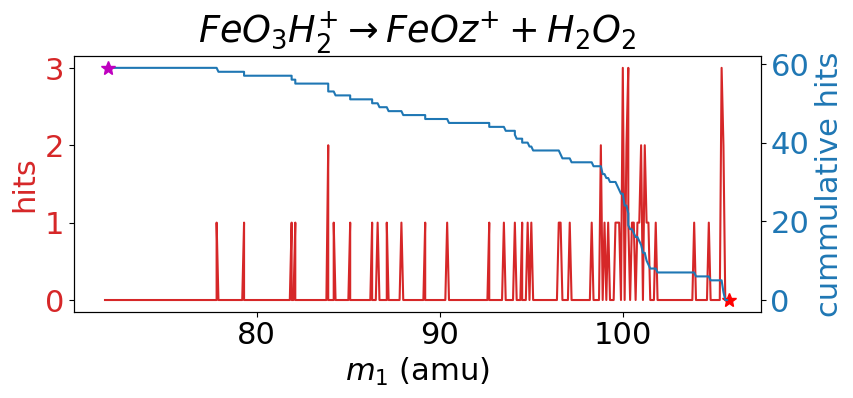

In [181]:
#plt.figure(figsize=(9, 8))
fig, ax1 = plt.subplots(figsize=(9,4))

color = 'tab:red'
ax1.set_xlabel('$m_1$ (amu)')
ax1.set_ylabel('hits', color=color)
ax1.plot(np.sort(m1e[bins_along_track[:,0]])[::-1],hits_along_track, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('cummulative hits', color=color)  # we already handled the x-label with ax1
ax2.plot(np.sort(m1e[bins_along_track[:,0]])[::-1],np.cumsum(hits_along_track), color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax1.plot(m2d[-1], 0, 'r*',ms=10)
ax2.plot(m1d[0],np.cumsum(hits_along_track)[-1], 'm*',ms=10)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title(r'$FeO_3H_2 ^{+} \rightarrow FeOz^{+} + H_2O_2$')
#plt.savefig('reaction_modified_2_FeO_hits.jpg',dpi=300)
plt.show()

#### Detector impact distance of the pairs

In [182]:
indices_in_bin = diss.index_values_in_bin(m1,m2,ind,m1e,m2e,bins_along_track)
assert len(indices_in_bin)==np.cumsum(hits_along_track)[-1]
det_coord_pair_1 =np.vstack([new_dx1[ind][indices_in_bin],new_dy1[ind][indices_in_bin]]).T
det_coord_pair_2 =np.vstack([new_dx2[ind][indices_in_bin],new_dy2[ind][indices_in_bin]]).T
dist_coord = np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1)

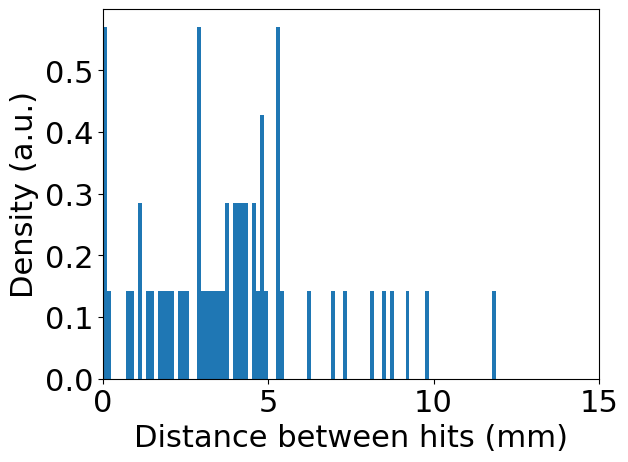

In [183]:
plt.hist(np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1),bins=100,density=True);
plt.xlabel('Distance between hits (mm)')
plt.ylabel('Density (a.u.)')
plt.xlim([0,15]);

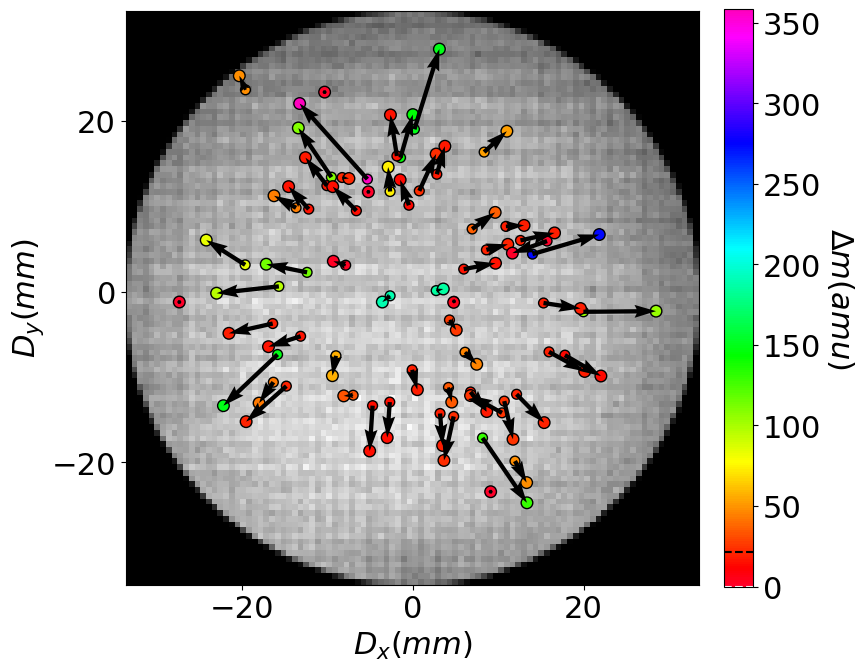

In [186]:
mass_diff = m2[ind][indices_in_bin]-m1[ind][indices_in_bin]
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx,dy,bins=100,cmap = matplotlib.colormaps['gray'])
cm = matplotlib.colormaps['gist_rainbow']
sc = plt.scatter(det_coord_pair_1[:,0],det_coord_pair_1[:,1],edgecolors='k',c=mass_diff,s=50,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
plt.scatter(det_coord_pair_2[:,0],det_coord_pair_2[:,1],edgecolors = 'k',c=mass_diff,s=70,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
cbar = plt.colorbar(sc,fraction=0.046, pad=0.04)
plt.xticks(np.arange(-20,25,20))
plt.yticks(np.arange(-20,25,20))
cbar.ax.axhline(np.median(mass_diff), c='k',ls='--')
cbar.ax.axhline(np.abs(m2d[-1]-m1d[-1]),c='w',ls='--')
plt.quiver(det_coord_pair_1[:,0],det_coord_pair_1[:,1],det_coord_pair_2[:,0]-det_coord_pair_1[:,0],det_coord_pair_2[:,1]-det_coord_pair_1[:,1],angles='xy', scale_units='xy', scale=1)
plt.axis('square')

cbar.set_label('$\Delta m (amu)$', rotation=270,labelpad=25)
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout()
#plt.title('Distance between pairs on the detector',fontdict={'fontsize':18});
plt.savefig('reaction_7_FeO_detector.jpeg',dpi=300);


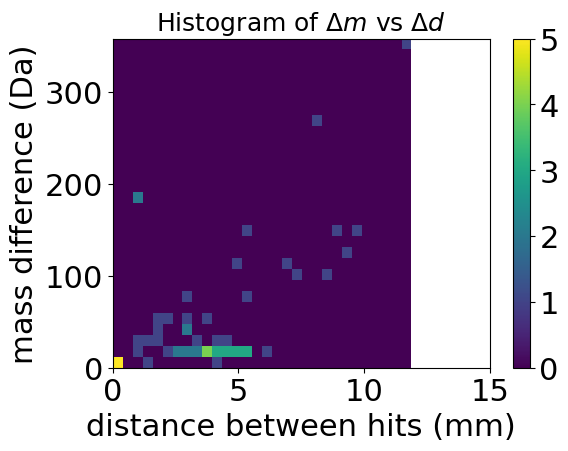

In [61]:
plt.hist2d(dist_coord,m2[ind][indices_in_bin]-m1[ind][indices_in_bin], bins=30)
plt.colorbar()
plt.xlabel('distance between hits (mm)')
plt.ylabel('mass difference (Da)')
plt.xlim([0,15])
plt.tight_layout()
plt.title(r'Histogram of $\Delta m$ vs $\Delta d $',fontdict={'fontsize':18});
#plt.savefig('reaction_modified_2_FeO_detector_dist.jpg',dpi=300);

### 7: $FeO_3^{+1} \rightarrow FeO^{+1} + O_2  : \Delta E= -1.1009182647386626 eV$

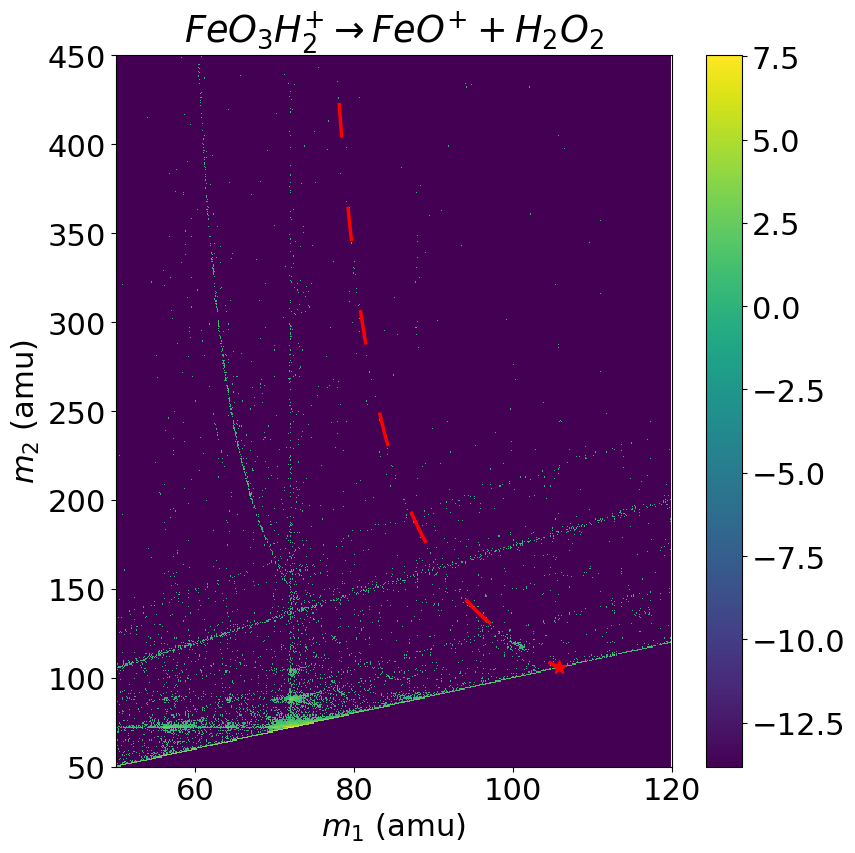

In [134]:
m1, m2, new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)

ind = np.where((m1>50)&(m1 < 120) & (m2>50)&(m2 < 500))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)

X, Y = np.meshgrid(m1e, m2e)


row = neg_pairs.iloc[7]
mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)
m1d,m2d = corr.diss_track(md1,md2,mp+2,interp_points=500) #adding 2H fits reaction quite well.


plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})
bins_along_track = np.unique(np.array([np.digitize(m1d,m1e)-2,np.digitize(m2d,m2e)-2]).T,axis=0)
hits_along_track = h[bins_along_track[:,1],bins_along_track[:,0]][::-1] 

plt.pcolormesh(X, Y, np.log(h + 1e-6))
plt.plot(m1d, m2d,'r',lw=2.5,ls='dashed',dashes=(10,20))
plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
plt.plot(m2d[0], m1d[0], 'm*',ms=10)
plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.xlim([50, 120])
plt.ylim([50, 450])
plt.title(r'$FeO_3H_2 ^{+} \rightarrow FeO^{+} + H_2O_2$')
plt.tight_layout()
#plt.savefig('reaction_modified_2_FeO.jpg',dpi=300)

plt.show()


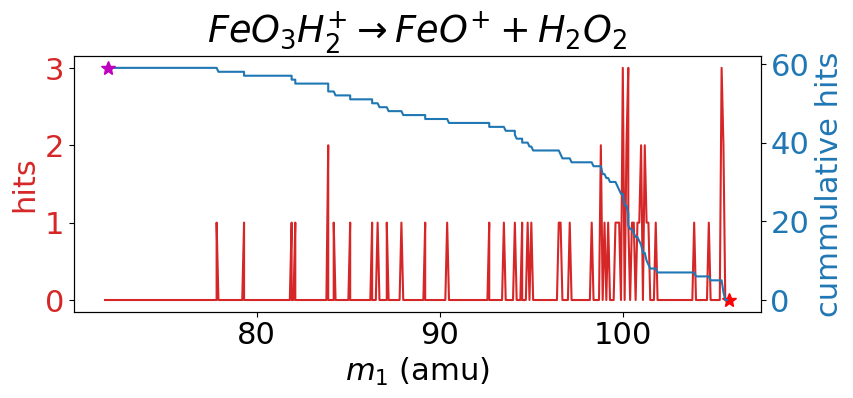

In [135]:
#plt.figure(figsize=(9, 8))
fig, ax1 = plt.subplots(figsize=(9,4))

color = 'tab:red'
ax1.set_xlabel('$m_1$ (amu)')
ax1.set_ylabel('hits', color=color)
ax1.plot(np.sort(m1e[bins_along_track[:,0]])[::-1],hits_along_track, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('cummulative hits', color=color)  # we already handled the x-label with ax1
ax2.plot(np.sort(m1e[bins_along_track[:,0]])[::-1],np.cumsum(hits_along_track), color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax1.plot(m2d[-1], 0, 'r*',ms=10)
ax2.plot(m1d[0],np.cumsum(hits_along_track)[-1], 'm*',ms=10)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title(r'$FeO_3H_2 ^{+} \rightarrow FeO^{+} + H_2O_2$')
#plt.savefig('reaction_modified_2_FeO_hits.jpg',dpi=300)
plt.show()

#### Detector impact distance of the pairs

In [136]:
indices_in_bin = diss.index_values_in_bin(m1,m2,ind,m1e,m2e,bins_along_track)
assert len(indices_in_bin)==np.cumsum(hits_along_track)[-1]
det_coord_pair_1 =np.vstack([new_dx1[ind][indices_in_bin],new_dy1[ind][indices_in_bin]]).T
det_coord_pair_2 =np.vstack([new_dx2[ind][indices_in_bin],new_dy2[ind][indices_in_bin]]).T
dist_coord = np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1)

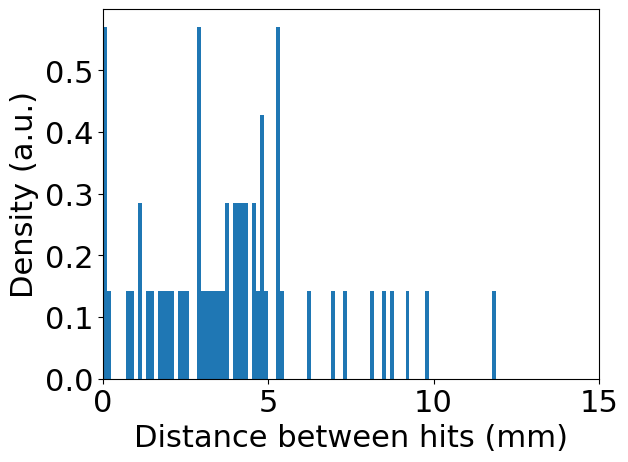

In [137]:
plt.hist(np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1),bins=100,density=True);
plt.xlabel('Distance between hits (mm)')
plt.ylabel('Density (a.u.)')
plt.xlim([0,15]);

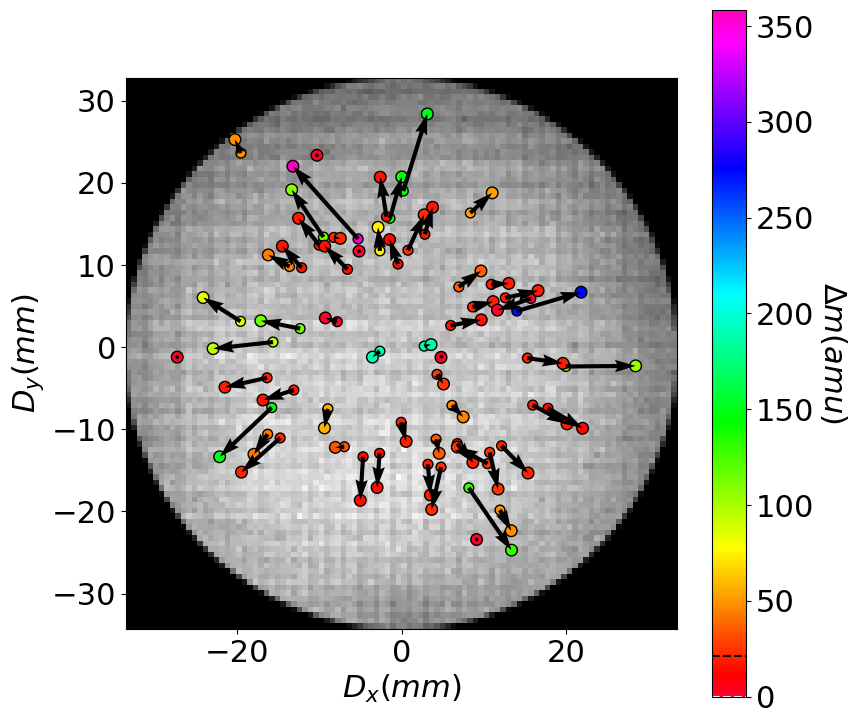

In [139]:
mass_diff = m2[ind][indices_in_bin]-m1[ind][indices_in_bin]
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx,dy,bins=100,cmap = matplotlib.colormaps['gray'])
cm = matplotlib.colormaps['gist_rainbow']
sc = plt.scatter(det_coord_pair_1[:,0],det_coord_pair_1[:,1],edgecolors='k',c=mass_diff,s=50,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
plt.scatter(det_coord_pair_2[:,0],det_coord_pair_2[:,1],edgecolors = 'k',c=mass_diff,s=70,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
cbar = plt.colorbar(sc)
cbar.ax.axhline(np.median(mass_diff), c='k',ls='--')
cbar.ax.axhline(np.abs(m2d[-1]-m1d[-1]),c='w',ls='--')
plt.quiver(det_coord_pair_1[:,0],det_coord_pair_1[:,1],det_coord_pair_2[:,0]-det_coord_pair_1[:,0],det_coord_pair_2[:,1]-det_coord_pair_1[:,1],angles='xy', scale_units='xy', scale=1)
plt.axis('square')

cbar.set_label('$\Delta m (amu)$', rotation=270,labelpad=25)
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout()
#plt.title('Distance between pairs on the detector',fontdict={'fontsize':18});

plt.savefig('reaction_7_FeO_detector.jpeg',dpi=300);


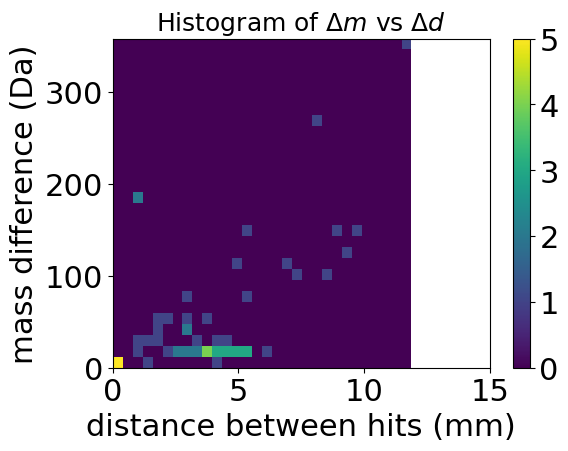

In [61]:
plt.hist2d(dist_coord,m2[ind][indices_in_bin]-m1[ind][indices_in_bin], bins=30)
plt.colorbar()
plt.xlabel('distance between hits (mm)')
plt.ylabel('mass difference (Da)')
plt.xlim([0,15])
plt.tight_layout()
plt.title(r'Histogram of $\Delta m$ vs $\Delta d $',fontdict={'fontsize':18});
#plt.savefig('reaction_modified_2_FeO_detector_dist.jpg',dpi=300);

### 3: $FeO_2^{+2} \rightarrow FeO^{+1} + O^{+1}  : \Delta E= -0.97 eV$

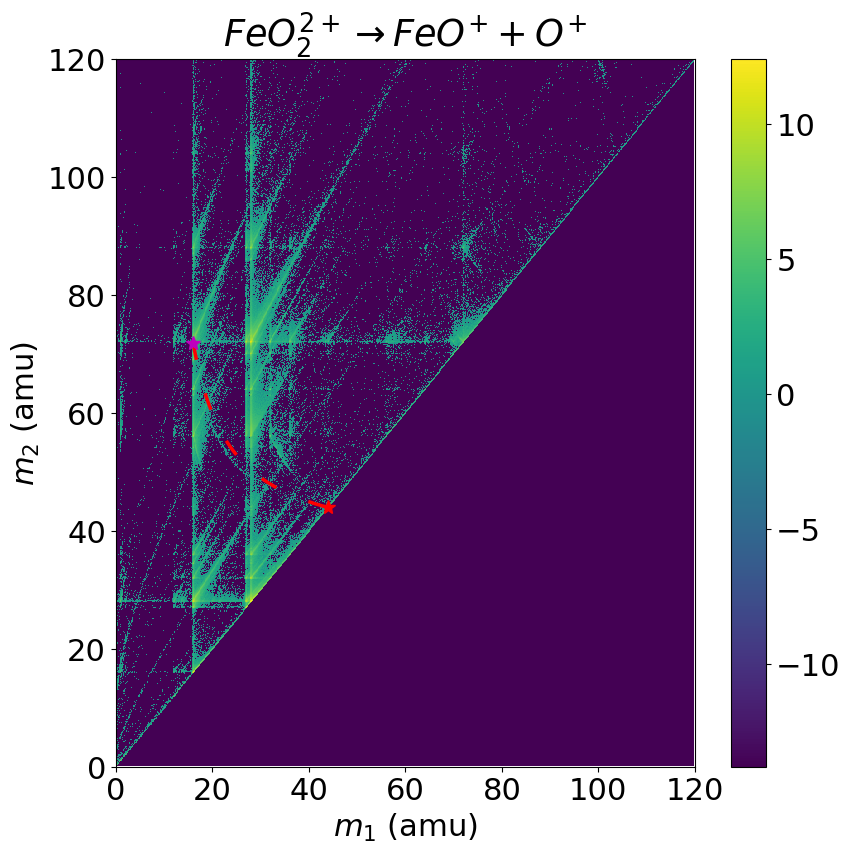

In [89]:
m1, m2, new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)

ind = np.where((m1 < 120) & (m2 < 120))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)
X, Y = np.meshgrid(m1e, m2e)
row = neg_pairs.iloc[3]
mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)
m1d,m2d = corr.diss_track(md2,md1,mp,interp_points=100) 

plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})
bins_along_track = np.unique(np.array([np.digitize(m1d,m1e)-2,np.digitize(m2d,m2e)-2]).T,axis=0)
hits_along_track = h[bins_along_track[:,0],bins_along_track[:,1]][::-1] 

plt.pcolormesh(X, Y, np.log(h + 1e-6))
plt.plot(m2d, m1d,'r',lw=2.5,ls='dashed',dashes=(5,10))
plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
plt.plot(m2d[0], m1d[0], 'm*',ms=10)
plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.xlim([0, 120])
plt.ylim([0, 120])
plt.title(r'$FeO_2 ^{2+} \rightarrow FeO^{+} + O^{+}$')
plt.tight_layout()
plt.show()

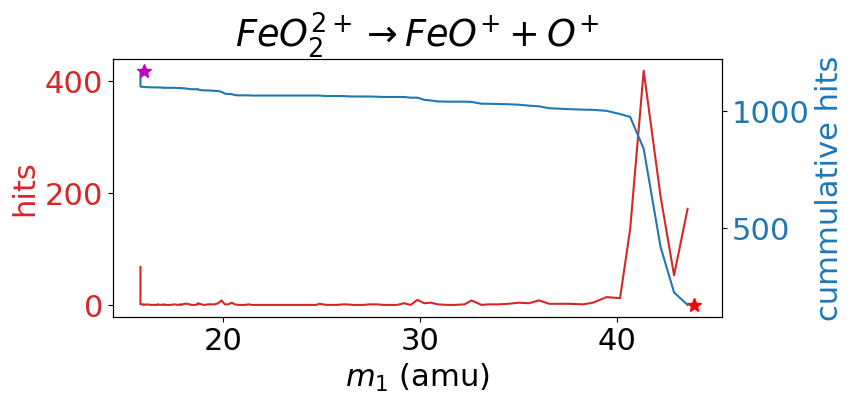

In [88]:
#plt.figure(figsize=(9, 8))
fig, ax1 = plt.subplots(figsize=(9,4))

color = 'tab:red'
ax1.set_xlabel('$m_1$ (amu)')
ax1.set_ylabel('hits', color=color)
ax1.plot(np.sort(m1e[bins_along_track[:,1]])[::-1],hits_along_track, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('cummulative hits', color=color)  # we already handled the x-label with ax1
ax2.plot(np.sort(m1e[bins_along_track[:,1]])[::-1],np.cumsum(hits_along_track), color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax1.plot(m2d[-1], 0, 'r*',ms=10)
ax2.plot(m2d[0],np.cumsum(hits_along_track)[-1], 'm*',ms=10)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title(r'$FeO_2 ^{2+} \rightarrow FeO^{+} + O^{+}$')
plt.show()

#### Detector impact distance of the pairs

In [82]:
indices_in_bin = diss.index_values_in_bin(m2,m1,ind,m2e,m1e,bins_along_track)
assert len(indices_in_bin)==np.cumsum(hits_along_track)[-1]
det_coord_pair_1 =np.vstack([new_dx1[ind][indices_in_bin],new_dy1[ind][indices_in_bin]]).T
det_coord_pair_2 =np.vstack([new_dx2[ind][indices_in_bin],new_dy2[ind][indices_in_bin]]).T
dist_coord = np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1)

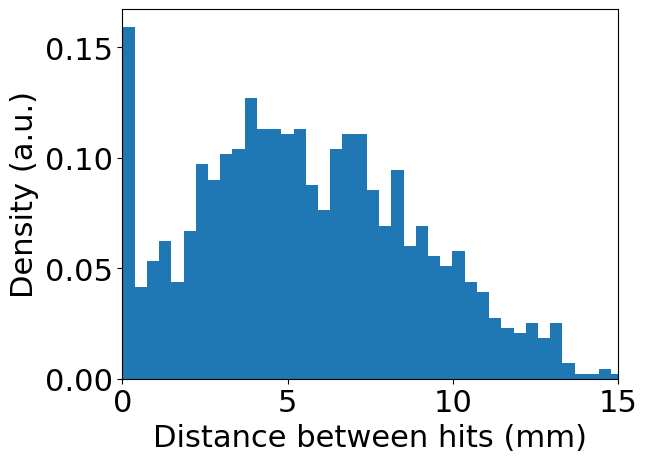

In [83]:
plt.hist(np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1),bins=100,density=True);
plt.xlabel('Distance between hits (mm)')
plt.ylabel('Density (a.u.)')
plt.xlim([0,15]);

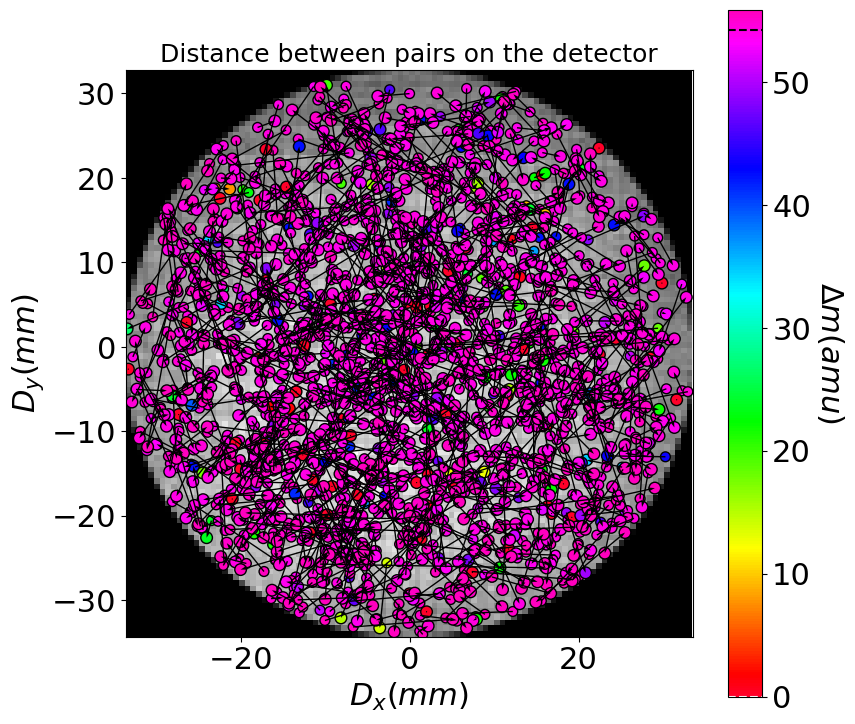

In [84]:
mass_diff = m2[ind][indices_in_bin]-m1[ind][indices_in_bin]
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx,dy,bins=100,cmap = matplotlib.colormaps['gray'])
cm = matplotlib.colormaps['gist_rainbow']
sc = plt.scatter(det_coord_pair_1[:,0],det_coord_pair_1[:,1],edgecolors='k',c=mass_diff,s=50,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
plt.scatter(det_coord_pair_2[:,0],det_coord_pair_2[:,1],edgecolors = 'k',c=mass_diff,s=70,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
cbar = plt.colorbar(sc)
cbar.ax.axhline(np.median(mass_diff), c='k',ls='--')
cbar.ax.axhline(np.abs(m2d[-1]-m1d[-1]),c='w',ls='--')
plt.quiver(det_coord_pair_1[:,0],det_coord_pair_1[:,1],det_coord_pair_2[:,0]-det_coord_pair_1[:,0],det_coord_pair_2[:,1]-det_coord_pair_1[:,1],angles='xy', scale_units='xy', scale=1)
plt.axis('square')

cbar.set_label('$\Delta m (amu)$', rotation=270,labelpad=25)
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout()
plt.title('Distance between pairs on the detector',fontdict={'fontsize':18});
#plt.savefig('reaction_2_FeO_detector.jpeg',dpi=300);


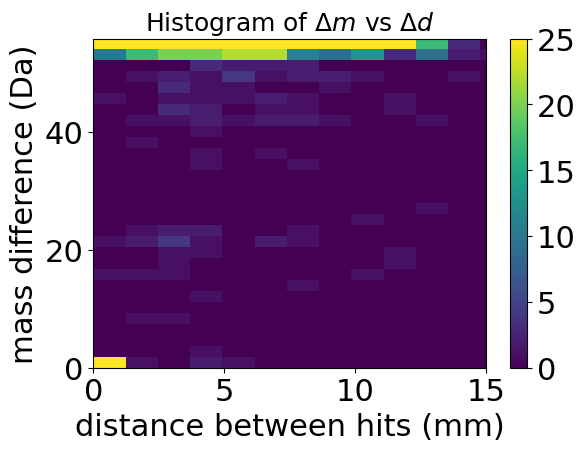

In [87]:
plt.hist2d(dist_coord,m2[ind][indices_in_bin]-m1[ind][indices_in_bin], bins=30,vmin=0,vmax=25)
plt.colorbar()
plt.xlabel('distance between hits (mm)')
plt.ylabel('mass difference (Da)')
plt.xlim([0,15])
plt.tight_layout()
plt.title(r'Histogram of $\Delta m$ vs $\Delta d $',fontdict={'fontsize':18});
#plt.savefig('reaction_modified_2_FeO_detector_dist.jpg',dpi=300);

### 4: $FeO_2^{+2} \rightarrow Fe^{+1} + O_2^{+1}  : \Delta E= -4.92 eV$

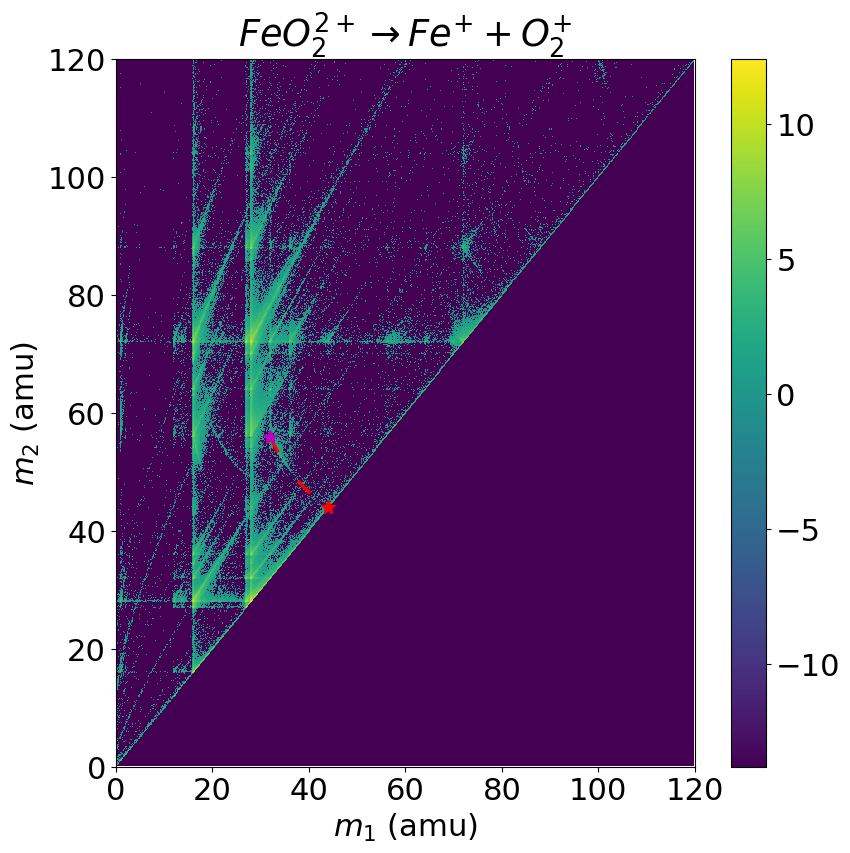

In [92]:
m1, m2, new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)

ind = np.where((m1 < 120) & (m2 < 120))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)
X, Y = np.meshgrid(m1e, m2e)
row = neg_pairs.iloc[4]
mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)
m1d,m2d = corr.diss_track(md1,md2,mp,interp_points=100) 

plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})
bins_along_track = np.unique(np.array([np.digitize(m1d,m1e)-2,np.digitize(m2d,m2e)-2]).T,axis=0)
hits_along_track = h[bins_along_track[:,0],bins_along_track[:,1]][::-1] 

plt.pcolormesh(X, Y, np.log(h + 1e-6))
plt.plot(m2d, m1d,'r',lw=2.5,ls='dashed',dashes=(5,10))
plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
plt.plot(m2d[0], m1d[0], 'm*',ms=10)
plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.xlim([0, 120])
plt.ylim([0, 120])
plt.title(r'$FeO_2 ^{2+} \rightarrow Fe^{+} + O_2^{+}$')
plt.tight_layout()
plt.show()

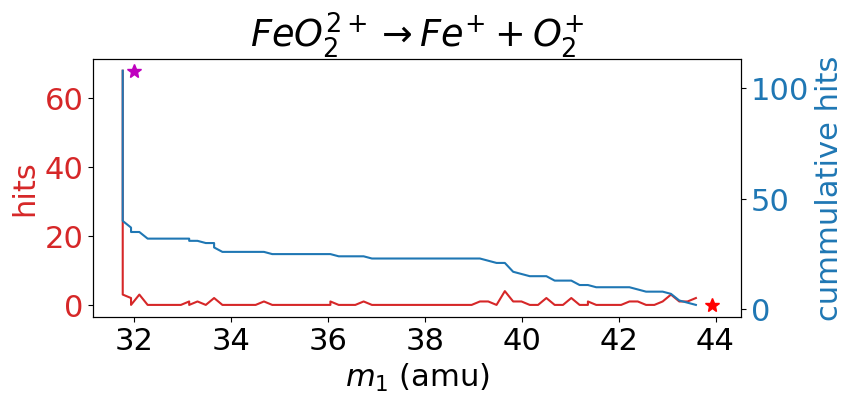

In [93]:
#plt.figure(figsize=(9, 8))
fig, ax1 = plt.subplots(figsize=(9,4))

color = 'tab:red'
ax1.set_xlabel('$m_1$ (amu)')
ax1.set_ylabel('hits', color=color)
ax1.plot(np.sort(m1e[bins_along_track[:,1]])[::-1],hits_along_track, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('cummulative hits', color=color)  # we already handled the x-label with ax1
ax2.plot(np.sort(m1e[bins_along_track[:,1]])[::-1],np.cumsum(hits_along_track), color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax1.plot(m2d[-1], 0, 'r*',ms=10)
ax2.plot(m2d[0],np.cumsum(hits_along_track)[-1], 'm*',ms=10)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title(r'$FeO_2 ^{2+} \rightarrow Fe^{+} + O_2^{+}$')
plt.show()

#### Detector impact distance of the pairs

In [94]:
indices_in_bin = diss.index_values_in_bin(m2,m1,ind,m2e,m1e,bins_along_track)
assert len(indices_in_bin)==np.cumsum(hits_along_track)[-1]
det_coord_pair_1 =np.vstack([new_dx1[ind][indices_in_bin],new_dy1[ind][indices_in_bin]]).T
det_coord_pair_2 =np.vstack([new_dx2[ind][indices_in_bin],new_dy2[ind][indices_in_bin]]).T
dist_coord = np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1)

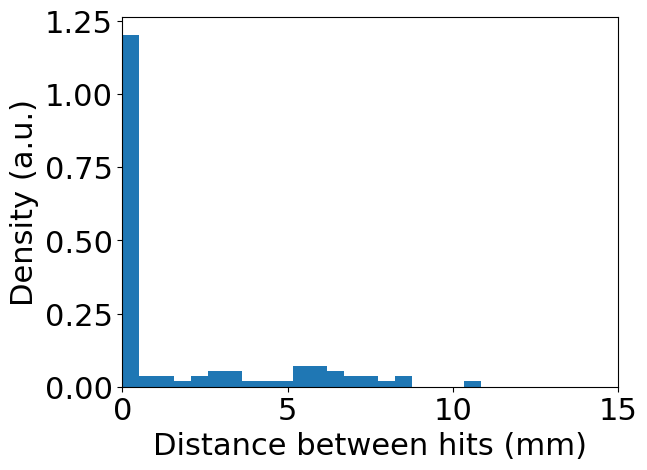

In [95]:
plt.hist(np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1),bins=100,density=True);
plt.xlabel('Distance between hits (mm)')
plt.ylabel('Density (a.u.)')
plt.xlim([0,15]);

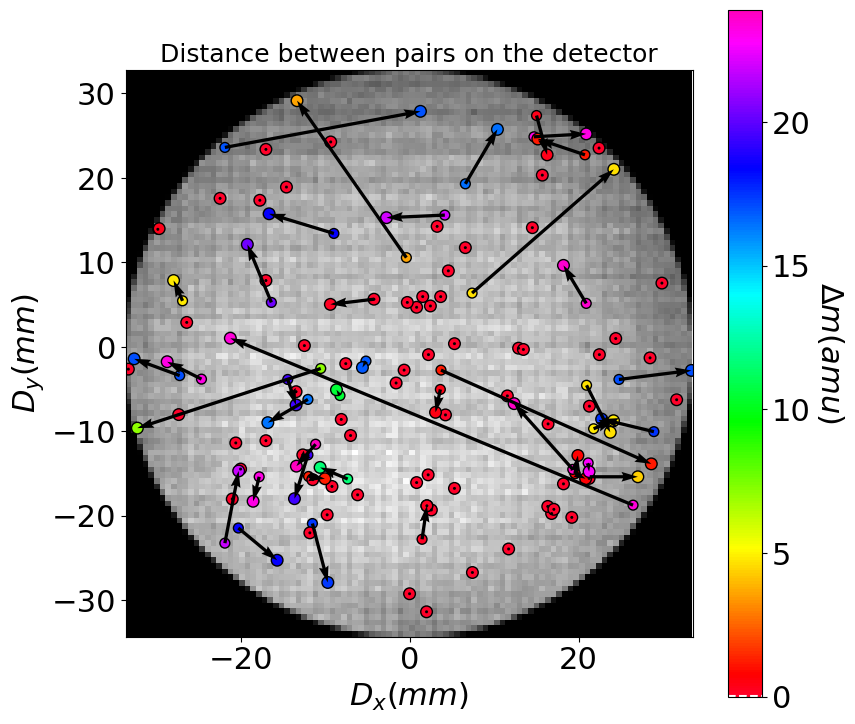

In [96]:
mass_diff = m2[ind][indices_in_bin]-m1[ind][indices_in_bin]
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx,dy,bins=100,cmap = matplotlib.colormaps['gray'])
cm = matplotlib.colormaps['gist_rainbow']
sc = plt.scatter(det_coord_pair_1[:,0],det_coord_pair_1[:,1],edgecolors='k',c=mass_diff,s=50,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
plt.scatter(det_coord_pair_2[:,0],det_coord_pair_2[:,1],edgecolors = 'k',c=mass_diff,s=70,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
cbar = plt.colorbar(sc)
cbar.ax.axhline(np.median(mass_diff), c='k',ls='--')
cbar.ax.axhline(np.abs(m2d[-1]-m1d[-1]),c='w',ls='--')
plt.quiver(det_coord_pair_1[:,0],det_coord_pair_1[:,1],det_coord_pair_2[:,0]-det_coord_pair_1[:,0],det_coord_pair_2[:,1]-det_coord_pair_1[:,1],angles='xy', scale_units='xy', scale=1)
plt.axis('square')

cbar.set_label('$\Delta m (amu)$', rotation=270,labelpad=25)
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout()
plt.title('Distance between pairs on the detector',fontdict={'fontsize':18});
#plt.savefig('reaction_2_FeO_detector.jpeg',dpi=300);


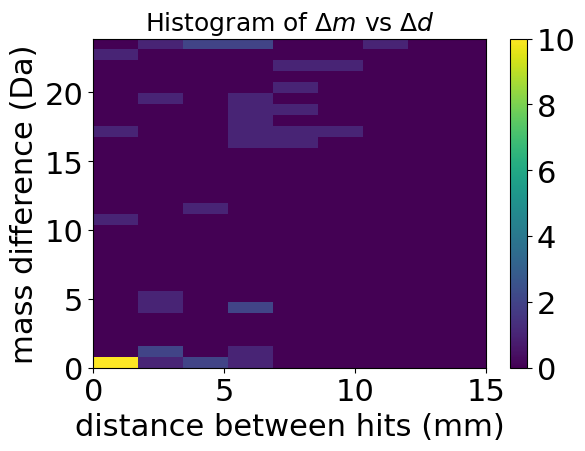

In [99]:
plt.hist2d(dist_coord,m2[ind][indices_in_bin]-m1[ind][indices_in_bin], bins=30,vmin=0,vmax=10)
plt.colorbar()
plt.xlabel('distance between hits (mm)')
plt.ylabel('mass difference (Da)')
plt.xlim([0,15])
plt.tight_layout()
plt.title(r'Histogram of $\Delta m$ vs $\Delta d $',fontdict={'fontsize':18});
#plt.savefig('reaction_modified_2_FeO_detector_dist.jpg',dpi=300);

### 27 $FeO^{+2} \rightarrow Fe^{+1} + O^{+1}  : \Delta E= -0.68 eV$

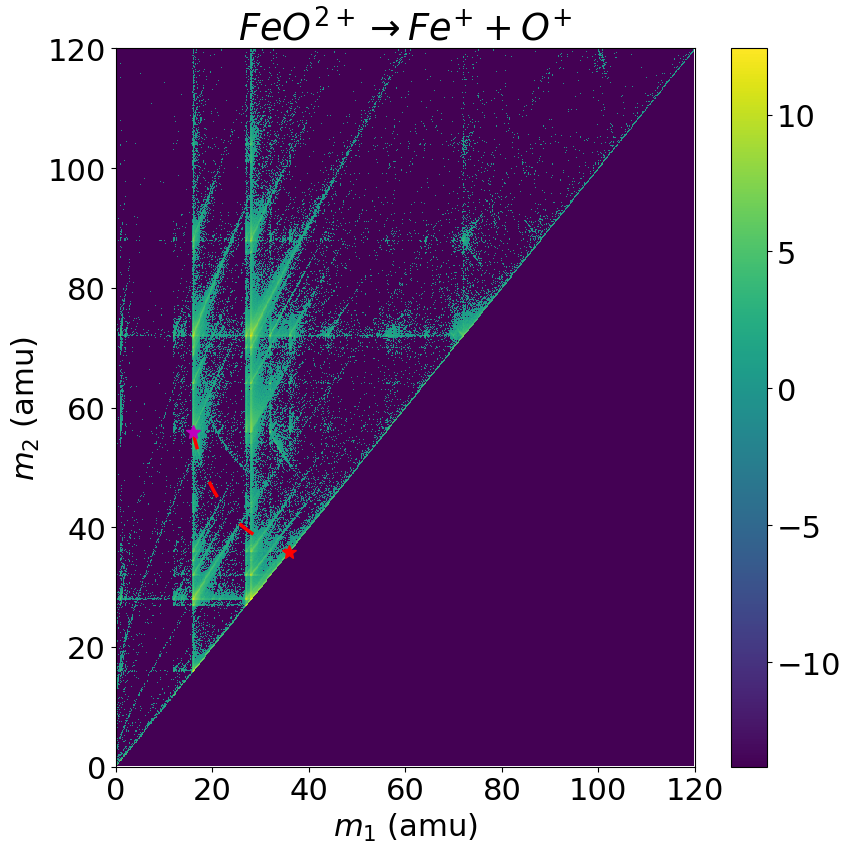

In [101]:
m1, m2, new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)

ind = np.where((m1 < 120) & (m2 < 120))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)
X, Y = np.meshgrid(m1e, m2e)
row = neg_pairs.iloc[27]
mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)
m1d,m2d = corr.diss_track(md1,md2,mp,interp_points=100) 

plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})
bins_along_track = np.unique(np.array([np.digitize(m1d,m1e)-2,np.digitize(m2d,m2e)-2]).T,axis=0)
hits_along_track = h[bins_along_track[:,0],bins_along_track[:,1]][::-1] 

plt.pcolormesh(X, Y, np.log(h + 1e-6))
plt.plot(m2d, m1d,'r',lw=2.5,ls='dashed',dashes=(5,10))
plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
plt.plot(m2d[0], m1d[0], 'm*',ms=10)
plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.xlim([0, 120])
plt.ylim([0, 120])
plt.title(r'$FeO ^{2+} \rightarrow Fe^{+} + O^{+}$')
plt.tight_layout()
plt.show()

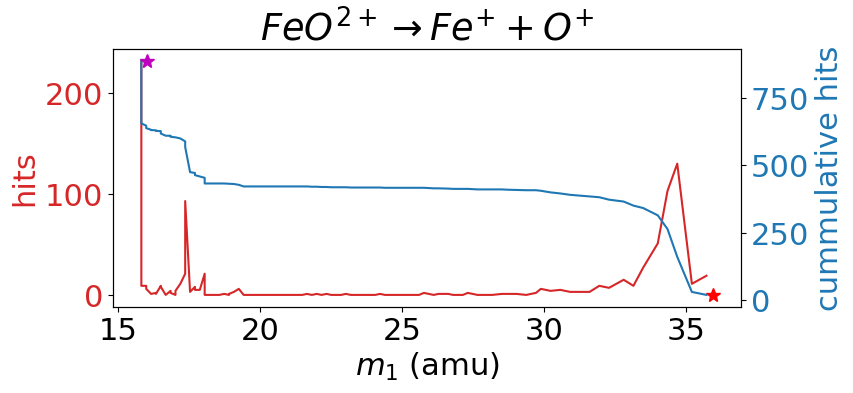

In [102]:
#plt.figure(figsize=(9, 8))
fig, ax1 = plt.subplots(figsize=(9,4))

color = 'tab:red'
ax1.set_xlabel('$m_1$ (amu)')
ax1.set_ylabel('hits', color=color)
ax1.plot(np.sort(m1e[bins_along_track[:,1]])[::-1],hits_along_track, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('cummulative hits', color=color)  # we already handled the x-label with ax1
ax2.plot(np.sort(m1e[bins_along_track[:,1]])[::-1],np.cumsum(hits_along_track), color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax1.plot(m2d[-1], 0, 'r*',ms=10)
ax2.plot(m2d[0],np.cumsum(hits_along_track)[-1], 'm*',ms=10)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title(r'$FeO ^{2+} \rightarrow Fe^{+} + O^{+}$')
plt.show()

#### Detector impact distance of the pairs

In [103]:
indices_in_bin = diss.index_values_in_bin(m2,m1,ind,m2e,m1e,bins_along_track)
assert len(indices_in_bin)==np.cumsum(hits_along_track)[-1]
det_coord_pair_1 =np.vstack([new_dx1[ind][indices_in_bin],new_dy1[ind][indices_in_bin]]).T
det_coord_pair_2 =np.vstack([new_dx2[ind][indices_in_bin],new_dy2[ind][indices_in_bin]]).T
dist_coord = np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1)

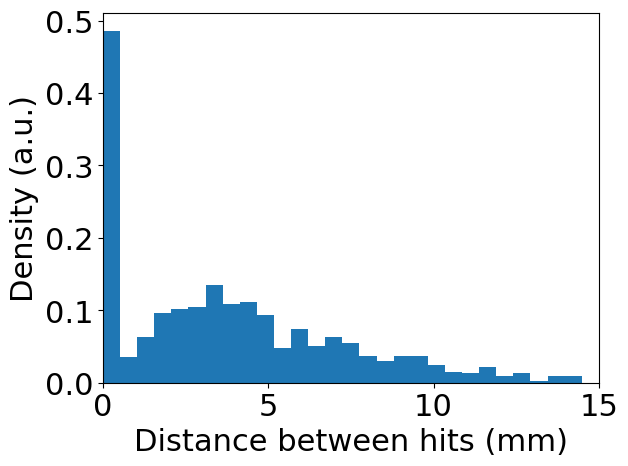

In [104]:
plt.hist(np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1),bins=100,density=True);
plt.xlabel('Distance between hits (mm)')
plt.ylabel('Density (a.u.)')
plt.xlim([0,15]);

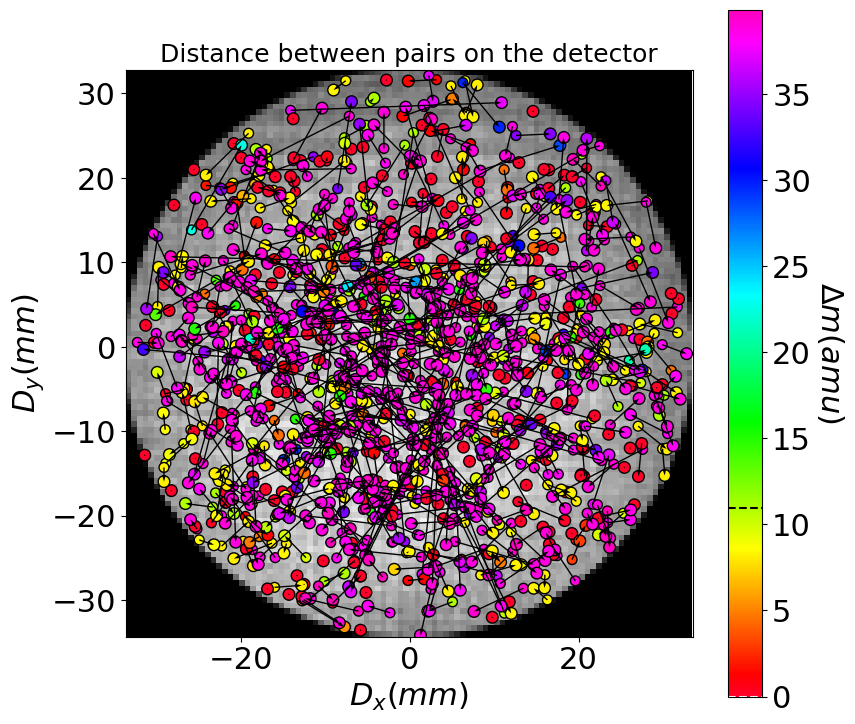

In [105]:
mass_diff = m2[ind][indices_in_bin]-m1[ind][indices_in_bin]
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx,dy,bins=100,cmap = matplotlib.colormaps['gray'])
cm = matplotlib.colormaps['gist_rainbow']
sc = plt.scatter(det_coord_pair_1[:,0],det_coord_pair_1[:,1],edgecolors='k',c=mass_diff,s=50,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
plt.scatter(det_coord_pair_2[:,0],det_coord_pair_2[:,1],edgecolors = 'k',c=mass_diff,s=70,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
cbar = plt.colorbar(sc)
cbar.ax.axhline(np.median(mass_diff), c='k',ls='--')
cbar.ax.axhline(np.abs(m2d[-1]-m1d[-1]),c='w',ls='--')
plt.quiver(det_coord_pair_1[:,0],det_coord_pair_1[:,1],det_coord_pair_2[:,0]-det_coord_pair_1[:,0],det_coord_pair_2[:,1]-det_coord_pair_1[:,1],angles='xy', scale_units='xy', scale=1)
plt.axis('square')

cbar.set_label('$\Delta m (amu)$', rotation=270,labelpad=25)
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout()
plt.title('Distance between pairs on the detector',fontdict={'fontsize':18});
#plt.savefig('reaction_2_FeO_detector.jpeg',dpi=300);


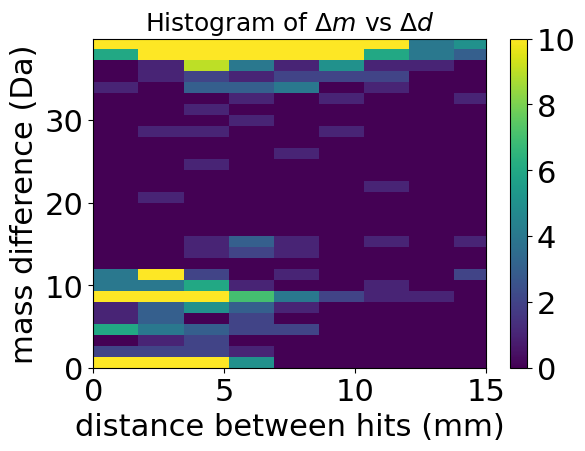

In [106]:
plt.hist2d(dist_coord,m2[ind][indices_in_bin]-m1[ind][indices_in_bin], bins=30,vmin=0,vmax=10)
plt.colorbar()
plt.xlabel('distance between hits (mm)')
plt.ylabel('mass difference (Da)')
plt.xlim([0,15])
plt.tight_layout()
plt.title(r'Histogram of $\Delta m$ vs $\Delta d $',fontdict={'fontsize':18});
#plt.savefig('reaction_modified_2_FeO_detector_dist.jpg',dpi=300);

### 29 $Fe_2O_3^{+2} \rightarrow FeO^{+1} + FeO_2^{+1}  : \Delta E= -1.21 eV$

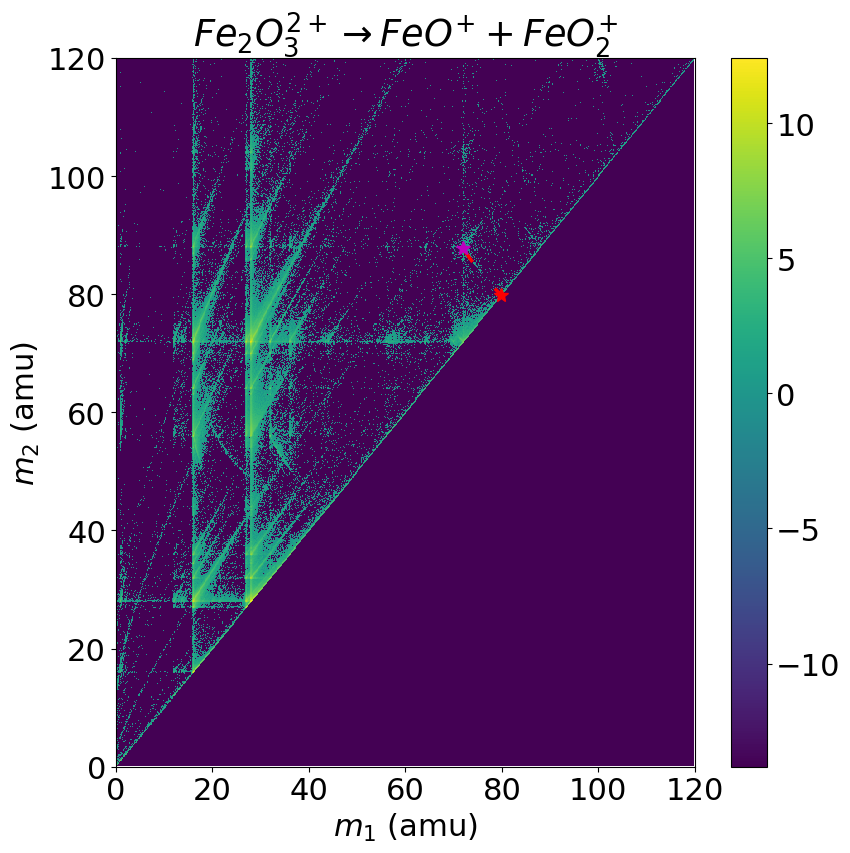

In [120]:
m1, m2, new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)

ind = np.where((m1 < 120) & (m2 < 120))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)
X, Y = np.meshgrid(m1e, m2e)
row = neg_pairs.iloc[29]
mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)
m1d,m2d = corr.diss_track(md2,md1,mp,interp_points=100) 

plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})
bins_along_track = np.unique(np.array([np.digitize(m1d,m1e)-2,np.digitize(m2d,m2e)-2]).T,axis=0)
hits_along_track = h[bins_along_track[:,0],bins_along_track[:,1]][::-1] 

plt.pcolormesh(X, Y, np.log(h + 1e-6))
plt.plot(m2d, m1d,'r',lw=2.5,ls='dashed',dashes=(5,10))
plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
plt.plot(m2d[0], m1d[0], 'm*',ms=10)
plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.xlim([0, 120])
plt.ylim([0, 120])
plt.title(r'$Fe_2O_3 ^{2+} \rightarrow FeO^{+} + FeO_2^{+}$')
plt.tight_layout()
plt.show()

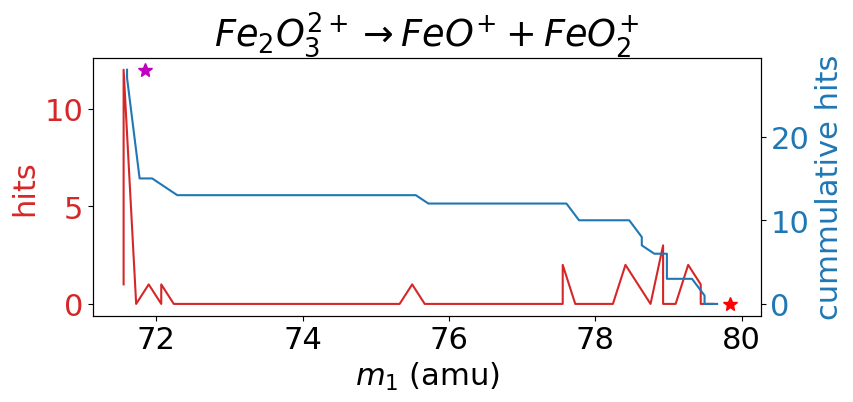

In [121]:
#plt.figure(figsize=(9, 8))
fig, ax1 = plt.subplots(figsize=(9,4))

color = 'tab:red'
ax1.set_xlabel('$m_1$ (amu)')
ax1.set_ylabel('hits', color=color)
ax1.plot(np.sort(m1e[bins_along_track[:,1]])[::-1],hits_along_track, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('cummulative hits', color=color)  # we already handled the x-label with ax1
ax2.plot(np.sort(m2e[bins_along_track[:,1]])[::-1],np.cumsum(hits_along_track), color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax1.plot(m2d[-1], 0, 'r*',ms=10)
ax2.plot(m2d[0],np.cumsum(hits_along_track)[-1], 'm*',ms=10)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title(r'$Fe_2O_3 ^{2+} \rightarrow FeO^{+} + FeO_2^{+}$')
plt.show()

#### Detector impact distance of the pairs

In [122]:
indices_in_bin = diss.index_values_in_bin(m2,m1,ind,m2e,m1e,bins_along_track)
assert len(indices_in_bin)==np.cumsum(hits_along_track)[-1]
det_coord_pair_1 =np.vstack([new_dx1[ind][indices_in_bin],new_dy1[ind][indices_in_bin]]).T
det_coord_pair_2 =np.vstack([new_dx2[ind][indices_in_bin],new_dy2[ind][indices_in_bin]]).T
dist_coord = np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1)

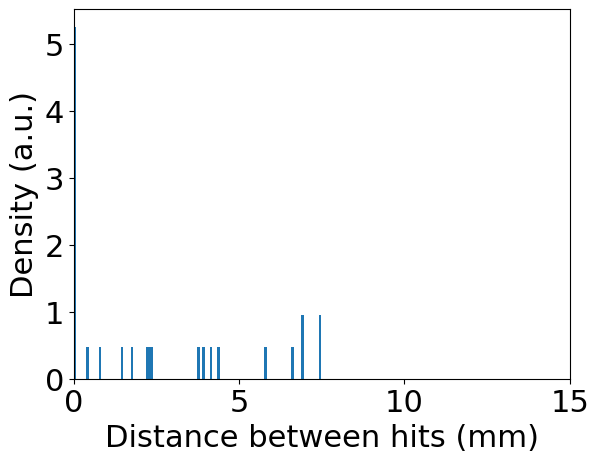

In [123]:
plt.hist(np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1),bins=100,density=True);
plt.xlabel('Distance between hits (mm)')
plt.ylabel('Density (a.u.)')
plt.xlim([0,15]);

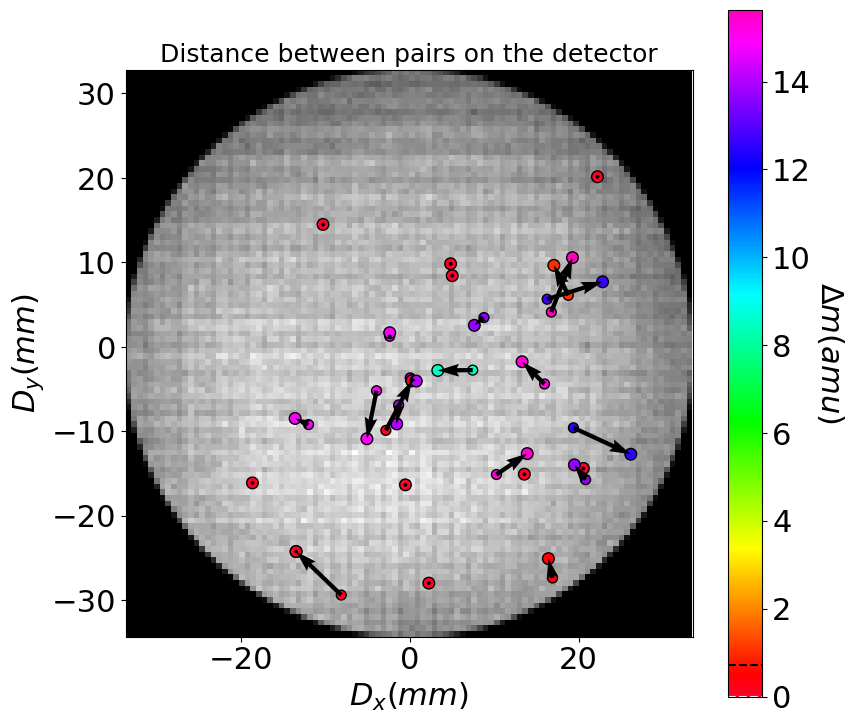

In [124]:
mass_diff = m2[ind][indices_in_bin]-m1[ind][indices_in_bin]
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx,dy,bins=100,cmap = matplotlib.colormaps['gray'])
cm = matplotlib.colormaps['gist_rainbow']
sc = plt.scatter(det_coord_pair_1[:,0],det_coord_pair_1[:,1],edgecolors='k',c=mass_diff,s=50,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
plt.scatter(det_coord_pair_2[:,0],det_coord_pair_2[:,1],edgecolors = 'k',c=mass_diff,s=70,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
cbar = plt.colorbar(sc)
cbar.ax.axhline(np.median(mass_diff), c='k',ls='--')
cbar.ax.axhline(np.abs(m2d[-1]-m1d[-1]),c='w',ls='--')
plt.quiver(det_coord_pair_1[:,0],det_coord_pair_1[:,1],det_coord_pair_2[:,0]-det_coord_pair_1[:,0],det_coord_pair_2[:,1]-det_coord_pair_1[:,1],angles='xy', scale_units='xy', scale=1)
plt.axis('square')

cbar.set_label('$\Delta m (amu)$', rotation=270,labelpad=25)
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout()
plt.title('Distance between pairs on the detector',fontdict={'fontsize':18});
#plt.savefig('reaction_2_FeO_detector.jpeg',dpi=300);


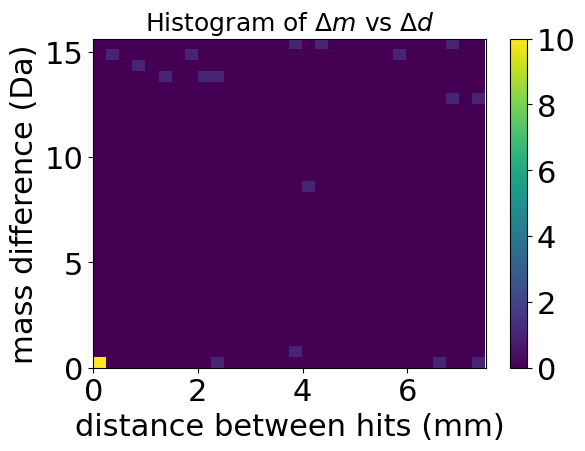

In [125]:
plt.hist2d(dist_coord,m2[ind][indices_in_bin]-m1[ind][indices_in_bin], bins=30,vmin=0,vmax=10)
plt.colorbar()
plt.xlabel('distance between hits (mm)')
plt.ylabel('mass difference (Da)')
plt.xlim([0,7.5])
plt.tight_layout()
plt.title(r'Histogram of $\Delta m$ vs $\Delta d $',fontdict={'fontsize':18});
#plt.savefig('reaction_modified_2_FeO_detector_dist.jpg',dpi=300);

### 39 $Fe_2O_4^{+2} \rightarrow FeO^{+1} + FeO_3^{+1}  : \Delta E= -1.83 eV$

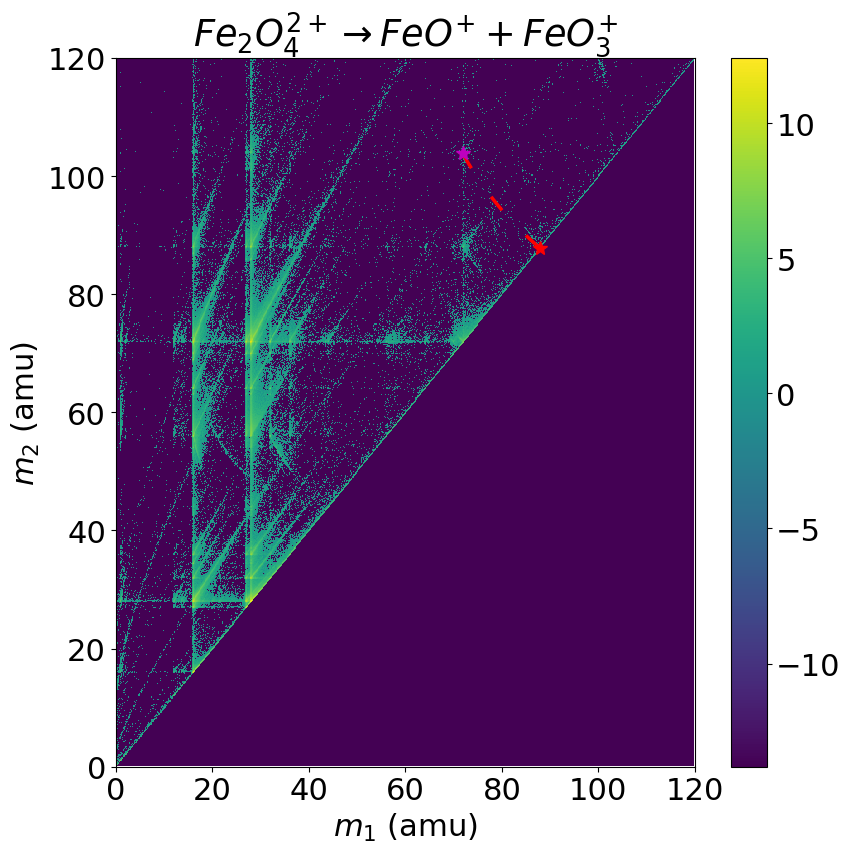

In [126]:
m1, m2, new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)

ind = np.where((m1 < 120) & (m2 < 120))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)
X, Y = np.meshgrid(m1e, m2e)
row = neg_pairs.iloc[39]
mp,md1,md2 = diss.associate_mass(elements_mass=elements_mass,react_dict=row)
m1d,m2d = corr.diss_track(md2,md1,mp,interp_points=100) 

plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})
bins_along_track = np.unique(np.array([np.digitize(m1d,m1e)-2,np.digitize(m2d,m2e)-2]).T,axis=0)
hits_along_track = h[bins_along_track[:,0],bins_along_track[:,1]][::-1] 

plt.pcolormesh(X, Y, np.log(h + 1e-6))
plt.plot(m2d, m1d,'r',lw=2.5,ls='dashed',dashes=(5,10))
plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
plt.plot(m2d[0], m1d[0], 'm*',ms=10)
plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.xlim([0, 120])
plt.ylim([0, 120])
plt.title(r'$Fe_2O_4 ^{2+} \rightarrow FeO^{+} + FeO_3^{+}$')
plt.tight_layout()
plt.show()

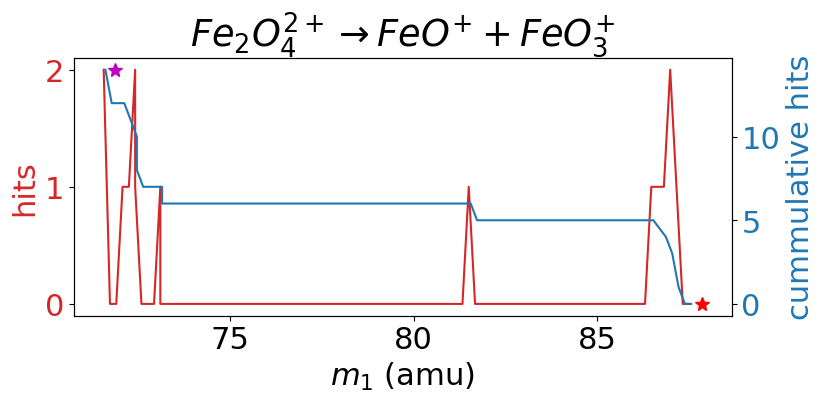

In [127]:
#plt.figure(figsize=(9, 8))
fig, ax1 = plt.subplots(figsize=(9,4))

color = 'tab:red'
ax1.set_xlabel('$m_1$ (amu)')
ax1.set_ylabel('hits', color=color)
ax1.plot(np.sort(m1e[bins_along_track[:,1]])[::-1],hits_along_track, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('cummulative hits', color=color)  # we already handled the x-label with ax1
ax2.plot(np.sort(m2e[bins_along_track[:,1]])[::-1],np.cumsum(hits_along_track), color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax1.plot(m2d[-1], 0, 'r*',ms=10)
ax2.plot(m2d[0],np.cumsum(hits_along_track)[-1], 'm*',ms=10)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title(r'$Fe_2O_4 ^{2+} \rightarrow FeO^{+} + FeO_3^{+}$')
plt.show()

#### Detector impact distance of the pairs

In [128]:
indices_in_bin = diss.index_values_in_bin(m2,m1,ind,m2e,m1e,bins_along_track)
assert len(indices_in_bin)==np.cumsum(hits_along_track)[-1]
det_coord_pair_1 =np.vstack([new_dx1[ind][indices_in_bin],new_dy1[ind][indices_in_bin]]).T
det_coord_pair_2 =np.vstack([new_dx2[ind][indices_in_bin],new_dy2[ind][indices_in_bin]]).T
dist_coord = np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1)

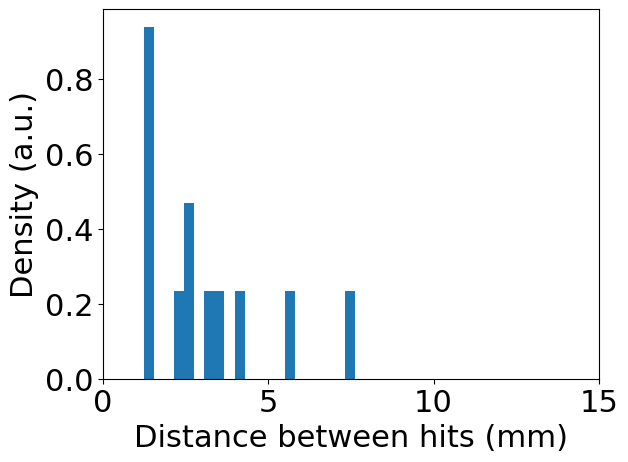

In [129]:
plt.hist(np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1),bins=100,density=True);
plt.xlabel('Distance between hits (mm)')
plt.ylabel('Density (a.u.)')
plt.xlim([0,15]);

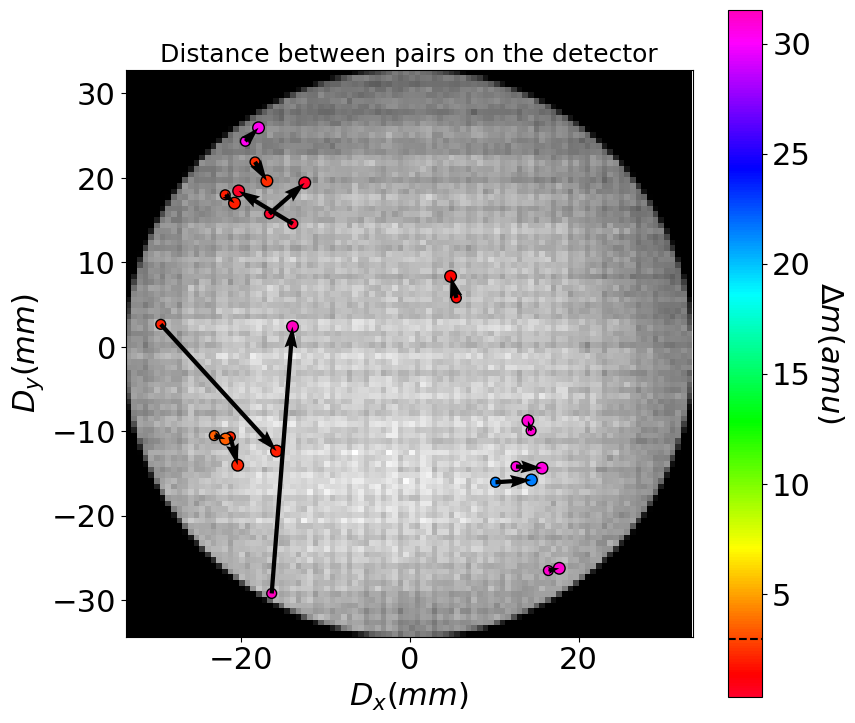

In [130]:
mass_diff = m2[ind][indices_in_bin]-m1[ind][indices_in_bin]
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx,dy,bins=100,cmap = matplotlib.colormaps['gray'])
cm = matplotlib.colormaps['gist_rainbow']
sc = plt.scatter(det_coord_pair_1[:,0],det_coord_pair_1[:,1],edgecolors='k',c=mass_diff,s=50,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
plt.scatter(det_coord_pair_2[:,0],det_coord_pair_2[:,1],edgecolors = 'k',c=mass_diff,s=70,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
cbar = plt.colorbar(sc)
cbar.ax.axhline(np.median(mass_diff), c='k',ls='--')
cbar.ax.axhline(np.abs(m2d[-1]-m1d[-1]),c='w',ls='--')
plt.quiver(det_coord_pair_1[:,0],det_coord_pair_1[:,1],det_coord_pair_2[:,0]-det_coord_pair_1[:,0],det_coord_pair_2[:,1]-det_coord_pair_1[:,1],angles='xy', scale_units='xy', scale=1)
plt.axis('square')

cbar.set_label('$\Delta m (amu)$', rotation=270,labelpad=25)
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout()
plt.title('Distance between pairs on the detector',fontdict={'fontsize':18});
#plt.savefig('reaction_2_FeO_detector.jpeg',dpi=300);


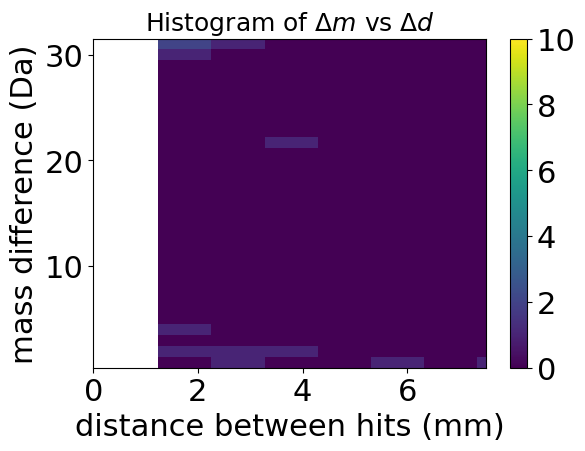

In [131]:
plt.hist2d(dist_coord,m2[ind][indices_in_bin]-m1[ind][indices_in_bin], bins=30,vmin=0,vmax=10)
plt.colorbar()
plt.xlabel('distance between hits (mm)')
plt.ylabel('mass difference (Da)')
plt.xlim([0,7.5])
plt.tight_layout()
plt.title(r'Histogram of $\Delta m$ vs $\Delta d $',fontdict={'fontsize':18});
#plt.savefig('reaction_modified_2_FeO_detector_dist.jpg',dpi=300);

# Testing something

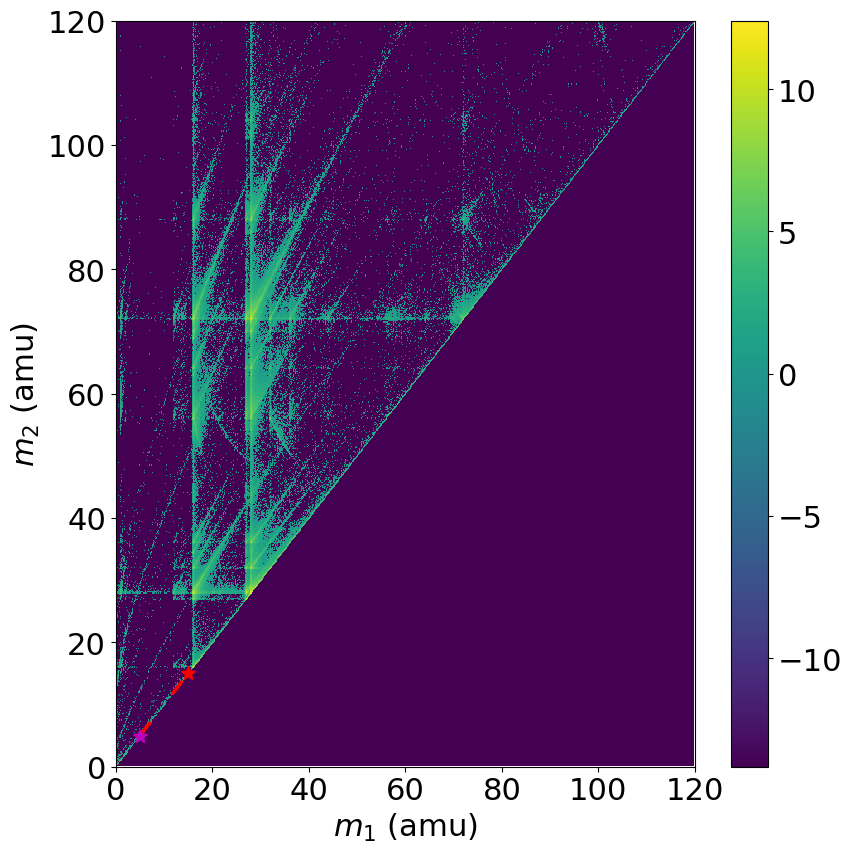

In [163]:
m1, m2, new_dx1, new_dy1, new_dx2, new_dy2 = corr.get_pairs(epos)

ind = np.where((m1 < 120) & (m2 < 120))
h, m1e, m2e = corr.corr_his(m1[ind], m2[ind], nbins=700)
X, Y = np.meshgrid(m1e, m2e)

m1d,m2d = corr.diss_track(5,5,15,interp_points=100) 

plt.figure(figsize=(9, 9))
plt.rcParams.update({'font.size': 22})
bins_along_track = np.unique(np.array([np.digitize(m1d,m1e)-2,np.digitize(m2d,m2e)-2]).T,axis=0)
hits_along_track = h[bins_along_track[:,0],bins_along_track[:,1]][::-1] 

plt.pcolormesh(X, Y, np.log(h + 1e-6))
plt.plot(m2d, m1d,'r',lw=2.5,ls='dashed',dashes=(5,10))
plt.plot(m2d[-1], m1d[-1], 'r*',ms=10)
plt.plot(m2d[0], m1d[0], 'm*',ms=10)
plt.xlabel('$m_1$ (amu)')
plt.ylabel('$m_2$ (amu)')
plt.colorbar()
plt.xlim([0, 120])
plt.ylim([0, 120])
#plt.title(r'$Fe_2O_4 ^{2+} \rightarrow FeO^{+} + FeO_3^{+}$')
plt.tight_layout()
plt.show()

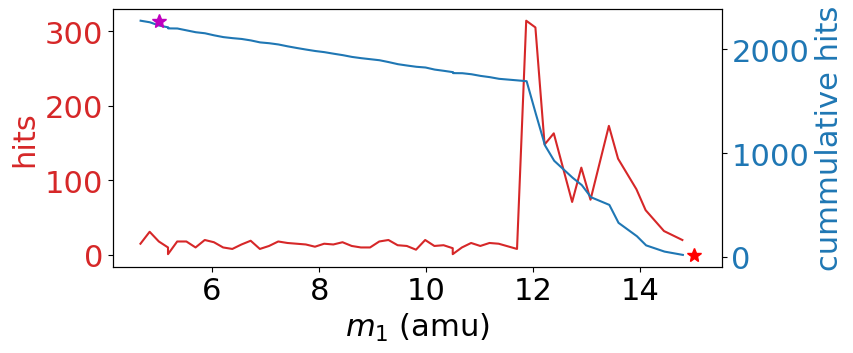

In [164]:
#plt.figure(figsize=(9, 8))
fig, ax1 = plt.subplots(figsize=(9,4))

color = 'tab:red'
ax1.set_xlabel('$m_1$ (amu)')
ax1.set_ylabel('hits', color=color)
ax1.plot(np.sort(m1e[bins_along_track[:,1]])[::-1],hits_along_track, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('cummulative hits', color=color)  # we already handled the x-label with ax1
ax2.plot(np.sort(m2e[bins_along_track[:,1]])[::-1],np.cumsum(hits_along_track), color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax1.plot(m2d[-1], 0, 'r*',ms=10)
ax2.plot(m2d[0],np.cumsum(hits_along_track)[-1], 'm*',ms=10)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
#plt.title(r'$Fe_2O_4 ^{2+} \rightarrow FeO^{+} + FeO_3^{+}$')
plt.show()

#### Detector impact distance of the pairs

In [165]:
indices_in_bin = diss.index_values_in_bin(m2,m1,ind,m2e,m1e,bins_along_track)
assert len(indices_in_bin)==np.cumsum(hits_along_track)[-1]
det_coord_pair_1 =np.vstack([new_dx1[ind][indices_in_bin],new_dy1[ind][indices_in_bin]]).T
det_coord_pair_2 =np.vstack([new_dx2[ind][indices_in_bin],new_dy2[ind][indices_in_bin]]).T
dist_coord = np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1)

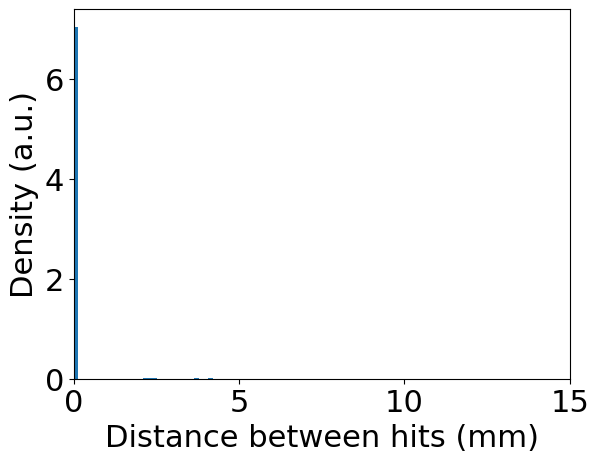

In [166]:
plt.hist(np.linalg.norm(det_coord_pair_1-det_coord_pair_2,axis=1),bins=100,density=True);
plt.xlabel('Distance between hits (mm)')
plt.ylabel('Density (a.u.)')
plt.xlim([0,15]);

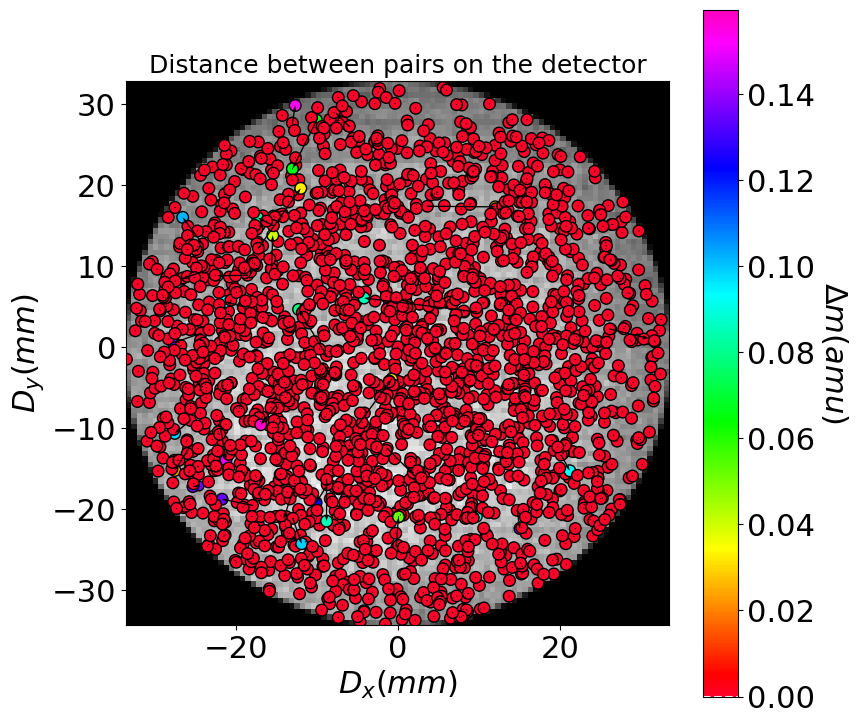

In [167]:
mass_diff = m2[ind][indices_in_bin]-m1[ind][indices_in_bin]
plt.figure(figsize=(9, 8))
plt.rcParams.update({'font.size': 22})
plt.hist2d(dx,dy,bins=100,cmap = matplotlib.colormaps['gray'])
cm = matplotlib.colormaps['gist_rainbow']
sc = plt.scatter(det_coord_pair_1[:,0],det_coord_pair_1[:,1],edgecolors='k',c=mass_diff,s=50,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
plt.scatter(det_coord_pair_2[:,0],det_coord_pair_2[:,1],edgecolors = 'k',c=mass_diff,s=70,vmin=min(mass_diff),vmax=max(mass_diff),cmap=cm)
cbar = plt.colorbar(sc)
cbar.ax.axhline(np.median(mass_diff), c='k',ls='--')
cbar.ax.axhline(np.abs(m2d[-1]-m1d[-1]),c='w',ls='--')
plt.quiver(det_coord_pair_1[:,0],det_coord_pair_1[:,1],det_coord_pair_2[:,0]-det_coord_pair_1[:,0],det_coord_pair_2[:,1]-det_coord_pair_1[:,1],angles='xy', scale_units='xy', scale=1)
plt.axis('square')

cbar.set_label('$\Delta m (amu)$', rotation=270,labelpad=25)
plt.xlabel('$D_x (mm)$')
plt.ylabel('$D_y (mm)$')
plt.tight_layout()
plt.title('Distance between pairs on the detector',fontdict={'fontsize':18});
#plt.savefig('reaction_2_FeO_detector.jpeg',dpi=300);


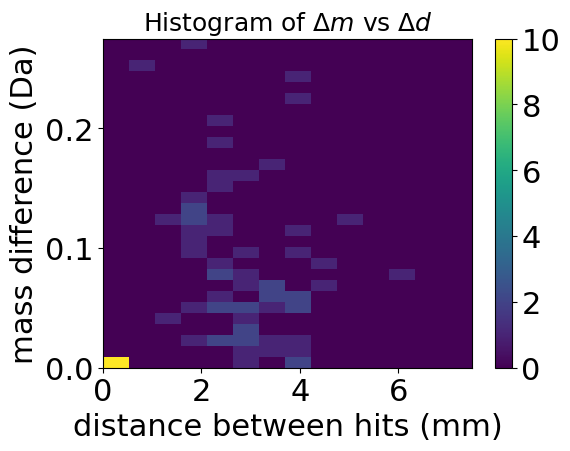

In [156]:
plt.hist2d(dist_coord,m2[ind][indices_in_bin]-m1[ind][indices_in_bin], bins=30,vmin=0,vmax=10)
plt.colorbar()
plt.xlabel('distance between hits (mm)')
plt.ylabel('mass difference (Da)')
plt.xlim([0,7.5])
plt.tight_layout()
plt.title(r'Histogram of $\Delta m$ vs $\Delta d $',fontdict={'fontsize':18});
#plt.savefig('reaction_modified_2_FeO_detector_dist.jpg',dpi=300);